In [ ]:
# @title
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


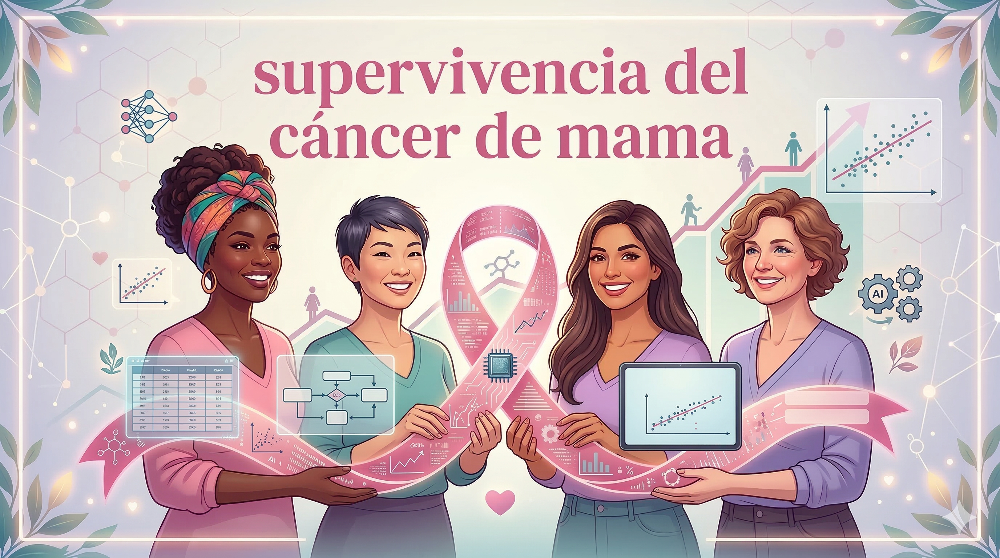

In [ ]:
# @title
from IPython.display import Image, display
display(Image("/content/drive/MyDrive/IA/portada.png"))

<div align="center">

<h1 style= "font-size:200px; ">Predicción del Tiempo de Supervivencia en Pacientes con Cáncer de Mama</h1>

<br>

Maria Jose Hernandez Aguilar - 2232999

Yerson Guillermo Antolinez Peña - 2225611

John Anderson Sotelo Rueda - 2224769

---

<br>

</div>

# Primera Entrega





##1. INTRODUCCIÓN
---

El cáncer de mama constituye una de las principales causas de morbilidad y mortalidad en mujeres a nivel mundial. Su impacto en la salud pública ha impulsado el desarrollo de herramientas estadísticas que permitan comprender mejor los factores asociados al pronóstico y evolución de la enfermedad.

El análisis de supervivencia es una rama de la estadística que estudia el tiempo transcurrido desde un evento inicial (por ejemplo, la cirugía o el diagnóstico) hasta la ocurrencia de un evento de interés, como el fallecimiento o la última visita médica registrada. Este tipo de análisis es especialmente relevante en estudios oncológicos, ya que permite evaluar la progresión de la enfermedad y la influencia de variables clínicas y biológicas en el tiempo de vida de los pacientes.

En el presente proyecto se analizará un dataset compuesto por 334 pacientes con información demográfica, biomarcadores tumorales (niveles de proteínas), características clínicas (estadio tumoral, tipo histológico, estado de receptores hormonales y tipo de cirugía) y variables temporales relacionadas con la evolución del paciente.

Este estudio busca integrar herramientas de estadística descriptiva y análisis temporal para obtener conclusiones fundamentadas sobre la supervivencia en pacientes con cáncer de mama.

###Objetivo:
Predecir la variable Survival_Time, calculada como la diferencia
en días entre Date_of_Last_Visit y Date_of_Surgery.


##Importacion de librerias

In [ ]:
# @title
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, make_scorer
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

##Carga del dataset


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# @title
df = pd.read_csv('/content/drive/MyDrive/IA/breast_cancer_survival.csv')##Cambiar la ruta dependiendo de donde este el archivo

In [ ]:
# @title
# 1. Asegurarnos de que ambas columnas tengan formato de fecha (datetime)
df['Date_of_Last_Visit'] = pd.to_datetime(df['Date_of_Last_Visit'])
df['Date_of_Surgery'] = pd.to_datetime(df['Date_of_Surgery'])

# 2. Crear la nueva variable Survival_Time restando las fechas
df['Survival_Time'] = df['Date_of_Last_Visit'] - df['Date_of_Surgery']

# 3. Ver el resultado en las primeras filas
df[['Date_of_Surgery', 'Date_of_Last_Visit', 'Survival_Time']].head()

,Date_of_Surgery,Date_of_Last_Visit,Survival_Time
0,2018-05-20,2018-08-26,98 days
1,2018-04-26,2019-01-25,274 days
2,2018-08-24,2020-04-08,593 days
3,2018-11-16,2020-07-28,620 days
4,2018-12-12,2019-01-05,24 days


In [ ]:
# @title
# 7. CREAR VARIABLE OBJETIVO
# Survival_Time = diferencia en días entre última visita y cirugía
df["Survival_Time"] = (df["Date_of_Last_Visit"] - df["Date_of_Surgery"]).dt.days

df[["Date_of_Surgery", "Date_of_Last_Visit", "Survival_Time"]].head()
df.head()

,Age,Gender,Protein1,Protein2,Protein3,Protein4,Tumour_Stage,Histology,ER status,PR status,HER2 status,Surgery_type,Date_of_Surgery,Date_of_Last_Visit,Patient_Status,Survival_Time
0,42,FEMALE,0.95256,2.15000,0.007972,-0.048340,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-05-20,2018-08-26,Alive,98.0
1,54,FEMALE,0.00000,1.38020,-0.498030,-0.507320,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-04-26,2019-01-25,Dead,274.0
2,63,FEMALE,-0.52303,1.76400,-0.370190,0.010815,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Lumpectomy,2018-08-24,2020-04-08,Alive,593.0
3,78,FEMALE,-0.87618,0.12943,-0.370380,0.132190,I,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-11-16,2020-07-28,Alive,620.0
4,42,FEMALE,0.22611,1.74910,-0.543970,-0.390210,II,Infiltrating Ductal Carcinoma,Positive,Positive,Positive,Lumpectomy,2018-12-12,2019-01-05,Alive,24.0


In [ ]:
# @title
df.shape

(334, 16)

In [ ]:
# @title
df.describe()
df.columns
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 334 entries, 0 to 333
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Age                 334 non-null    int64         
 1   Gender              334 non-null    object        
 2   Protein1            334 non-null    float64       
 3   Protein2            334 non-null    float64       
 4   Protein3            334 non-null    float64       
 5   Protein4            334 non-null    float64       
 6   Tumour_Stage        334 non-null    object        
 7   Histology           334 non-null    object        
 8   ER status           334 non-null    object        
 9   PR status           334 non-null    object        
 10  HER2 status         334 non-null    object        
 11  Surgery_type        334 non-null    object        
 12  Date_of_Surgery     334 non-null    datetime64[ns]
 13  Date_of_Last_Visit  317 non-null    datetime64[ns]

,Age,Gender,Protein1,Protein2,Protein3,Protein4,Tumour_Stage,Histology,ER status,PR status,HER2 status,Surgery_type,Date_of_Surgery,Date_of_Last_Visit,Patient_Status,Survival_Time
0,42,FEMALE,0.95256,2.15000,0.007972,-0.048340,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-05-20,2018-08-26,Alive,98.0
1,54,FEMALE,0.00000,1.38020,-0.498030,-0.507320,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-04-26,2019-01-25,Dead,274.0
2,63,FEMALE,-0.52303,1.76400,-0.370190,0.010815,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Lumpectomy,2018-08-24,2020-04-08,Alive,593.0
3,78,FEMALE,-0.87618,0.12943,-0.370380,0.132190,I,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-11-16,2020-07-28,Alive,620.0
4,42,FEMALE,0.22611,1.74910,-0.543970,-0.390210,II,Infiltrating Ductal Carcinoma,Positive,Positive,Positive,Lumpectomy,2018-12-12,2019-01-05,Alive,24.0


## Descripción de Variables del Dataset

| Variable | Tipo | Descripción |
|--------|------|-------------|
| Patient_ID | Identificador | ID único asignado a cada paciente dentro del dataset |
| Age | Numérica | Edad del paciente al momento del diagnóstico |
| Gender | Categórica | Género del paciente |
| Protein1 | Numérica | Nivel de la proteína biomarcadora 1 asociada al cáncer |
| Protein2 | Numérica | Nivel de la proteína biomarcadora 2 asociada al cáncer |
| Protein3 | Numérica | Nivel de la proteína biomarcadora 3 asociada al cáncer |
| Protein4 | Numérica | Nivel de la proteína biomarcadora 4 asociada al cáncer |
| Tumour_Stage | Categórica | Etapa del tumor (I, II, III, IV) que indica el avance del cáncer |
| Histology | Categórica | Tipo histológico del tumor identificado en el análisis médico |
| ER_status | Categórica | Estado del receptor de estrógeno (positivo o negativo) |
| PR_status | Categórica | Estado del receptor de progesterona (positivo o negativo) |
| HER2_status | Categórica | Estado del receptor HER2 asociado al crecimiento tumoral |
| Surgery_type | Categórica | Tipo de cirugía realizada al paciente |
| Date_of_Surgery | Fecha | Fecha en la que se realizó la cirugía del tumor |
| Date_of_Last_Visit | Fecha | Fecha de la última visita o seguimiento médico del paciente |
| Survival_Time | Numérica | Tiempo de supervivencia del paciente calculado entre la cirugía y la última visita médica |

##**Variables numericas**

In [ ]:
# @title
df.select_dtypes(include=['int64','float64']).columns

Index(['Age', 'Protein1', 'Protein2', 'Protein3', 'Protein4', 'Survival_Time'], dtype='object')

## **Variables categoricas**

In [ ]:
# @title
df.select_dtypes(include=['object']).columns

Index(['Gender', 'Tumour_Stage', 'Histology', 'ER status', 'PR status',
       'HER2 status', 'Surgery_type', 'Patient_Status'],
      dtype='object')

###

###Detección de valores atípicos (Outliers)

Lo primero sera mediante un grafico de bigotes ver los valores outliers para las proteinas

Para la detección de valores atípicos nos enfocamos principalmente en las variables numéricas continuas, en este caso las proteínas (Protein1, Protein2, Protein3, Protein4). Estas variables representan mediciones biológicas y pueden presentar valores extremos debido a variaciones experimentales o errores de medición.

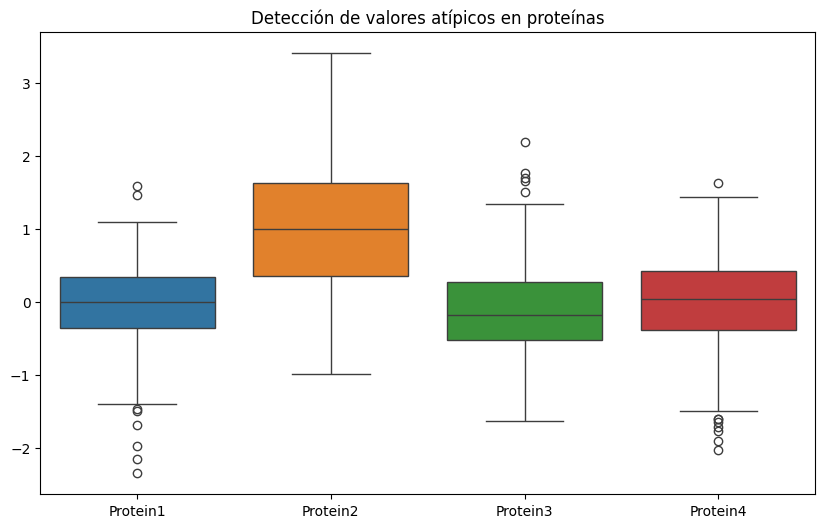

In [ ]:
# @title
plt.figure(figsize=(10,6))
sns.boxplot(data=df[['Protein1','Protein2','Protein3','Protein4']])
plt.title("Detección de valores atípicos en proteínas")
plt.show()
df_before = df.copy() ##Es una copia del dataset original, sirve para hacer una comparativa despues

Como vemos que se muestran algunos valores atipicos, vamos a calcular el rango intercuartilico,  mostrando los limites superiores y inferiores, mostrando cuantos valores atipicos hay por cada proteina y borrandolos respectivamente

In [ ]:
# @title
for col in ['Protein1','Protein2','Protein3','Protein4']:

    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    print(f"\nColumna: {col}")
    print(f"Q1 (25%): {Q1}")
    print(f"Q3 (75%): {Q3}")
    print(f"IQR: {IQR}")
    print(f"Límite inferior: {lower}")
    print(f"Límite superior: {upper}")

    # Identificar outliers antes de eliminarlos
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    print(f"Cantidad de outliers detectados: {outliers.shape[0]}")

    # Aplicar limpieza
    df = df[(df[col] >= lower) & (df[col] <= upper)]


Columna: Protein1
Q1 (25%): -0.3588875
Q3 (75%): 0.3435975
IQR: 0.702485
Límite inferior: -1.412615
Límite superior: 1.397325
Cantidad de outliers detectados: 8

Columna: Protein2
Q1 (25%): 0.39333999999999997
Q3 (75%): 1.6382249999999998
IQR: 1.2448849999999998
Límite inferior: -1.4739874999999996
Límite superior: 3.5055524999999994
Cantidad de outliers detectados: 0

Columna: Protein3
Q1 (25%): -0.51802
Q3 (75%): 0.28093250000000003
IQR: 0.7989525000000001
Límite inferior: -1.71644875
Límite superior: 1.4793612500000002
Cantidad de outliers detectados: 5

Columna: Protein4
Q1 (25%): -0.35492
Q3 (75%): 0.42886
IQR: 0.78378
Límite inferior: -1.5305900000000001
Límite superior: 1.60453
Cantidad de outliers detectados: 7


Para hacer la comparativa visual, mostramos 2 suplots para verificar que efectivamente quitamos los outliers

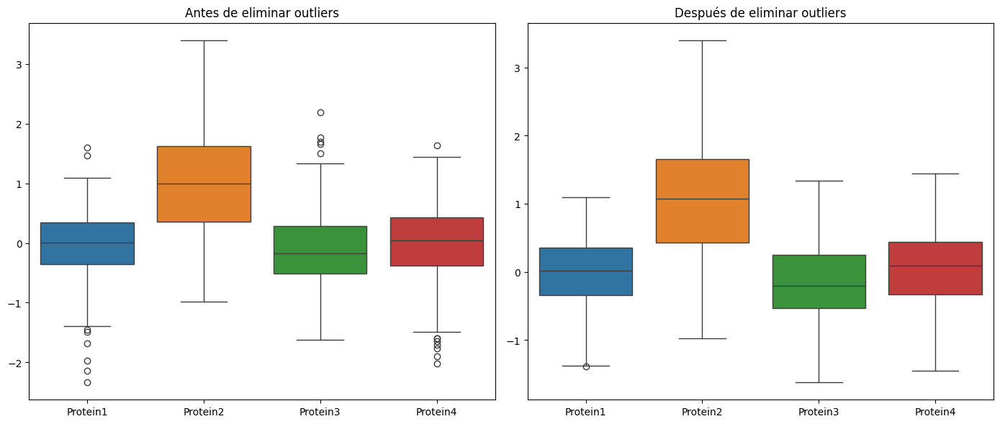

In [ ]:
# @title
fig, axes = plt.subplots(1, 2, figsize=(14,6))

# Antes de limpiar
sns.boxplot(data=df_before[['Protein1','Protein2','Protein3','Protein4']], ax=axes[0])
axes[0].set_title("Antes de eliminar outliers")

# Después de limpiar
sns.boxplot(data=df[['Protein1','Protein2','Protein3','Protein4']], ax=axes[1])
axes[1].set_title("Después de eliminar outliers")

plt.tight_layout()
plt.show()

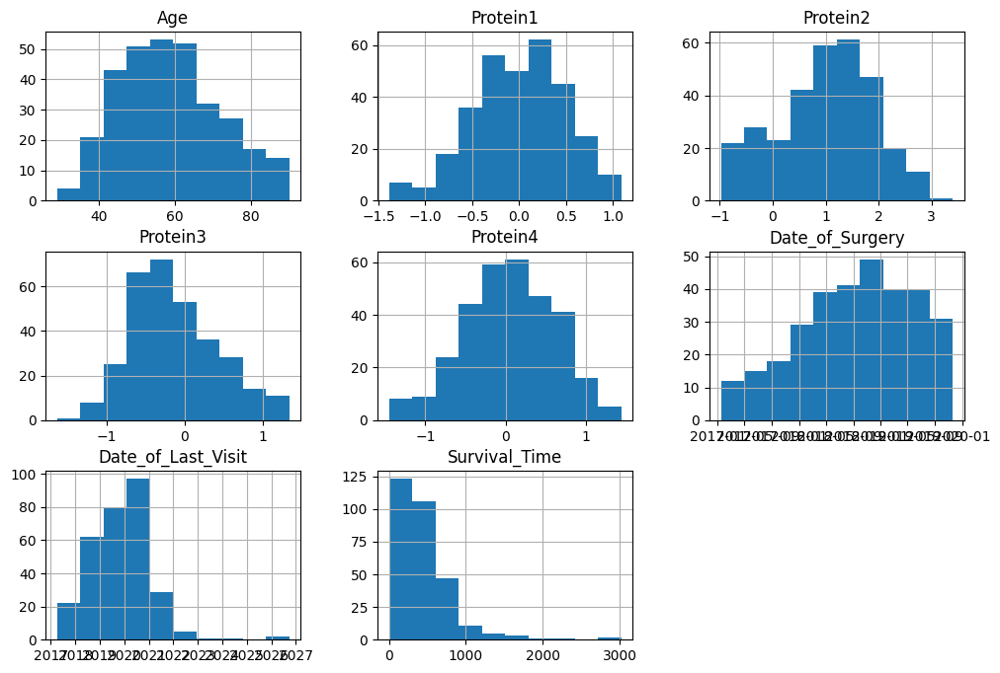

In [ ]:
df.hist(figsize=(12,8))
plt.show()

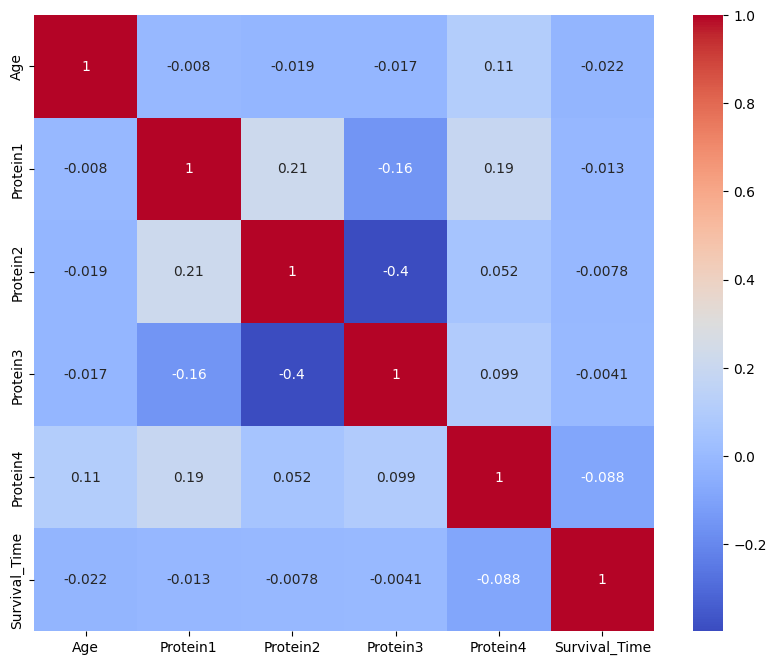

In [ ]:
plt.figure(figsize=(10,8))
# Select only numerical columns for correlation calculation
numeric_df = df.select_dtypes(include=[np.number])
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.show()

### Valores faltantes y tratamiento de los mismos

En esta etapa verificamos si existen valores faltantes dentro del dataset.
Los valores nulos pueden afectar el análisis estadístico y el entrenamiento de modelos de aprendizaje automático, por lo que es importante identificarlos antes de continuar con el análisis.

In [ ]:
df.isnull().sum().sort_values(ascending=False)

,0
Date_of_Last_Visit,15
Survival_Time,15
Patient_Status,11
Age,0
Protein3,0
Gender,0
Protein1,0
Protein2,0
Histology,0
Tumour_Stage,0


Verificamos coinsidencias entre las variables Date_of_Last_Visit y Patient_Status, en caso de que coinsidan podremos borrar algunos datos

In [ ]:
df[df['Date_of_Last_Visit'].isnull() & df['Patient_Status'].isnull() & df['Survival_Time'].isnull()]

,Age,Gender,Protein1,Protein2,Protein3,Protein4,Tumour_Stage,Histology,ER status,PR status,HER2 status,Surgery_type,Date_of_Surgery,Date_of_Last_Visit,Patient_Status,Survival_Time
9,62,FEMALE,0.649340,1.81680,0.279260,0.13228,II,Infiltrating Lobular Carcinoma,Positive,Positive,Negative,Other,2019-06-20,NaT,NaN,NaN
18,46,FEMALE,-0.010999,0.86749,0.281570,-0.54588,II,Infiltrating Lobular Carcinoma,Positive,Positive,Negative,Other,2019-06-10,NaT,NaN,NaN
60,56,FEMALE,-0.675420,0.26937,-0.086603,1.07140,III,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Modified Radical Mastectomy,2019-08-23,NaT,NaN,NaN
188,44,FEMALE,-0.278840,2.16880,-0.462330,0.27220,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Modified Radical Mastectomy,2018-01-20,NaT,NaN,NaN
200,55,FEMALE,0.330640,0.84757,-0.494660,0.11656,I,Infiltrating Lobular Carcinoma,Positive,Positive,Negative,Modified Radical Mastectomy,2017-11-07,NaT,NaN,NaN
202,71,FEMALE,0.394090,1.70540,0.035642,1.44100,II,Infiltrating Lobular Carcinoma,Positive,Positive,Negative,Modified Radical Mastectomy,2018-11-26,NaT,NaN,NaN
214,80,FEMALE,0.670770,-0.71039,0.186480,0.14664,II,Infiltrating Lobular Carcinoma,Positive,Positive,Negative,Other,2019-06-14,NaT,NaN,NaN
230,60,FEMALE,0.532420,1.54110,-1.009500,-0.12588,I,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2017-12-11,NaT,NaN,NaN
231,50,FEMALE,-0.322890,0.98848,-0.293130,-0.26170,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-11-16,NaT,NaN,NaN
272,67,FEMALE,0.317420,-0.55585,0.356570,0.79733,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2019-10-02,NaT,NaN,NaN


Los datos que hayan coinsidido anteriormente, los borraremos ya que tienen muchos Nan

In [ ]:
df = df[~(df['Date_of_Last_Visit'].isnull() & df['Patient_Status'].isnull()&  df['Survival_Time'].isnull())]

Verificamos cuales valores estan vacios

In [ ]:
df.isnull().sum().sort_values(ascending=False)

,0
Date_of_Last_Visit,4
Survival_Time,4
Age,0
Gender,0
Protein3,0
Protein4,0
Protein1,0
Protein2,0
Histology,0
Tumour_Stage,0


Decidimos eliminar algunos registros que contienen valores faltantes en variables clave relacionadas con las fechas del seguimiento médico (Date_of_Last_Visit)

In [ ]:
df = df.dropna(subset=['Date_of_Last_Visit', 'Survival_Time'])

###Modificacion de algunas variables categoricas


Las variables tipo object no es buena idea trabajarlas en ese formato, por ende lo ideal es convertirlas a category

In [ ]:
categorical_cols = [
    'Gender','Tumour_Stage','Histology',
    'ER status','PR status','HER2 status',
    'Surgery_type','Patient_Status'
]

for col in categorical_cols:
    df[col] = df[col].astype('category')

Asi mismo para las variables de tipo tiempo, les asignaremos el formato datetime

In [ ]:
df['Date_of_Surgery'] = pd.to_datetime(df['Date_of_Surgery'])
df['Date_of_Last_Visit'] = pd.to_datetime(df['Date_of_Last_Visit'])

Ahora tambien vamos a cambiar la columna Patient_Status, ya que esta como tiene 2 estados, alive y dead, los renombraremos de la siguiente manera

Alive --> 1

Dead --> 0

In [ ]:
# Patient Status: Alive = 1, Dead = 0
df['Patient_Status'] = df['Patient_Status'].map({
    'Alive': 1,
    'Dead': 0
})




In [ ]:
# female = 1, male = 0
df['Gender'] = df['Gender'].map({'FEMALE': 1, 'MALE': 0})

In [ ]:
# ER, PR, HER2 status: Positive = 1, Negative = 0
status_cols = ['ER status', 'PR status', 'HER2 status']
for col in status_cols: df[col] = df[col].map({'Positive': 1, 'Negative': 0})

In [ ]:
# Tumour_Stage: I = 1, II = 2, III = 3
df['Tumour_Stage'] = df['Tumour_Stage'].map({'I': 1, 'II': 2, 'III': 3})

## Propiedades del dataset despues de la limpieza



###df.head()


In [ ]:
df.head()

,Age,Gender,Protein1,Protein2,Protein3,Protein4,Tumour_Stage,Histology,ER status,PR status,HER2 status,Surgery_type,Date_of_Surgery,Date_of_Last_Visit,Patient_Status,Survival_Time
0,42,1,0.95256,2.15000,0.007972,-0.048340,2,Infiltrating Ductal Carcinoma,1,1,0,Other,2018-05-20,2018-08-26,1,98.0
1,54,1,0.00000,1.38020,-0.498030,-0.507320,2,Infiltrating Ductal Carcinoma,1,1,0,Other,2018-04-26,2019-01-25,0,274.0
2,63,1,-0.52303,1.76400,-0.370190,0.010815,2,Infiltrating Ductal Carcinoma,1,1,0,Lumpectomy,2018-08-24,2020-04-08,1,593.0
3,78,1,-0.87618,0.12943,-0.370380,0.132190,1,Infiltrating Ductal Carcinoma,1,1,0,Other,2018-11-16,2020-07-28,1,620.0
4,42,1,0.22611,1.74910,-0.543970,-0.390210,2,Infiltrating Ductal Carcinoma,1,1,1,Lumpectomy,2018-12-12,2019-01-05,1,24.0


###df.shape


In [ ]:
df.shape

(299, 16)

Un observacion clave para tener en cuenta al momento de manejar de ahora en adelante el dataset es que pasamos de 334 filas a 299, es decir, en todo el proceso de limpieza borramos 35 filas

###df.columns

In [ ]:
df.columns

Index(['Age', 'Gender', 'Protein1', 'Protein2', 'Protein3', 'Protein4',
       'Tumour_Stage', 'Histology', 'ER status', 'PR status', 'HER2 status',
       'Surgery_type', 'Date_of_Surgery', 'Date_of_Last_Visit',
       'Patient_Status', 'Survival_Time'],
      dtype='object')

###df.info()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 299 entries, 0 to 333
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Age                 299 non-null    int64         
 1   Gender              299 non-null    category      
 2   Protein1            299 non-null    float64       
 3   Protein2            299 non-null    float64       
 4   Protein3            299 non-null    float64       
 5   Protein4            299 non-null    float64       
 6   Tumour_Stage        299 non-null    category      
 7   Histology           299 non-null    category      
 8   ER status           299 non-null    category      
 9   PR status           299 non-null    category      
 10  HER2 status         299 non-null    category      
 11  Surgery_type        299 non-null    category      
 12  Date_of_Surgery     299 non-null    datetime64[ns]
 13  Date_of_Last_Visit  299 non-null    datetime64[ns]
 14 

los tipos de datos cambiaron correctamente

**Variables numericas**

In [ ]:
df.select_dtypes(include=['int64','float64']).columns

Index(['Age', 'Protein1', 'Protein2', 'Protein3', 'Protein4', 'Survival_Time'], dtype='object')

**Variables categoricas**

In [ ]:
df.select_dtypes(include=['object']).columns

Index([], dtype='object')

#Segunda Entrega

## USANDO EL METODO DE REGRECION LINEAL

En este proyecto se utiliza un modelo de **regresión lineal** debido a que la variable objetivo del análisis es **Survival_Time**, que representa el tiempo de supervivencia del paciente medido en días.

La regresión lineal es adecuada cuando la variable que se desea predecir es **numérica y continua**, como en este caso.

Por otro lado, los modelos de **clasificación** se utilizan cuando la variable objetivo pertenece a categorías discretas, por ejemplo:

- Sobrevive / No sobrevive
- Tumor benigno / maligno
- Riesgo alto / riesgo bajo

En este dataset, el objetivo no es clasificar a los pacientes en categorías, sino **estimar el número de días de supervivencia después de la cirugía**, lo cual corresponde a un problema de **regresión**.

Además, las variables disponibles en el dataset, como los niveles de proteínas biomarcadoras (Protein1–Protein4), la edad del paciente y las características del tumor, pueden tener una relación lineal con el tiempo de supervivencia, lo que hace que la **regresión lineal sea un buen punto de partida para el modelado predictivo**.


In [ ]:
features = ['Age','Protein1','Protein2','Protein3','Protein4']

X = df[features]
y = df['Survival_Time']

###Se seleccionaron variables numéricas relacionadas con biomarcadores y edad del paciente, ya que estas podrían influir en el tiempo de supervivencia.

### Particionado del Dataset (80/20)

Se divide el dataset en conjunto de entrenamiento (80%) y prueba (20%) aplicando `shuffle=True` para garantizar una distribución aleatoria de los datos, evitando sesgos por el orden original del dataset.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

features = [
    'Age', 'Protein1', 'Protein2', 'Protein3', 'Protein4',
    'Tumour_Stage', 'ER status', 'PR status', 'HER2 status'
]

X = df[features]
y = df['Survival_Time']

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    shuffle=True,
    random_state=42
)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

print(f"Total de muestras:       {len(df)}")
print(f"Entrenamiento (80%):     {X_train.shape[0]} muestras")
print(f"Prueba (20%):            {X_test.shape[0]} muestras")
print(f"Features utilizadas:     {X_train.shape[1]}")

Total de muestras:       299
Entrenamiento (80%):     239 muestras
Prueba (20%):            60 muestras
Features utilizadas:     9


In [ ]:
# Verificación particionado
print("=" * 45)
print("      VERIFICACIÓN DEL PARTICIONADO")
print("=" * 45)
print(f"  Total dataset:        {len(df)} muestras")
print(f"  Entrenamiento (80%):  {X_train.shape[0]} muestras")
print(f"  Prueba (20%):         {X_test.shape[0]} muestras")
print(f"  Suma train + test:    {X_train.shape[0] + X_test.shape[0]} ")
print("-" * 45)
print(f"  % real entrenamiento: {X_train.shape[0]/len(df)*100:.1f}%")
print(f"  % real prueba:        {X_test.shape[0]/len(df)*100:.1f}%")
print("-" * 45)
print(f"  Shape X_train:        {X_train.shape}")
print(f"  Shape X_test:         {X_test.shape}")
print(f"  Shape y_train:        {y_train.shape}")
print(f"  Shape y_test:         {y_test.shape}")
print("=" * 45)

      VERIFICACIÓN DEL PARTICIONADO
  Total dataset:        299 muestras
  Entrenamiento (80%):  239 muestras
  Prueba (20%):         60 muestras
  Suma train + test:    299 
---------------------------------------------
  % real entrenamiento: 79.9%
  % real prueba:        20.1%
---------------------------------------------
  Shape X_train:        (239, 9)
  Shape X_test:         (60, 9)
  Shape y_train:        (239,)
  Shape y_test:         (60,)


\# FASE 2: Modelos Avanzados de Machine Learning

En esta fase implementaremos y compararemos tres algoritmos de aprendizaje supervisado con técnicas de ajuste de hiperparámetros y validación cruzada.


###
Identificación del Problema

Este es un **problema de regresión**, ya que buscamos predecir un valor numérico continuo: el **tiempo de supervivencia** (Survival_Time) de pacientes con cáncer de mama, medido en días.

### Modelos a Implementar:
1. **Decision Tree (DT)**: Ajuste con parámetro `max_depth`
2. **Random Forest (RF)**: Ajuste con parámetro `n_estimators`
3. **Support Vector Machine (SVM)**: Exploración con diferentes kernels (`linear`, `rbf`, `poly`)
4. **Cross-Validation**: Validación cruzada con k=10 folds



###
 Preparación de Datos

Utilizaremos las mismas variables features y el mismo particionamiento (80/20) que definimos anteriormente:

**Features utilizadas:**
- Age
- Protein1, Protein2, Protein3, Protein4
- Tumour_Stage
- ER status, PR status, HER2 status

**Target:** Survival_Time (tiempo de supervivencia en días)


In [ ]:
# Verificar que tenemos los datos de entrenamiento y prueba

print("VERIFICACIÓN DE DATOS PARA FASE 2")

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape:  {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape:  {y_test.shape}")

print(f"\nFeatures: {list(X_train.columns)}")


VERIFICACIÓN DE DATOS PARA FASE 2
X_train shape: (239, 9)
X_test shape:  (60, 9)
y_train shape: (239,)
y_test shape:  (60,)

Features: ['Age', 'Protein1', 'Protein2', 'Protein3', 'Protein4', 'Tumour_Stage', 'ER status', 'PR status', 'HER2 status']


### 1. Modelos Base (Sin Optimización)

Primero entrenaremos los tres modelos con sus parámetros por defecto para establecer una línea base.


In [ ]:
# Entrenar modelos base con parámetros por defecto


# Decision Tree
dt_base = DecisionTreeRegressor(random_state=42)
dt_base.fit(X_train_scaled, y_train)
y_pred_dt_base = dt_base.predict(X_test_scaled)

# Random Forest
rf_base = RandomForestRegressor(random_state=42)
rf_base.fit(X_train_scaled, y_train)
y_pred_rf_base = rf_base.predict(X_test_scaled)

# Support Vector Machine
svm_base = SVR()
svm_base.fit(X_train_scaled, y_train)
y_pred_svm_base = svm_base.predict(X_test_scaled)

print("Modelos entrenados correctamente")


Modelos entrenados correctamente


In [ ]:
# Evaluar modelos base

print("EVALUACIÓN DE MODELOS BASE")


modelos_base = {
    'Decision Tree': y_pred_dt_base,
    'Random Forest': y_pred_rf_base,
    'SVM': y_pred_svm_base
}

for nombre, predicciones in modelos_base.items():
    rmse = np.sqrt(mean_squared_error(y_test, predicciones))
    r2 = r2_score(y_test, predicciones)
    mae = mean_absolute_error(y_test, predicciones)

    print(f"\n{nombre}:")
    print(f"  RMSE: {rmse:.2f} dias")
    print(f"  MAE:  {mae:.2f} dias")
    print(f"  R²:   {r2:.4f}")




EVALUACIÓN DE MODELOS BASE

Decision Tree:
  RMSE: 665.89 dias
  MAE:  432.10 dias
  R²:   -3.3655

Random Forest:
  RMSE: 388.74 dias
  MAE:  279.04 dias
  R²:   -0.4878

SVM:
  RMSE: 320.96 dias
  MAE:  219.72 dias
  R²:   -0.0142


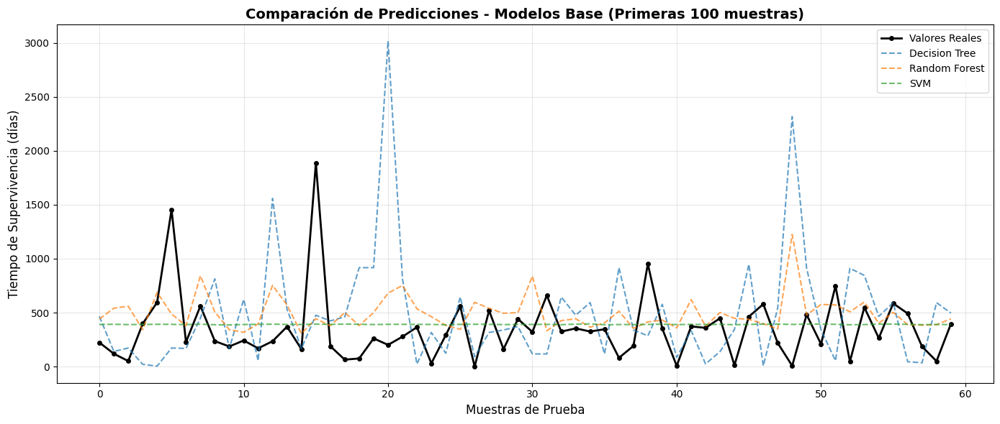

In [ ]:
# Visualización comparativa de predicciones
n_muestras = 100

plt.figure(figsize=(14, 6))
plt.plot(y_test.values[:n_muestras], label='Valores Reales',
         color='black', linewidth=2, marker='o', markersize=4)
plt.plot(y_pred_dt_base[:n_muestras], label='Decision Tree',
         linestyle='--', alpha=0.7)
plt.plot(y_pred_rf_base[:n_muestras], label='Random Forest',
         linestyle='--', alpha=0.7)
plt.plot(y_pred_svm_base[:n_muestras], label='SVM',
         linestyle='--', alpha=0.7)

plt.title(f'Comparación de Predicciones - Modelos Base (Primeras {n_muestras} muestras)',
          fontsize=14, fontweight='bold')
plt.xlabel('Muestras de Prueba', fontsize=12)
plt.ylabel('Tiempo de Supervivencia (días)', fontsize=12)
plt.legend(loc='best', fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


### 2. Optimización de Hiperparámetros

Ahora exploraremos diferentes valores de hiperparámetros para mejorar el rendimiento de cada modelo.


### 2.1 Decision Tree - Ajuste de `max_depth`

El parámetro `max_depth` controla la profundidad máxima del árbol, lo que afecta la complejidad del modelo.


In [ ]:
# Probar diferentes valores de max_depth
max_depths = range(1, 21)
dt_scores = {'train_mae': [], 'test_mae': [], 'train_r2': [], 'test_r2': []}


for depth in max_depths:
    dt_model = DecisionTreeRegressor(max_depth=depth, random_state=42)
    dt_model.fit(X_train_scaled, y_train)

    # Predicciones
    y_train_pred = dt_model.predict(X_train_scaled)
    y_test_pred = dt_model.predict(X_test_scaled)

    # Métricas
    dt_scores['train_mae'].append(mean_absolute_error(y_train, y_train_pred))
    dt_scores['test_mae'].append(mean_absolute_error(y_test, y_test_pred))
    dt_scores['train_r2'].append(r2_score(y_train, y_train_pred))
    dt_scores['test_r2'].append(r2_score(y_test, y_test_pred))

# Encontrar mejor max_depth
best_depth_idx = np.argmin(dt_scores['test_mae'])
best_depth = max_depths[best_depth_idx]
best_mae = dt_scores['test_mae'][best_depth_idx]

print(f"\nMejor max_depth: {best_depth} (MAE: {best_mae:.2f} días)")



Mejor max_depth: 1 (MAE: 253.85 días)


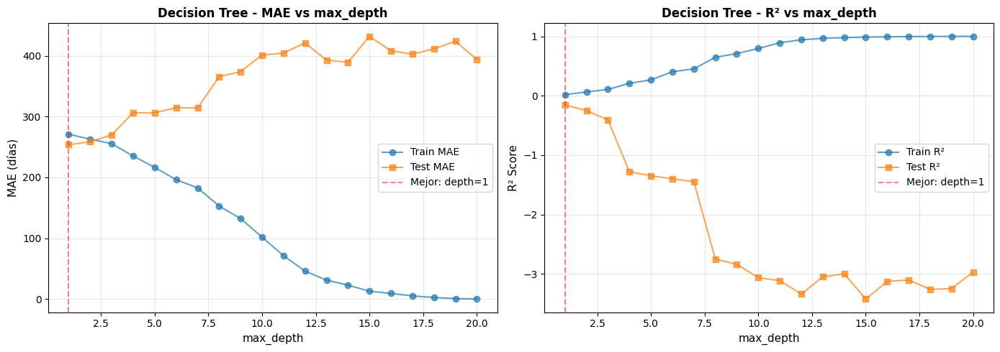

In [ ]:
# Visualizar resultados de Decision Tree
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# MAE
ax1.plot(max_depths, dt_scores['train_mae'], 'o-', label='Train MAE', alpha=0.7)
ax1.plot(max_depths, dt_scores['test_mae'], 's-', label='Test MAE', alpha=0.7)
ax1.axvline(best_depth, color='red', linestyle='--', alpha=0.5,
            label=f'Mejor: depth={best_depth}')
ax1.set_xlabel('max_depth', fontsize=11)
ax1.set_ylabel('MAE (días)', fontsize=11)
ax1.set_title('Decision Tree - MAE vs max_depth', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# R²
ax2.plot(max_depths, dt_scores['train_r2'], 'o-', label='Train R²', alpha=0.7)
ax2.plot(max_depths, dt_scores['test_r2'], 's-', label='Test R²', alpha=0.7)
ax2.axvline(best_depth, color='red', linestyle='--', alpha=0.5,
            label=f'Mejor: depth={best_depth}')
ax2.set_xlabel('max_depth', fontsize=11)
ax2.set_ylabel('R² Score', fontsize=11)
ax2.set_title('Decision Tree - R² vs max_depth', fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


### 2.2 Random Forest - Ajuste de `n_estimators`

El parámetro `n_estimators` define el número de árboles en el bosque aleatorio.


In [ ]:
# Probar diferentes valores de n_estimators
n_estimators_values = range(10, 201, 10)
rf_scores = {'train_mae': [], 'test_mae': [], 'train_r2': [], 'test_r2': []}


for n_est in n_estimators_values:
    rf_model = RandomForestRegressor(n_estimators=n_est, random_state=42, n_jobs=-1)
    rf_model.fit(X_train_scaled, y_train)

    # Predicciones
    y_train_pred = rf_model.predict(X_train_scaled)
    y_test_pred = rf_model.predict(X_test_scaled)

    # Métricas
    rf_scores['train_mae'].append(mean_absolute_error(y_train, y_train_pred))
    rf_scores['test_mae'].append(mean_absolute_error(y_test, y_test_pred))
    rf_scores['train_r2'].append(r2_score(y_train, y_train_pred))
    rf_scores['test_r2'].append(r2_score(y_test, y_test_pred))

# Encontrar mejor n_estimators
best_n_est_idx = np.argmin(rf_scores['test_mae'])
best_n_est = n_estimators_values[best_n_est_idx]
best_mae_rf = rf_scores['test_mae'][best_n_est_idx]

print(f"Mejor n_estimators: {best_n_est} (MAE: {best_mae_rf:.2f}) dias")


Mejor n_estimators: 130 (MAE: 273.32) dias


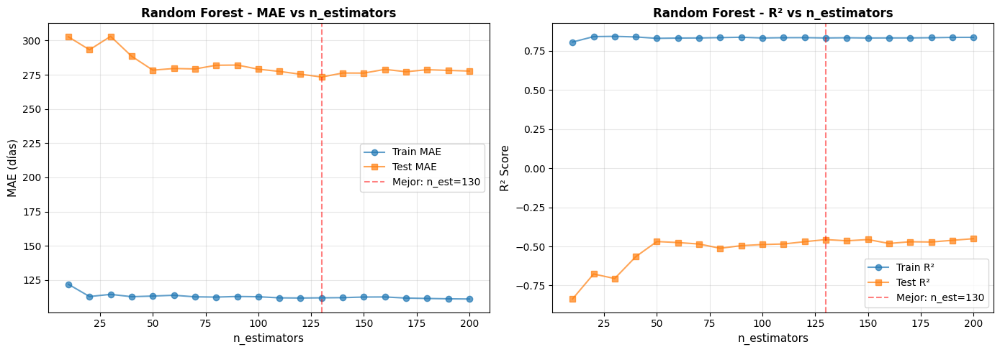

In [ ]:
# Visualizar resultados de Random Forest
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# MAE
ax1.plot(n_estimators_values, rf_scores['train_mae'], 'o-', label='Train MAE', alpha=0.7)
ax1.plot(n_estimators_values, rf_scores['test_mae'], 's-', label='Test MAE', alpha=0.7)
ax1.axvline(best_n_est, color='red', linestyle='--', alpha=0.5,
            label=f'Mejor: n_est={best_n_est}')
ax1.set_xlabel('n_estimators', fontsize=11)
ax1.set_ylabel('MAE (días)', fontsize=11)
ax1.set_title('Random Forest - MAE vs n_estimators', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# R²
ax2.plot(n_estimators_values, rf_scores['train_r2'], 'o-', label='Train R²', alpha=0.7)
ax2.plot(n_estimators_values, rf_scores['test_r2'], 's-', label='Test R²', alpha=0.7)
ax2.axvline(best_n_est, color='red', linestyle='--', alpha=0.5,
            label=f'Mejor: n_est={best_n_est}')
ax2.set_xlabel('n_estimators', fontsize=11)
ax2.set_ylabel('R² Score', fontsize=11)
ax2.set_title('Random Forest - R² vs n_estimators', fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


### 2.3 Support Vector Machine - Exploración de Kernels

Probaremos tres tipos de kernels diferentes: `linear`, `rbf` y `poly`.


In [ ]:
# Probar diferentes kernels para SVM
kernels = ['linear', 'rbf', 'poly']
svm_results = {}

print("Evaluando SVM con diferentes kernels...")


for kernel in kernels:
    print(f"Entrenando SVM con kernel '{kernel}'...")
    svm_model = SVR(kernel=kernel)
    svm_model.fit(X_train_scaled, y_train)

    # Predicciones
    y_train_pred = svm_model.predict(X_train_scaled)
    y_test_pred = svm_model.predict(X_test_scaled)

    # Métricas
    svm_results[kernel] = {
        'train_mae': mean_absolute_error(y_train, y_train_pred),
        'test_mae': mean_absolute_error(y_test, y_test_pred),
        'train_r2': r2_score(y_train, y_train_pred),
        'test_r2': r2_score(y_test, y_test_pred),
        'predictions': y_test_pred
    }

# Mostrar resultados

print("RESULTADOS SVM - COMPARACIÓN DE KERNELS")

for kernel, metrics in svm_results.items():
    print(f"\n{kernel.upper()}:")
    print(f"  Train MAE: {metrics['train_mae']:.2f} dias")
    print(f"  Test MAE:  {metrics['test_mae']:.2f} dias")
    print(f"  Train R²:  {metrics['train_r2']:.4f}")
    print(f"  Test R²:   {metrics['test_r2']:.4f}")

# Mejor kernel
best_kernel = min(svm_results, key=lambda k: svm_results[k]['test_mae'])
print(f"Mejor kernel: '{best_kernel}' (MAE: {svm_results[best_kernel]['test_mae']:.2f}) dias")



Evaluando SVM con diferentes kernels...
Entrenando SVM con kernel 'linear'...
Entrenando SVM con kernel 'rbf'...
Entrenando SVM con kernel 'poly'...
RESULTADOS SVM - COMPARACIÓN DE KERNELS

LINEAR:
  Train MAE: 263.46 dias
  Test MAE:  214.90 dias
  Train R²:  -0.0254
  Test R²:   0.0231

RBF:
  Train MAE: 266.37 dias
  Test MAE:  219.72 dias
  Train R²:  -0.0292
  Test R²:   -0.0142

POLY:
  Train MAE: 264.77 dias
  Test MAE:  218.88 dias
  Train R²:  -0.0268
  Test R²:   -0.0089
Mejor kernel: 'linear' (MAE: 214.90) dias


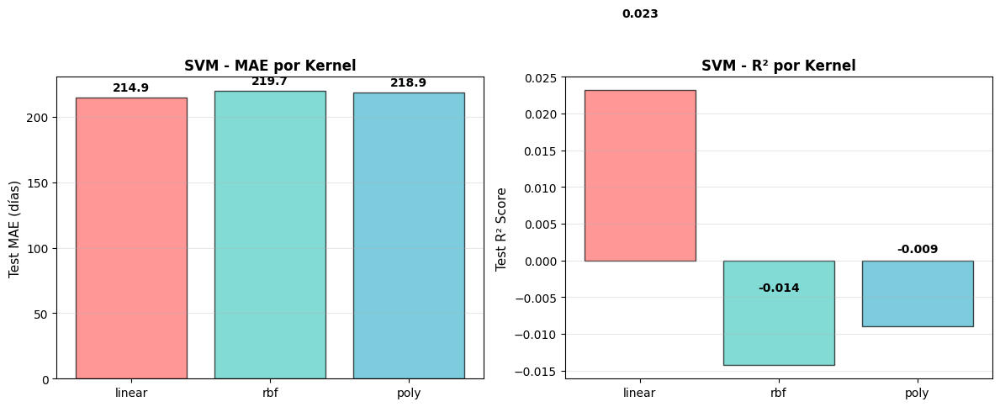

In [ ]:
# Visualizar comparación de kernels
kernels_list = list(svm_results.keys())
test_mae_values = [svm_results[k]['test_mae'] for k in kernels_list]
test_r2_values = [svm_results[k]['test_r2'] for k in kernels_list]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# MAE por kernel
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']
ax1.bar(kernels_list, test_mae_values, color=colors, alpha=0.7, edgecolor='black')
ax1.set_ylabel('Test MAE (días)', fontsize=11)
ax1.set_title('SVM - MAE por Kernel', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='y')

# Anotar valores
for i, (kernel, mae) in enumerate(zip(kernels_list, test_mae_values)):
    ax1.text(i, mae + 5, f'{mae:.1f}', ha='center', fontsize=10, fontweight='bold')

# R² por kernel
ax2.bar(kernels_list, test_r2_values, color=colors, alpha=0.7, edgecolor='black')
ax2.set_ylabel('Test R² Score', fontsize=11)
ax2.set_title('SVM - R² por Kernel', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='y')

# Anotar valores
for i, (kernel, r2) in enumerate(zip(kernels_list, test_r2_values)):
    ax2.text(i, r2 + 0.01, f'{r2:.3f}', ha='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()


### 3. Validación Cruzada (Cross-Validation)

La validación cruzada nos permite evaluar la capacidad de generalización de los modelos de manera más robusta, utilizando **k=10 folds**.


In [ ]:
# Definir modelos optimizados
modelos_optimizados = {
    'Decision Tree': DecisionTreeRegressor(max_depth=best_depth, random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=best_n_est, random_state=42, n_jobs=-1),
    'SVM (linear)': SVR(kernel='linear'),
    'SVM (rbf)': SVR(kernel='rbf'),
    'SVM (poly)': SVR(kernel='poly')
}

# Aplicar cross-validation con k=10
k_folds = 10
cv_results = {}

print(f"Aplicando Cross-Validation con k={k_folds} folds...")


for nombre, modelo in modelos_optimizados.items():
    print(f"Evaluando {nombre}...")

    # Cross-validation
    scores = cross_val_score(
        modelo,
        X_train_scaled,
        y_train,
        cv=KFold(n_splits=k_folds, shuffle=True, random_state=42),
        scoring='neg_mean_absolute_error',
        n_jobs=-1
    )

    # Convertir a MAE positivo
    mae_scores = -scores

    cv_results[nombre] = {
        'scores': mae_scores,
        'mean': mae_scores.mean(),
        'std': mae_scores.std()
    }

# Mostrar resultados

print(f"RESULTADOS CROSS-VALIDATION (k={k_folds})")

for nombre, resultados in cv_results.items():
    print(f"\n{nombre}:")
    print(f"  MAE promedio: {resultados['mean']:.2f} ± {resultados['std']:.2f} días")




Aplicando Cross-Validation con k=10 folds...
Evaluando Decision Tree...
Evaluando Random Forest...
Evaluando SVM (linear)...
Evaluando SVM (rbf)...
Evaluando SVM (poly)...
RESULTADOS CROSS-VALIDATION (k=10)

Decision Tree:
  MAE promedio: 284.82 ± 45.06 días

Random Forest:
  MAE promedio: 302.49 ± 54.84 días

SVM (linear):
  MAE promedio: 270.13 ± 53.33 días

SVM (rbf):
  MAE promedio: 268.27 ± 54.45 días

SVM (poly):
  MAE promedio: 268.36 ± 54.28 días


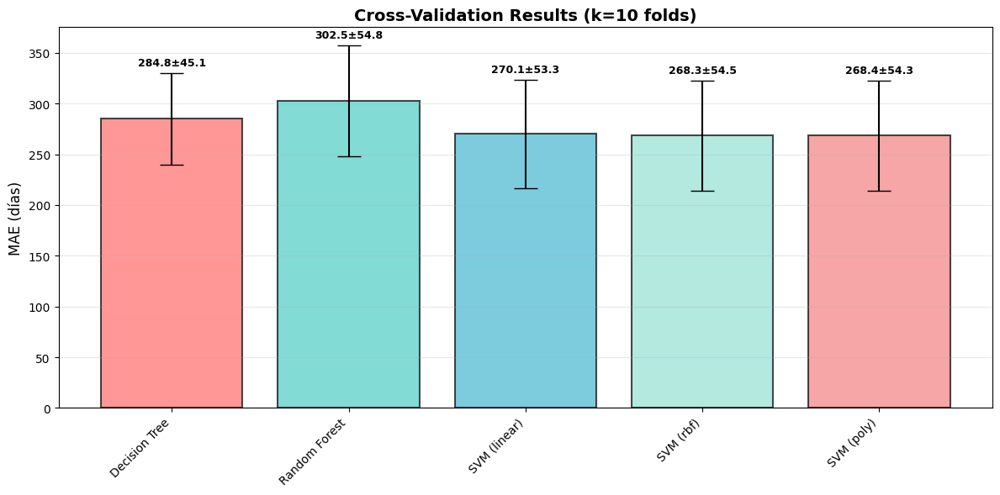

In [ ]:
# Visualizar resultados de Cross-Validation
nombres = list(cv_results.keys())
medias = [cv_results[n]['mean'] for n in nombres]
stds = [cv_results[n]['std'] for n in nombres]

plt.figure(figsize=(12, 6))
bars = plt.bar(nombres, medias, yerr=stds, capsize=10,
               alpha=0.7, edgecolor='black', linewidth=1.5,
               color=['#FF6B6B', '#4ECDC4', '#45B7D1', '#95E1D3', '#F38181'])

plt.ylabel('MAE (días)', fontsize=12)
plt.title(f'Cross-Validation Results (k={k_folds} folds)', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3, axis='y')

# Anotar valores
for i, (bar, media, std) in enumerate(zip(bars, medias, stds)):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + std + 5,
             f'{media:.1f}±{std:.1f}',
             ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()


### 3.1 Comparación con Diferentes Valores de K

Según lo solicitado, exploramos cómo varía el rendimiento con **k = 10, 20 y 50** folds.


In [ ]:
# Probar los valores de k solicitados: 10, 20, 50
k_values = [10, 20, 50]

# Usar el mejor modelo encontrado (Random Forest)
mejor_modelo = RandomForestRegressor(n_estimators=best_n_est, random_state=42, n_jobs=-1)

k_comparison = {}

print("Comparando diferentes valores de k-folds...")
for k in k_values:
    print(f"  k={k}...")
    scores = cross_val_score(
        mejor_modelo,
        X_train_scaled,
        y_train,
        cv=KFold(n_splits=k, shuffle=True, random_state=42),
        scoring='neg_mean_absolute_error',
        n_jobs=-1
    )
    mae_scores = -scores
    k_comparison[k] = {
        'mean': mae_scores.mean(),
        'std': mae_scores.std()
    }

# Mostrar resultados
print("\nRESULTADOS COMPARACIÓN K-FOLDS")
for k, res in k_comparison.items():
    print(f"  k={k}: MAE = {res['mean']:.2f} ± {res['std']:.2f} días")

# Elegir el mejor k
best_k = min(k_comparison, key=lambda k: k_comparison[k]['mean'])
print(f"\nMejor k: {best_k} (MAE: {k_comparison[best_k]['mean']:.2f} días)")


Comparando diferentes valores de k-folds...
  k=10...
  k=20...
  k=50...

RESULTADOS COMPARACIÓN K-FOLDS
  k=10: MAE = 302.49 ± 54.84 días
  k=20: MAE = 291.82 ± 99.16 días
  k=50: MAE = 300.99 ± 152.97 días

Mejor k: 20 (MAE: 291.82 días)


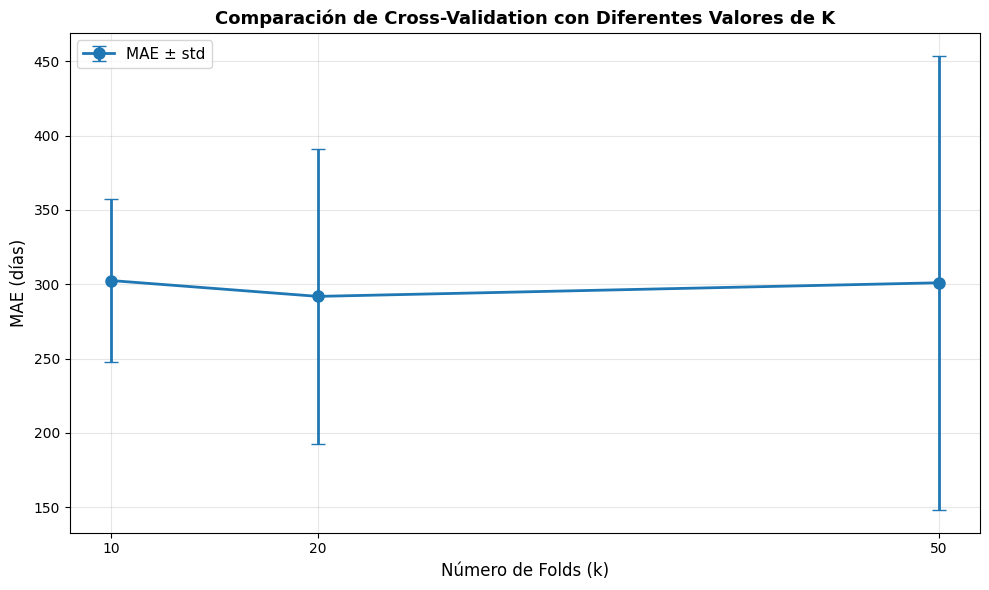

In [ ]:
# Visualizar comparación de k-folds
k_list = list(k_comparison.keys())
means = [k_comparison[k]['mean'] for k in k_list]
stds = [k_comparison[k]['std'] for k in k_list]

plt.figure(figsize=(10, 6))
plt.errorbar(k_list, means, yerr=stds, fmt='o-', capsize=5,
             linewidth=2, markersize=8, label='MAE ± std')
plt.xlabel('Número de Folds (k)', fontsize=12)
plt.ylabel('MAE (días)', fontsize=12)
plt.title('Comparación de Cross-Validation con Diferentes Valores de K',
          fontsize=13, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.legend(fontsize=11)
plt.xticks(k_list)
plt.tight_layout()
plt.show()


### FASE: DEEP LEARNING - PERCEPTRÓN MULTICAPA (MLP)

En esta fase del proyecto se implementaron modelos de Deep Learning basados en perceptrones multicapa (MLP), con el objetivo de mejorar la capacidad predictiva del sistema en la estimación de supervivencia de pacientes con cáncer de mama. A diferencia de los modelos tradicionales previamente utilizados, las redes neuronales permiten capturar relaciones no lineales complejas entre las variables clínicas.

Se evaluarán tres arquitecturas diferentes para comparar:

1. Modelo simple (input, capa oculta (64,128, 128))

2. Modelo intermedio (input, capa oculta (64,64 ,128, 128, 256,256))

3. Modelo profundo (10 capas con 128 neuronas cada una)

In [ ]:
# ── Imports Deep Learning ──
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# NO escalamos y (Survival_Time) porque:
# 1. Usamos ReLU en la capa de salida (solo produce valores >= 0)
# 2. Survival_Time siempre es positivo (días >= 0)
# 3. Escalar y con StandardScaler genera negativos que ReLU elimina,
#    causando que la red no aprenda (dying ReLU)

print(f"X_train shape: {X_train_scaled.shape}")
print(f"y_train rango: [{y_train.min():.0f}, {y_train.max():.0f}] días")
print(f"y_train promedio: {y_train.mean():.0f} días")
print(f"y_test rango:  [{y_test.min():.0f}, {y_test.max():.0f}] días")


X_train shape: (239, 9)
y_train rango: [4, 3019] días
y_train promedio: 462 días
y_test rango:  [0, 1888] días


### Definición de las 3 Arquitecturas

Se definen tres modelos con complejidad creciente:

| Modelo | Arquitectura | Capas ocultas |
|--------|-------------|---------------|
| Modelo 1 (Simple) | Input → 64 → 128 → 128 → 1 | 3 capas |
| Modelo 2 (Intermedio) | Input → 64 → 64 → 128 → 128 → 256 → 256 → 1 | 6 capas |
| Modelo 3 (Profundo) | Input → 10 capas de 128 → 1 | 10 capas |

- **Capas ocultas:** activación `ReLU`
- **Capa de salida:** 1 neurona con activación `ReLU` (regresión, Survival_Time ≥ 0 días)
- **Dropout:** aplicado entre capas ocultas para regularización


In [ ]:
# ── Modelo 1: Simple (64 → 128 → 128 → 1) ──
def build_model_1(input_dim):
    model = Sequential([
        Dense(64, activation='relu', input_dim=input_dim),
        Dense(128, activation='relu'),
        Dropout(0.2),
        Dense(128, activation='relu'),
        Dense(1, activation='relu')  # Regresión: días ≥ 0
    ])
    return model

# ── Modelo 2: Intermedio (64 → 64 → 128 → 128 → 256 → 256 → 1) ──
def build_model_2(input_dim):
    model = Sequential([
        Dense(64, activation='relu', input_dim=input_dim),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(128, activation='relu'),
        Dense(128, activation='relu'),
        Dropout(0.2),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(1, activation='relu')
    ])
    return model

# ── Modelo 3: Profundo (10 capas de 128 → 1) ──
def build_model_3(input_dim):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_dim=input_dim))

    for i in range(9):
        model.add(Dense(128, activation='relu'))
        if i % 3 == 0:
            model.add(Dropout(0.2))

    model.add(Dense(1, activation='relu'))
    return model


### Entrenamiento con Diferentes Epochs

Se evaluarán los modelos con **epochs = 10, 50 y 100** según lo solicitado.
Se utiliza `EarlyStopping` para detener el entrenamiento si no mejora.


In [ ]:
def compile_and_train(model, name, epochs=50):
    model.compile(
        optimizer='adam',
        loss='mse',
        metrics=['mae']
    )

    early_stop = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )

    print(f"\n{'='*50}")
    print(f"  Entrenando {name} — {epochs} epochs")
    print(f"{'='*50}")

    history = model.fit(
        X_train_scaled, y_train,  # y_train SIN escalar (días reales)
        validation_split=0.2,
        epochs=epochs,
        batch_size=32,
        callbacks=[early_stop],
        verbose=1
    )
    return history


In [ ]:
input_dim = X_train_scaled.shape[1]

model1 = build_model_1(input_dim)
model2 = build_model_2(input_dim)
model3 = build_model_3(input_dim)

# Entrenar con 50 epochs (cambiar a 10 o 100 para las otras pruebas)
history1 = compile_and_train(model1, "Modelo 1 (Simple)", epochs=50)
history2 = compile_and_train(model2, "Modelo 2 (Intermedio)", epochs=50)
history3 = compile_and_train(model3, "Modelo 3 (Profundo)", epochs=50)



  Entrenando Modelo 1 (Simple) — 50 epochs
Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 398258.4375 - mae: 473.5670 - val_loss: 278946.6562 - val_mae: 413.7664
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 397146.9688 - mae: 472.3515 - val_loss: 277697.4375 - val_mae: 412.2801
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 395403.9062 - mae: 470.4815 - val_loss: 275609.5312 - val_mae: 409.8021
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 392378.4375 - mae: 467.2769 - val_loss: 272130.3438 - val_mae: 405.6915
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 387511.2812 - mae: 462.2363 - val_loss: 266559.1562 - val_mae: 399.3642
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 380214.9062 - mae: 454.3389 - val_loss: 258030.5469 - val_mae: 390.0107
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 368543.0938 - mae: 442.6480 - val_loss: 245577.6094 - val_mae: 375.9051
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - lo

### Evaluación de los Modelos

Como no se escaló `y`, las predicciones ya están en días reales y no requieren desescalado.


In [ ]:
def evaluate_model(model, name):
    y_pred = model.predict(X_test_scaled).ravel()

    mae  = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2   = r2_score(y_test, y_pred)

    print(f"\n{name}:")
    print(f"  MAE:  {mae:.2f} días")
    print(f"  RMSE: {rmse:.2f} días")
    print(f"  R²:   {r2:.4f}")

    return y_pred, {'mae': mae, 'rmse': rmse, 'r2': r2}

print("EVALUACIÓN DE MODELOS DEEP LEARNING")
pred1, metrics1 = evaluate_model(model1, "Modelo 1 (Simple)")
pred2, metrics2 = evaluate_model(model2, "Modelo 2 (Intermedio)")
pred3, metrics3 = evaluate_model(model3, "Modelo 3 (Profundo)")


EVALUACIÓN DE MODELOS DEEP LEARNING
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Modelo 1 (Simple):
  MAE:  240.54 días
  RMSE: 333.72 días
  R²:   -0.0964
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step

Modelo 2 (Intermedio):
  MAE:  240.04 días
  RMSE: 338.60 días
  R²:   -0.1288


1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step

Modelo 3 (Profundo):
  MAE:  218.55 días
  RMSE: 324.10 días
  R²:   -0.0341


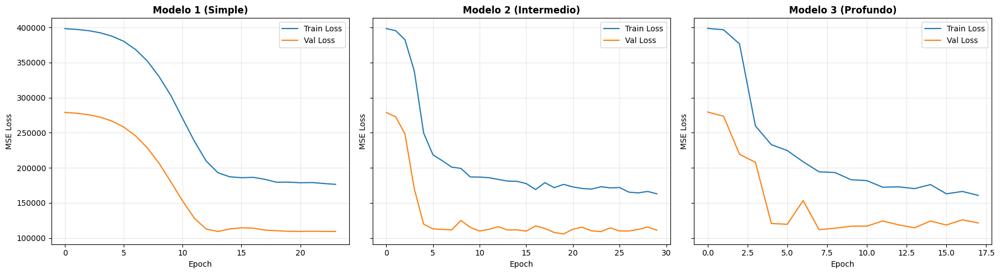

In [ ]:
def plot_all_losses(histories, titles):
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
    for i, (history, title) in enumerate(zip(histories, titles)):
        axes[i].plot(history.history['loss'], label='Train Loss')
        axes[i].plot(history.history['val_loss'], label='Val Loss')
        axes[i].set_title(title, fontsize=12, fontweight='bold')
        axes[i].set_xlabel('Epoch')
        axes[i].set_ylabel('MSE Loss')
        axes[i].legend()
        axes[i].grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_all_losses(
    [history1, history2, history3],
    ['Modelo 1 (Simple)', 'Modelo 2 (Intermedio)', 'Modelo 3 (Profundo)']
)


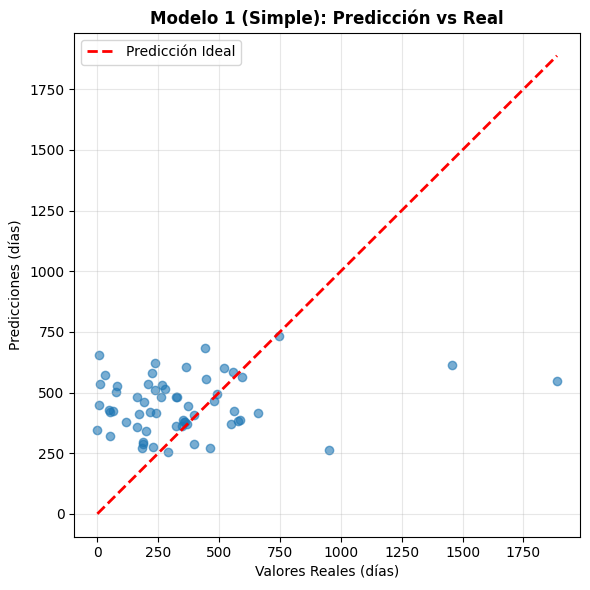

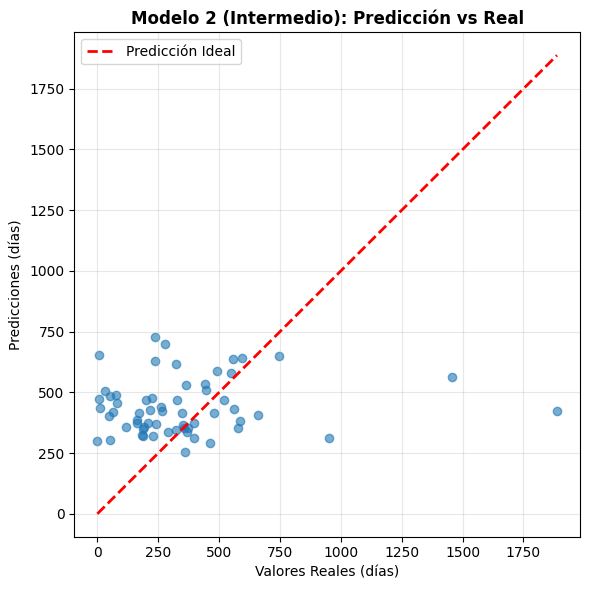

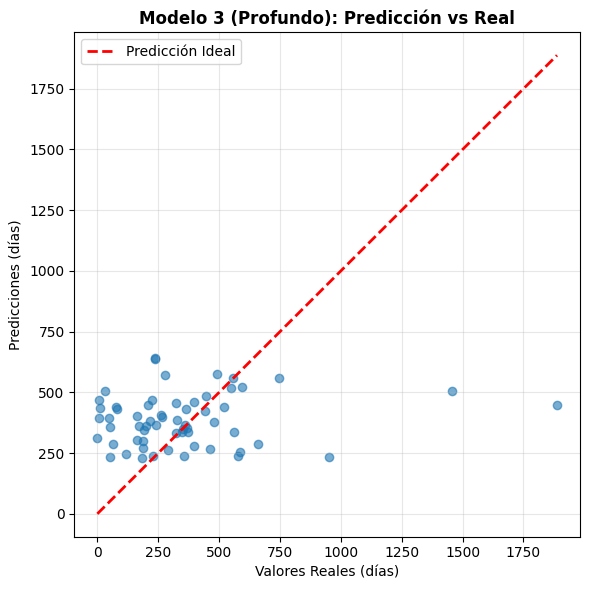

In [ ]:
def plot_predictions(y_true, y_pred, title):
    plt.figure(figsize=(6, 6))
    plt.scatter(y_true, y_pred, alpha=0.6)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()],
             'r--', linewidth=2, label='Predicción Ideal')
    plt.xlabel('Valores Reales (días)')
    plt.ylabel('Predicciones (días)')
    plt.title(title, fontweight='bold')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_predictions(y_test, pred1, 'Modelo 1 (Simple): Predicción vs Real')
plot_predictions(y_test, pred2, 'Modelo 2 (Intermedio): Predicción vs Real')
plot_predictions(y_test, pred3, 'Modelo 3 (Profundo): Predicción vs Real')


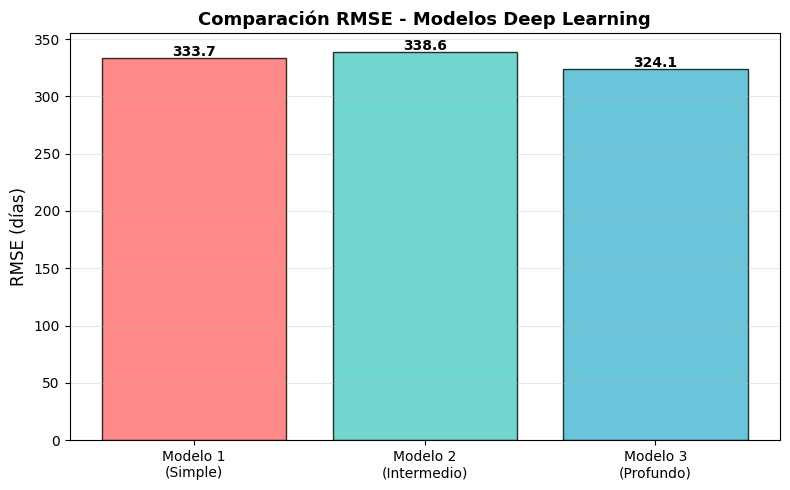

In [ ]:
models_names = ['Modelo 1\n(Simple)', 'Modelo 2\n(Intermedio)', 'Modelo 3\n(Profundo)']
rmse_values = [metrics1['rmse'], metrics2['rmse'], metrics3['rmse']]

plt.figure(figsize=(8, 5))
bars = plt.bar(models_names, rmse_values, color=['#FF6B6B', '#4ECDC4', '#45B7D1'],
               alpha=0.8, edgecolor='black')
for bar, val in zip(bars, rmse_values):
    plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 2,
             f'{val:.1f}', ha='center', fontweight='bold')
plt.ylabel('RMSE (días)', fontsize=12)
plt.title('Comparación RMSE - Modelos Deep Learning', fontsize=13, fontweight='bold')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()


### Comparación de Epochs: 10, 50 y 100

Según lo solicitado, se evalúan las tres arquitecturas MLP con diferentes cantidades de epochs para determinar cuál ofrece el mejor rendimiento.
Los modelos anteriores fueron entrenados con **50 epochs**. Ahora se entrenarán con **10** y **100** epochs para comparar.


In [ ]:
# ── Entrenamiento con 10 Epochs ──
print("="*60)
print("  ENTRENAMIENTO CON 10 EPOCHS")
print("="*60)

model1_e10 = build_model_1(input_dim)
model2_e10 = build_model_2(input_dim)
model3_e10 = build_model_3(input_dim)

history1_e10 = compile_and_train(model1_e10, "Modelo 1 (Simple)", epochs=10)
history2_e10 = compile_and_train(model2_e10, "Modelo 2 (Intermedio)", epochs=10)
history3_e10 = compile_and_train(model3_e10, "Modelo 3 (Profundo)", epochs=10)


  ENTRENAMIENTO CON 10 EPOCHS

  Entrenando Modelo 1 (Simple) — 10 epochs
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 398670.1562 - mae: 474.0215 - val_loss: 279515.7188 - val_mae: 414.4552
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 398016.6250 - mae: 473.2887 - val_loss: 278681.7500 - val_mae: 413.4829
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 396862.9375 - mae: 472.0844 - val_loss: 277424.5938 - val_mae: 412.0095
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 395220.5625 - mae: 470.2336 - val_loss: 275380.0312 - val_mae: 409.5941
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 392322.7500 - mae: 467.1445 - val_loss: 271970.1562 - val_mae: 405.6517
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 387738.7188 - mae: 462.2209 - val_loss: 266495.2812 - val_mae: 399.5241
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 380597.7500 - mae: 454.3040 - val_loss: 258222.1406 - val_mae: 390.3381
Epoch 8/10
6/6 ━━━━━━━━

In [ ]:
# ── Entrenamiento con 100 Epochs ──
print("="*60)
print("  ENTRENAMIENTO CON 100 EPOCHS")
print("="*60)

model1_e100 = build_model_1(input_dim)
model2_e100 = build_model_2(input_dim)
model3_e100 = build_model_3(input_dim)

history1_e100 = compile_and_train(model1_e100, "Modelo 1 (Simple)", epochs=100)
history2_e100 = compile_and_train(model2_e100, "Modelo 2 (Intermedio)", epochs=100)
history3_e100 = compile_and_train(model3_e100, "Modelo 3 (Profundo)", epochs=100)


  ENTRENAMIENTO CON 100 EPOCHS

  Entrenando Modelo 1 (Simple) — 100 epochs
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 398728.0312 - mae: 474.0729 - val_loss: 279577.7188 - val_mae: 414.5930
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 398133.8750 - mae: 473.4420 - val_loss: 278740.5938 - val_mae: 413.6044
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 397130.7500 - mae: 472.4016 - val_loss: 277580.9688 - val_mae: 412.2325
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 395710.1875 - mae: 470.8125 - val_loss: 275724.3438 - val_mae: 410.0371
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 393374.8750 - mae: 468.2050 - val_loss: 272682.8750 - val_mae: 406.5398
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 389630.9062 - mae: 464.1063 - val_loss: 267869.2812 - val_mae: 401.1817
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 383378.6250 - mae: 457.7188 - val_loss: 260596.6719 - val_mae: 393.2343
Epoch 8/100
6/

In [ ]:
# ── Evaluación comparativa: 10 vs 50 vs 100 Epochs ──

def eval_quick(model, name):
    y_p = model.predict(X_test_scaled, verbose=0).ravel()
    mae  = mean_absolute_error(y_test, y_p)
    rmse = np.sqrt(mean_squared_error(y_test, y_p))
    r2   = r2_score(y_test, y_p)
    return {'mae': mae, 'rmse': rmse, 'r2': r2}

# Evaluar 10 epochs
m1_e10 = eval_quick(model1_e10, 'M1-10')
m2_e10 = eval_quick(model2_e10, 'M2-10')
m3_e10 = eval_quick(model3_e10, 'M3-10')

# Evaluar 50 epochs (ya entrenados: model1, model2, model3)
m1_e50 = eval_quick(model1, 'M1-50')
m2_e50 = eval_quick(model2, 'M2-50')
m3_e50 = eval_quick(model3, 'M3-50')

# Evaluar 100 epochs
m1_e100 = eval_quick(model1_e100, 'M1-100')
m2_e100 = eval_quick(model2_e100, 'M2-100')
m3_e100 = eval_quick(model3_e100, 'M3-100')

# Tabla de resultados
print("\n" + "=" * 75)
print("  COMPARACIÓN DE EPOCHS: 10 vs 50 vs 100")
print("=" * 75)
print(f"  {'Modelo':<22} {'Epochs':<8} {'MAE (días)':<12} {'RMSE (días)':<13} {'R²':<10}")
print("-" * 75)

all_results = [
    ('Modelo 1 (Simple)',     10, m1_e10),
    ('Modelo 1 (Simple)',     50, m1_e50),
    ('Modelo 1 (Simple)',    100, m1_e100),
    ('Modelo 2 (Intermedio)', 10, m2_e10),
    ('Modelo 2 (Intermedio)', 50, m2_e50),
    ('Modelo 2 (Intermedio)',100, m2_e100),
    ('Modelo 3 (Profundo)',   10, m3_e10),
    ('Modelo 3 (Profundo)',   50, m3_e50),
    ('Modelo 3 (Profundo)',  100, m3_e100),
]

best_mae_global = min(all_results, key=lambda x: x[2]['mae'])

for name, ep, m in all_results:
    marker = ' ★' if (name == best_mae_global[0] and ep == best_mae_global[1]) else ''
    print(f"  {name:<22} {ep:<8} {m['mae']:<12.2f} {m['rmse']:<13.2f} {m['r2']:<10.4f}{marker}")
    if ep == 100:
        print("-" * 75)

print(f"\n  ★ Mejor combinación: {best_mae_global[0]} con {best_mae_global[1]} epochs")
print(f"    MAE: {best_mae_global[2]['mae']:.2f} días | R²: {best_mae_global[2]['r2']:.4f}")



  COMPARACIÓN DE EPOCHS: 10 vs 50 vs 100
  Modelo                 Epochs   MAE (días)   RMSE (días)   R²        
---------------------------------------------------------------------------
  Modelo 1 (Simple)      10       271.55       403.09        -0.5997   
  Modelo 1 (Simple)      50       240.54       333.72        -0.0964   
  Modelo 1 (Simple)      100      230.08       344.06        -0.1654   
---------------------------------------------------------------------------
  Modelo 2 (Intermedio)  10       228.09       336.72        -0.1163   
  Modelo 2 (Intermedio)  50       240.04       338.60        -0.1288   
  Modelo 2 (Intermedio)  100      230.36       328.24        -0.0608   
---------------------------------------------------------------------------
  Modelo 3 (Profundo)    10       236.26       328.81        -0.0644   
  Modelo 3 (Profundo)    50       218.55       324.10        -0.0341    ★
  Modelo 3 (Profundo)    100      253.15       343.78        -0.1636   
--------

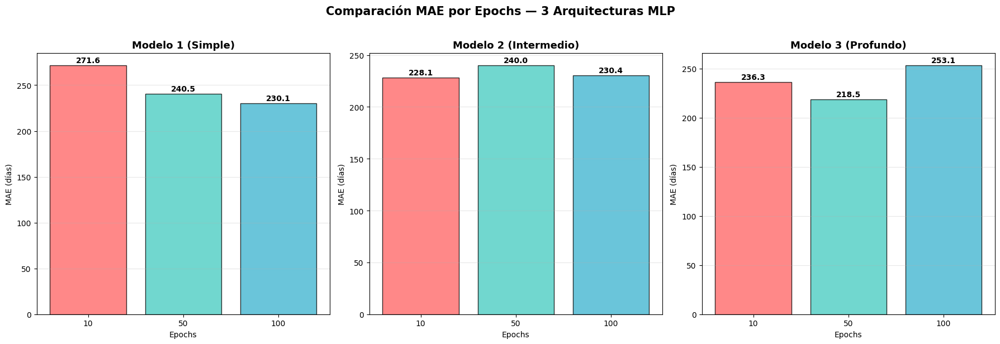

In [ ]:
# ── Gráfica comparativa de Epochs ──

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

epochs_list = [10, 50, 100]
colors_ep = ['#FF6B6B', '#4ECDC4', '#45B7D1']

# Modelo 1
mae_m1 = [m1_e10['mae'], m1_e50['mae'], m1_e100['mae']]
axes[0].bar([str(e) for e in epochs_list], mae_m1, color=colors_ep, alpha=0.8, edgecolor='black')
axes[0].set_title('Modelo 1 (Simple)', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('MAE (días)')
axes[0].grid(True, alpha=0.3, axis='y')
for j, val in enumerate(mae_m1):
    axes[0].text(j, val + 3, f'{val:.1f}', ha='center', fontweight='bold')

# Modelo 2
mae_m2 = [m2_e10['mae'], m2_e50['mae'], m2_e100['mae']]
axes[1].bar([str(e) for e in epochs_list], mae_m2, color=colors_ep, alpha=0.8, edgecolor='black')
axes[1].set_title('Modelo 2 (Intermedio)', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('MAE (días)')
axes[1].grid(True, alpha=0.3, axis='y')
for j, val in enumerate(mae_m2):
    axes[1].text(j, val + 3, f'{val:.1f}', ha='center', fontweight='bold')

# Modelo 3
mae_m3 = [m3_e10['mae'], m3_e50['mae'], m3_e100['mae']]
axes[2].bar([str(e) for e in epochs_list], mae_m3, color=colors_ep, alpha=0.8, edgecolor='black')
axes[2].set_title('Modelo 3 (Profundo)', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Epochs')
axes[2].set_ylabel('MAE (días)')
axes[2].grid(True, alpha=0.3, axis='y')
for j, val in enumerate(mae_m3):
    axes[2].text(j, val + 3, f'{val:.1f}', ha='center', fontweight='bold')

plt.suptitle('Comparación MAE por Epochs — 3 Arquitecturas MLP',
             fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()


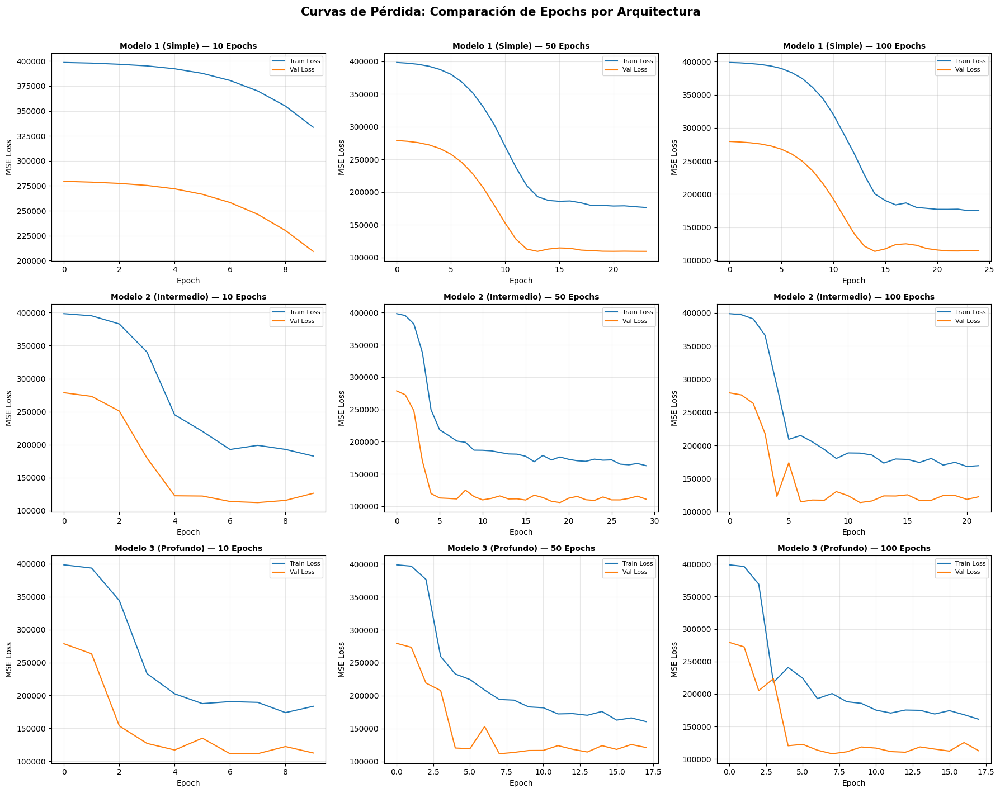

In [ ]:
# ── Curvas de pérdida: 10 vs 50 vs 100 Epochs ──

fig, axes = plt.subplots(3, 3, figsize=(18, 14))

all_histories = [
    [history1_e10, history1, history1_e100],
    [history2_e10, history2, history2_e100],
    [history3_e10, history3, history3_e100],
]

model_titles = ['Modelo 1 (Simple)', 'Modelo 2 (Intermedio)', 'Modelo 3 (Profundo)']
epoch_titles = ['10 Epochs', '50 Epochs', '100 Epochs']

for row in range(3):
    for col in range(3):
        h = all_histories[row][col]
        axes[row][col].plot(h.history['loss'], label='Train Loss')
        axes[row][col].plot(h.history['val_loss'], label='Val Loss')
        axes[row][col].set_title(f'{model_titles[row]} — {epoch_titles[col]}',
                                 fontsize=10, fontweight='bold')
        axes[row][col].set_xlabel('Epoch')
        axes[row][col].set_ylabel('MSE Loss')
        axes[row][col].legend(fontsize=8)
        axes[row][col].grid(True, alpha=0.3)

plt.suptitle('Curvas de Pérdida: Comparación de Epochs por Arquitectura',
             fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()


### FASE 4: Comparativa Final — Todos los Modelos

Comparamos el rendimiento de todos los modelos (DT, RF, SVR, Deep Learning) para identificar cuál ofrece la mejor predicción del tiempo de supervivencia.


In [ ]:
# ── Comparativa Final: DT vs RF vs SVR vs DL ──
dt_final = DecisionTreeRegressor(max_depth=best_depth, random_state=42)
dt_final.fit(X_train_scaled, y_train)
y_pred_dt = dt_final.predict(X_test_scaled)

rf_final = RandomForestRegressor(n_estimators=best_n_est, random_state=42)
rf_final.fit(X_train_scaled, y_train)
y_pred_rf = rf_final.predict(X_test_scaled)

svr_final = SVR(kernel=best_kernel)
svr_final.fit(X_train_scaled, y_train)
y_pred_svr = svr_final.predict(X_test_scaled)

dl_preds = [pred1, pred2, pred3]
dl_metrics = [metrics1, metrics2, metrics3]
dl_names = ['DL Modelo 1', 'DL Modelo 2', 'DL Modelo 3']
best_dl_idx = np.argmin([m['rmse'] for m in dl_metrics])
y_pred_dl = dl_preds[best_dl_idx]

all_models = {
    f'Decision Tree\n(depth={best_depth})': y_pred_dt,
    f'Random Forest\n(n={best_n_est})': y_pred_rf,
    f'SVR\n({best_kernel})': y_pred_svr,
    f'{dl_names[best_dl_idx]}': y_pred_dl
}

print("COMPARATIVA FINAL - TODOS LOS MODELOS")
print("=" * 55)

final_mae, final_rmse, final_r2, final_names = [], [], [], []

for name, preds in all_models.items():
    mae  = mean_absolute_error(y_test, preds)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    r2   = r2_score(y_test, preds)
    final_names.append(name)
    final_mae.append(mae)
    final_rmse.append(rmse)
    final_r2.append(r2)
    print(f"\n{name}:")
    print(f"  MAE:  {mae:.2f} días | RMSE: {rmse:.2f} días | R²: {r2:.4f}")


COMPARATIVA FINAL - TODOS LOS MODELOS

Decision Tree
(depth=1):
  MAE:  253.85 días | RMSE: 342.44 días | R²: -0.1545

Random Forest
(n=130):
  MAE:  273.32 días | RMSE: 384.59 días | R²: -0.4562

SVR
(linear):
  MAE:  214.90 días | RMSE: 314.99 días | R²: 0.0231

DL Modelo 3:
  MAE:  218.55 días | RMSE: 324.10 días | R²: -0.0341


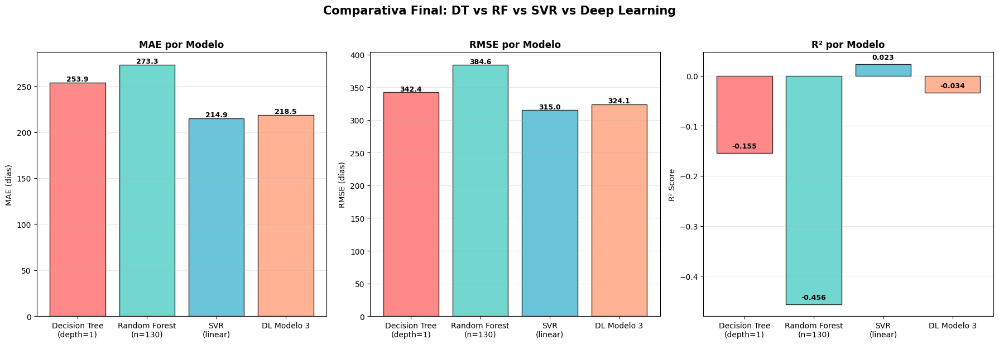


MEJOR MODELO: SVR
(linear)
  MAE: 214.90 días | RMSE: 314.99 | R²: 0.0231


In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A']

bars1 = ax1.bar(final_names, final_mae, color=colors, alpha=0.8, edgecolor='black')
ax1.set_ylabel('MAE (días)')
ax1.set_title('MAE por Modelo', fontweight='bold')
ax1.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars1, final_mae):
    ax1.text(bar.get_x()+bar.get_width()/2., bar.get_height()+2, f'{val:.1f}', ha='center', fontweight='bold', fontsize=9)

bars2 = ax2.bar(final_names, final_rmse, color=colors, alpha=0.8, edgecolor='black')
ax2.set_ylabel('RMSE (días)')
ax2.set_title('RMSE por Modelo', fontweight='bold')
ax2.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars2, final_rmse):
    ax2.text(bar.get_x()+bar.get_width()/2., bar.get_height()+2, f'{val:.1f}', ha='center', fontweight='bold', fontsize=9)

bars3 = ax3.bar(final_names, final_r2, color=colors, alpha=0.8, edgecolor='black')
ax3.set_ylabel('R² Score')
ax3.set_title('R² por Modelo', fontweight='bold')
ax3.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars3, final_r2):
    ax3.text(bar.get_x()+bar.get_width()/2., bar.get_height()+0.01, f'{val:.3f}', ha='center', fontweight='bold', fontsize=9)

plt.suptitle('Comparativa Final: DT vs RF vs SVR vs Deep Learning', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

best_idx = np.argmin(final_mae)
print(f"\nMEJOR MODELO: {final_names[best_idx]}")
print(f"  MAE: {final_mae[best_idx]:.2f} días | RMSE: {final_rmse[best_idx]:.2f} | R²: {final_r2[best_idx]:.4f}")


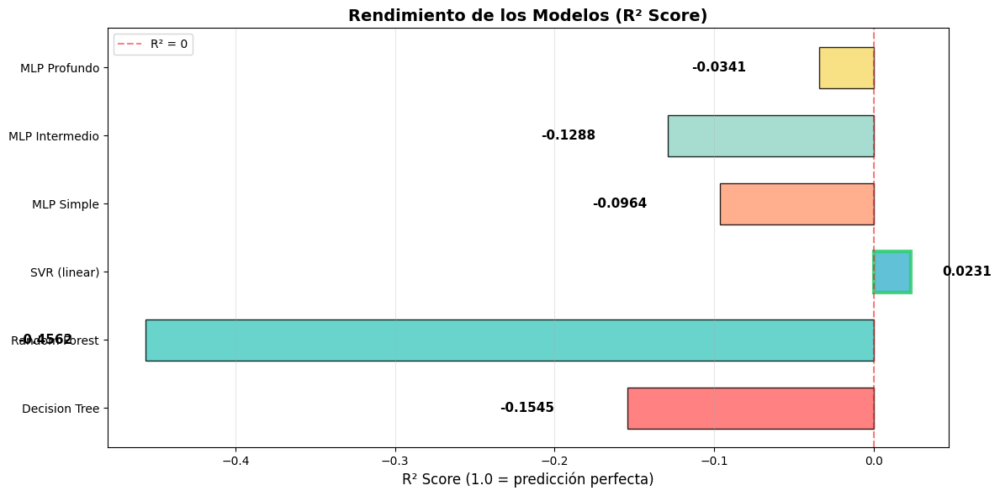


  TABLA RESUMEN DE RENDIMIENTO
  Modelo               MAE (días)   RMSE (días)   R²        
-----------------------------------------------------------------
  Decision Tree        253.85       342.44        -0.1545   
  Random Forest        273.32       384.59        -0.4562   
  SVR (linear)         214.90       314.99        0.0231     ★
  MLP Simple           240.54       333.72        -0.0964   
  MLP Intermedio       240.04       338.60        -0.1288   
  MLP Profundo         218.55       324.10        -0.0341   
-----------------------------------------------------------------

  ★ Mejor modelo: SVR (linear)
    → Error promedio de 215 días en la predicción


In [ ]:
# ══════════════════════════════════════════════════════════════════
# GRÁFICA DE RENDIMIENTO (R²) - TODOS LOS MODELOS
# ══════════════════════════════════════════════════════════════════

modelos_todos = {
    'Decision Tree':        y_pred_dt,
    'Random Forest':        y_pred_rf,
    f'SVR ({best_kernel})':  y_pred_svr,
    'MLP Simple':           pred1,
    'MLP Intermedio':       pred2,
    'MLP Profundo':         pred3
}

nombres, r2_all, mae_all, rmse_all = [], [], [], []
for name, preds in modelos_todos.items():
    nombres.append(name)
    r2_all.append(r2_score(y_test, preds))
    mae_all.append(mean_absolute_error(y_test, preds))
    rmse_all.append(np.sqrt(mean_squared_error(y_test, preds)))

fig, ax = plt.subplots(figsize=(12, 6))
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A', '#98D8C8', '#F7DC6F']
bars = ax.barh(nombres, r2_all, color=colors, alpha=0.85, edgecolor='black', height=0.6)
ax.axvline(x=0, color='red', linestyle='--', alpha=0.5, label='R² = 0')

for bar, val in zip(bars, r2_all):
    x_pos = val + 0.02 if val >= 0 else val - 0.08
    ax.text(x_pos, bar.get_y()+bar.get_height()/2., f'{val:.4f}', va='center', fontsize=11, fontweight='bold')

best_r2_idx = np.argmax(r2_all)
bars[best_r2_idx].set_edgecolor('#2ECC71')
bars[best_r2_idx].set_linewidth(3)

ax.set_xlabel('R² Score (1.0 = predicción perfecta)', fontsize=12)
ax.set_title('Rendimiento de los Modelos (R² Score)', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='x')
ax.legend()
plt.tight_layout()
plt.show()

# Tabla resumen
print("\n" + "=" * 65)
print("  TABLA RESUMEN DE RENDIMIENTO")
print("=" * 65)
print(f"  {'Modelo':<20} {'MAE (días)':<12} {'RMSE (días)':<13} {'R²':<10}")
print("-" * 65)
best_mae_idx = np.argmin(mae_all)
for i, name in enumerate(nombres):
    marker = ' ★' if i == best_mae_idx else ''
    print(f"  {name:<20} {mae_all[i]:<12.2f} {rmse_all[i]:<13.2f} {r2_all[i]:<10.4f}{marker}")
print("-" * 65)
print(f"\n  ★ Mejor modelo: {nombres[best_mae_idx]}")
print(f"    → Error promedio de {mae_all[best_mae_idx]:.0f} días en la predicción")


---
##USANDO EL METODO DE CLASIFICACIÓN

Dado que la regresión no produjo resultados satisfactorios, procederemos a abordar el problema mediante **clasificación**, buscando responder:

> **¿Es posible clasificar a los pacientes según su nivel de supervivencia utilizando variables clínicas y biomarcadores del tumor?**

En esta sección transformaremos la variable objetivo `Survival_Months` en categorías y aplicaremos algoritmos de clasificación supervisada.

### 📊 Preparación de Datos para Clasificación

### Conversión de Supervivencia a Categorías

Transformaremos la variable continua `Survival_Months` en categorías discretas:
- **Baja supervivencia**: ≤ 24 meses
- **Supervivencia media**: 24-60 meses  
- **Alta supervivencia**: > 60 meses

### Particionado del Dataset (80/20)

El dataset fue dividido en:
- **80% para entrenamiento**: Datos utilizados para ajustar los parámetros del modelo
- **20% para pruebas**: Datos reservados para evaluar el rendimiento del modelo en datos no vistos

Además, se aplicó una **mezcla aleatoria (shuffle)** de los datos para:
- Garantizar una distribución uniforme de las clases
- Evitar sesgos por orden de las observaciones
- Mejorar la capacidad de generalización del modelo

El parámetro `random_state=42` asegura la reproducibilidad de los resultados.

═══════════════════════════════════════
  DISTRIBUCIÓN DE CLASES
═══════════════════════════════════════

Survival_Months
0    248
1     47
2      4
Name: count, dtype: int64

Total de muestras: 299


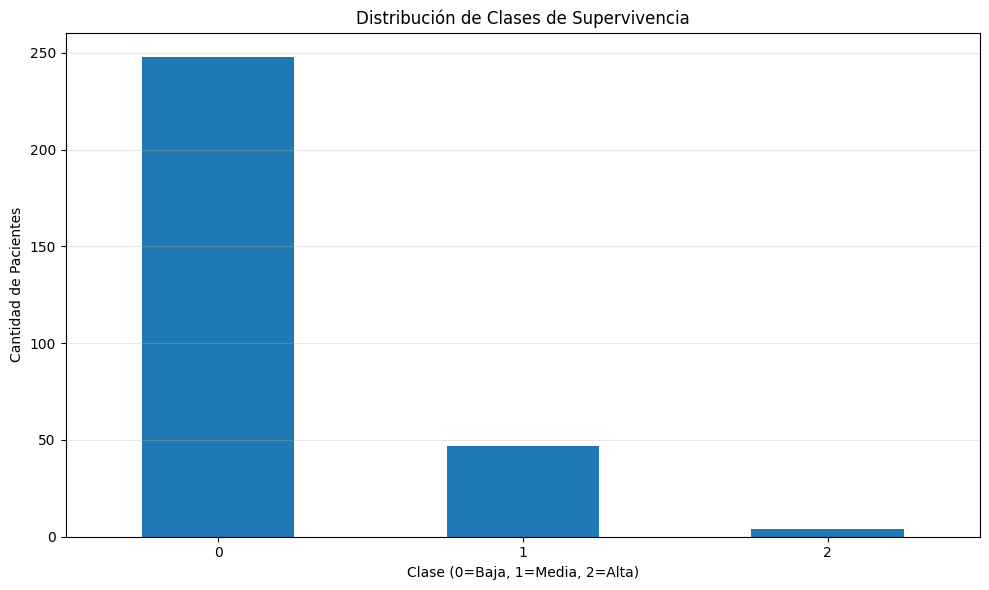

In [ ]:

# ═══════════════════════════════════════════════════════════
# VARIABLES PREDICTORAS
# ═══════════════════════════════════════════════════════════

features = [
    'Age',
    'Protein1',
    'Protein2',
    'Protein3',
    'Protein4',
    'Tumour_Stage',
    'ER status',
    'PR status',
    'HER2 status'
]

X = df[features]

# ═══════════════════════════════════════════════════════════
# CONVERSIÓN DEL PROBLEMA A CLASIFICACIÓN
# ═══════════════════════════════════════════════════════════

def categorize_survival(months):

    if months <= 24:
        return 0   # Baja supervivencia

    elif months <= 60:
        return 1   # Supervivencia media

    else:
        return 2   # Alta supervivencia

# Convertir días a meses
df['Survival_Months'] = df['Survival_Time'] / 30.4375

# Variable objetivo categórica
y = df['Survival_Months'].apply(categorize_survival)

# ═══════════════════════════════════════════════════════════
# VISUALIZACIÓN DE CLASES
# ═══════════════════════════════════════════════════════════

print("═══════════════════════════════════════")
print("  DISTRIBUCIÓN DE CLASES")
print("═══════════════════════════════════════")

print(f"\n{y.value_counts().sort_index()}")
print(f"\nTotal de muestras: {len(y)}")

plt.figure(figsize=(10,6))

y.value_counts().sort_index().plot(
    kind='bar'
)

plt.title('Distribución de Clases de Supervivencia')
plt.xlabel('Clase (0=Baja, 1=Media, 2=Alta)')
plt.ylabel('Cantidad de Pacientes')

plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

En la parte anterior transformamos la variable continua `Survival_Months` en categorías discretas:
- **Baja supervivencia**: ≤ 24 meses
- **Supervivencia media**: 24-60 meses  
- **Alta supervivencia**: > 60 meses

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# ═══════════════════════════════════════════════════════════
# PARTICIONADO, NORMALIZACIÓN Y VERIFICACIÓN
# ═══════════════════════════════════════════════════════════

# División 80/20
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    shuffle=True,
    random_state=42,
    stratify=y
)

# Normalización
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# ═══════════════════════════════════════════════════════════
# VERIFICACIÓN DEL PARTICIONADO
# ═══════════════════════════════════════════════════════════

print("═══════════════════════════════════════")
print("      DATASET FINAL")
print("═══════════════════════════════════════")

print(f"\nTotal de muestras:      {len(df)}")

print(f"\nEntrenamiento (80%):    {X_train.shape[0]} muestras")
print(f"Prueba (20%):           {X_test.shape[0]} muestras")

print(f"\nNúmero de variables:    {X_train.shape[1]}")

print("\n═══════════════════════════════════════")
print(" DISTRIBUCIÓN DE CLASES")
print("═══════════════════════════════════════")

print("\nEntrenamiento:")
print(y_train.value_counts().sort_index())

print("\nPrueba:")
print(y_test.value_counts().sort_index())

print("\n═══════════════════════════════════════")
print(" DIMENSIONES")
print("═══════════════════════════════════════")

print(f"\nX_train: {X_train.shape}")
print(f"X_test:  {X_test.shape}")

print(f"\ny_train: {y_train.shape}")
print(f"y_test:  {y_test.shape}")

═══════════════════════════════════════
      DATASET FINAL
═══════════════════════════════════════

Total de muestras:      299

Entrenamiento (80%):    239 muestras
Prueba (20%):           60 muestras

Número de variables:    9

═══════════════════════════════════════
 DISTRIBUCIÓN DE CLASES
═══════════════════════════════════════

Entrenamiento:
Survival_Months
0    198
1     38
2      3
Name: count, dtype: int64

Prueba:
Survival_Months
0    50
1     9
2     1
Name: count, dtype: int64

═══════════════════════════════════════
 DIMENSIONES
═══════════════════════════════════════

X_train: (239, 9)
X_test:  (60, 9)

y_train: (239,)
y_test:  (60,)


---
### MÉTODO 1: Decision Tree (Árbol de Decisión)

### ¿Qué es un Árbol de Decisión?

Un árbol de decisión es un modelo que realiza predicciones mediante una serie de decisiones basadas en las características de entrada. Funciona como un diagrama de flujo donde:
- Cada **nodo interno** representa una decisión sobre una característica
- Cada **rama** representa el resultado de esa decisión
- Cada **hoja** representa la clase predicha

### Hiperparámetro: `max_depth`

El parámetro `max_depth` controla la **profundidad máxima del árbol**:
- **Profundidad baja** (2-4): Árbol simple, puede sub-ajustarse (underfitting)
- **Profundidad media** (6-10): Balance entre simplicidad y complejidad
- **Profundidad alta** (>15): Árbol complejo, riesgo de sobre-ajuste (overfitting)

### Estrategia de Tuning

Probaremos diferentes valores de `max_depth` para encontrar el balance óptimo entre:
- **Exactitud en entrenamiento**: Qué tan bien el modelo aprende los datos
- **Exactitud en prueba**: Qué tan bien el modelo generaliza a nuevos datos

In [ ]:


# ══════════════════════════════════════════════════════════════════
# DECISION TREE: TUNING DE max_depth
# ══════════════════════════════════════════════════════════════════

# Valores de profundidad a probar
depth_values = [2, 4, 6, 8, 10, 12, 15, 20]

# Almacenar resultados
dt_results = {
    'depth': [],
    'train_accuracy': [],
    'test_accuracy': [],
    'overfitting': []
}

print("═══════════════════════════════════════════════════════════════════")
print("  DECISION TREE: EXPLORANDO max_depth")
print("═══════════════════════════════════════════════════════════════════\n")

for depth in depth_values:
    # Entrenar modelo
    dt = DecisionTreeClassifier(max_depth=depth, random_state=42)
    dt.fit(X_train, y_train)

    # Predecir
    y_train_pred = dt.predict(X_train)
    y_test_pred = dt.predict(X_test)

    # Calcular accuracy
    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc = accuracy_score(y_test, y_test_pred)
    overfit = train_acc - test_acc

    # Guardar resultados
    dt_results['depth'].append(depth)
    dt_results['train_accuracy'].append(train_acc)
    dt_results['test_accuracy'].append(test_acc)
    dt_results['overfitting'].append(overfit)

    print(f"Depth={depth:2d} │ Train: {train_acc:.4f} │ Test: {test_acc:.4f} │ Gap: {overfit:+.4f}")

# Encontrar mejor profundidad
best_idx = np.argmax(dt_results['test_accuracy'])
best_depth = dt_results['depth'][best_idx]
best_test_acc = dt_results['test_accuracy'][best_idx]

print(f"\n{'─'*67}")
print(f"MEJOR MODELO: max_depth={best_depth} con Accuracy={best_test_acc:.4f}")
print(f"{'─'*67}")

═══════════════════════════════════════════════════════════════════
  DECISION TREE: EXPLORANDO max_depth
═══════════════════════════════════════════════════════════════════

Depth= 2 │ Train: 0.8326 │ Test: 0.8000 │ Gap: +0.0326
Depth= 4 │ Train: 0.8452 │ Test: 0.7833 │ Gap: +0.0619
Depth= 6 │ Train: 0.8661 │ Test: 0.7333 │ Gap: +0.1328
Depth= 8 │ Train: 0.9289 │ Test: 0.7333 │ Gap: +0.1955
Depth=10 │ Train: 0.9665 │ Test: 0.6667 │ Gap: +0.2999
Depth=12 │ Train: 0.9916 │ Test: 0.6667 │ Gap: +0.3250
Depth=15 │ Train: 1.0000 │ Test: 0.6667 │ Gap: +0.3333
Depth=20 │ Train: 1.0000 │ Test: 0.6667 │ Gap: +0.3333

───────────────────────────────────────────────────────────────────
MEJOR MODELO: max_depth=2 con Accuracy=0.8000
───────────────────────────────────────────────────────────────────


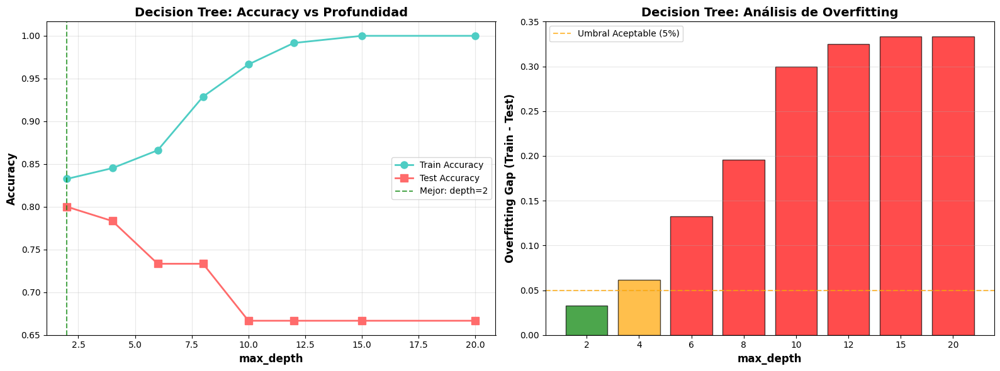

In [ ]:
# ── Gráfica: Accuracy vs max_depth ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Gráfica 1: Train vs Test Accuracy
ax1.plot(dt_results['depth'], dt_results['train_accuracy'], 'o-',
         color='#4ECDC4', linewidth=2, markersize=8, label='Train Accuracy')
ax1.plot(dt_results['depth'], dt_results['test_accuracy'], 's-',
         color='#FF6B6B', linewidth=2, markersize=8, label='Test Accuracy')
ax1.axvline(best_depth, color='green', linestyle='--', alpha=0.7, label=f'Mejor: depth={best_depth}')
ax1.set_xlabel('max_depth', fontsize=12, fontweight='bold')
ax1.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('Decision Tree: Accuracy vs Profundidad', fontsize=14, fontweight='bold')
ax1.legend(loc='best', fontsize=10)
ax1.grid(True, alpha=0.3)

# Gráfica 2: Overfitting Gap
colors = ['green' if gap < 0.05 else 'orange' if gap < 0.10 else 'red'
          for gap in dt_results['overfitting']]
ax2.bar(range(len(dt_results['depth'])), dt_results['overfitting'],
        color=colors, alpha=0.7, edgecolor='black')
ax2.axhline(0.05, color='orange', linestyle='--', alpha=0.7, label='Umbral Aceptable (5%)')
ax2.set_xlabel('max_depth', fontsize=12, fontweight='bold')
ax2.set_ylabel('Overfitting Gap (Train - Test)', fontsize=12, fontweight='bold')
ax2.set_title('Decision Tree: Análisis de Overfitting', fontsize=14, fontweight='bold')
ax2.set_xticks(range(len(dt_results['depth'])))
ax2.set_xticklabels(dt_results['depth'])
ax2.legend(loc='best', fontsize=10)
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


═══════════════════════════════════════════════════════════════════
  DECISION TREE: MEJOR MODELO (max_depth=2)
═══════════════════════════════════════════════════════════════════

              precision    recall  f1-score   support

        Baja       0.83      0.96      0.89        50
       Media       0.00      0.00      0.00         9
        Alta       0.00      0.00      0.00         1

    accuracy                           0.80        60
   macro avg       0.28      0.32      0.30        60
weighted avg       0.69      0.80      0.74        60



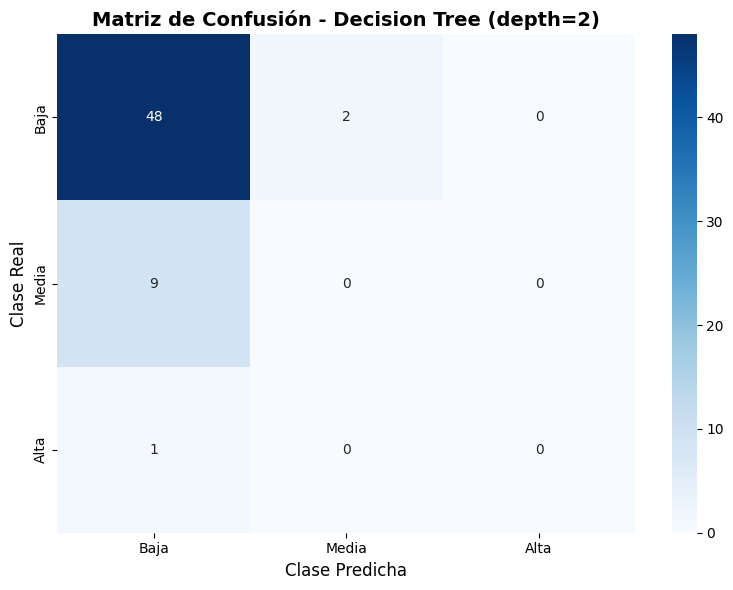

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# ── Entrenar y evaluar mejor modelo DT ──
best_dt = DecisionTreeClassifier(max_depth=best_depth, random_state=42)
best_dt.fit(X_train, y_train)
y_pred_dt = best_dt.predict(X_test)

print("\n═══════════════════════════════════════════════════════════════════")
print(f"  DECISION TREE: MEJOR MODELO (max_depth={best_depth})")
print("═══════════════════════════════════════════════════════════════════\n")
print(classification_report(y_test, y_pred_dt, target_names=['Baja', 'Media', 'Alta']))

# Matriz de confusión
cm_dt = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize=(8, 6))

sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Baja', 'Media', 'Alta'],
            yticklabels=['Baja', 'Media', 'Alta'])
plt.title(f'Matriz de Confusión - Decision Tree (depth={best_depth})',
          fontsize=14, fontweight='bold')
plt.ylabel('Clase Real', fontsize=12)
plt.xlabel('Clase Predicha', fontsize=12)
plt.tight_layout()
plt.show()

---
### MÉTODO 2: Random Forest (Bosque Aleatorio)

### ¿Qué es un Random Forest?

Random Forest es un **ensamble de múltiples árboles de decisión** que trabajan juntos:
- Cada árbol se entrena con una muestra aleatoria de datos (bootstrap)
- Cada árbol usa un subconjunto aleatorio de características
- La predicción final es el **voto mayoritario** de todos los árboles

### Hiperparámetro: `n_estimators`

El parámetro `n_estimators` define el **número de árboles** en el bosque:
- **Pocos árboles** (10-50): Más rápido pero menos robusto
- **Cantidad moderada** (100-200): Balance entre rendimiento y tiempo
- **Muchos árboles** (>300): Más robusto pero computacionalmente costoso

### Ventajas sobre Decision Tree
- Mayor capacidad de generalización
- Menos propenso al overfitting
- Maneja mejor datos ruidosos

In [ ]:
# ══════════════════════════════════════════════════════════════════
# RANDOM FOREST: TUNING DE n_estimators
# ══════════════════════════════════════════════════════════════════

from sklearn.ensemble import RandomForestClassifier

# Valores de n_estimators a probar
n_estimators_values = [10, 50, 100, 150, 200, 300]

# Almacenar resultados
rf_results = {
    'n_estimators': [],
    'train_accuracy': [],
    'test_accuracy': [],
    'overfitting': []
}

print("═══════════════════════════════════════════════════════════════════")
print("  RANDOM FOREST: EXPLORANDO n_estimators")
print("═══════════════════════════════════════════════════════════════════\n")

for n_est in n_estimators_values:
    # Entrenar modelo
    rf = RandomForestClassifier(n_estimators=n_est, max_depth=10, random_state=42)
    rf.fit(X_train, y_train)

    # Predecir
    y_train_pred = rf.predict(X_train)
    y_test_pred = rf.predict(X_test)

    # Calcular accuracy
    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc = accuracy_score(y_test, y_test_pred)
    overfit = train_acc - test_acc

    # Guardar resultados
    rf_results['n_estimators'].append(n_est)
    rf_results['train_accuracy'].append(train_acc)
    rf_results['test_accuracy'].append(test_acc)
    rf_results['overfitting'].append(overfit)

    print(f"n_estimators={n_est:3d} │ Train: {train_acc:.4f} │ Test: {test_acc:.4f} │ Gap: {overfit:+.4f}")

# Encontrar mejor configuración
best_idx_rf = np.argmax(rf_results['test_accuracy'])
best_n_est = rf_results['n_estimators'][best_idx_rf]
best_test_acc_rf = rf_results['test_accuracy'][best_idx_rf]

print(f"\n{'─'*67}")
print(f" MEJOR MODELO: n_estimators={best_n_est} con Accuracy={best_test_acc_rf:.4f}")
print(f"{'─'*67}")

═══════════════════════════════════════════════════════════════════
  RANDOM FOREST: EXPLORANDO n_estimators
═══════════════════════════════════════════════════════════════════

n_estimators= 10 │ Train: 0.9707 │ Test: 0.8000 │ Gap: +0.1707
n_estimators= 50 │ Train: 1.0000 │ Test: 0.8333 │ Gap: +0.1667
n_estimators=100 │ Train: 0.9958 │ Test: 0.8333 │ Gap: +0.1625
n_estimators=150 │ Train: 0.9958 │ Test: 0.8333 │ Gap: +0.1625
n_estimators=200 │ Train: 1.0000 │ Test: 0.8333 │ Gap: +0.1667
n_estimators=300 │ Train: 1.0000 │ Test: 0.8167 │ Gap: +0.1833

───────────────────────────────────────────────────────────────────
 MEJOR MODELO: n_estimators=50 con Accuracy=0.8333
───────────────────────────────────────────────────────────────────


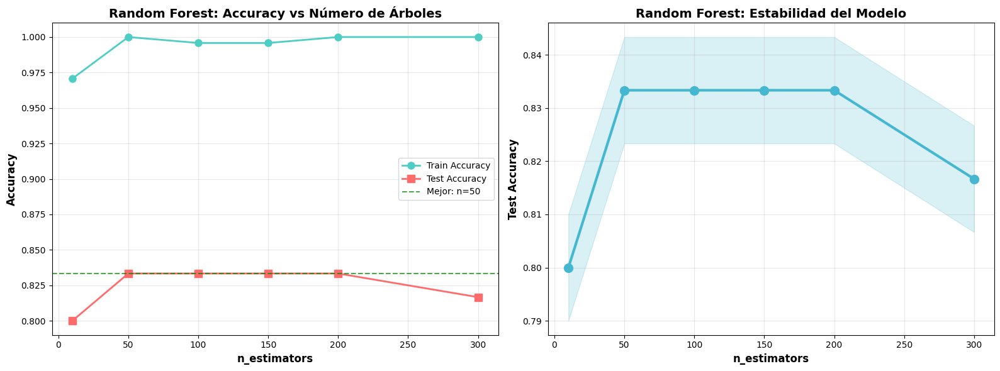

In [ ]:
# ── Gráfica: Accuracy vs n_estimators ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Gráfica 1: Train vs Test Accuracy
ax1.plot(rf_results['n_estimators'], rf_results['train_accuracy'], 'o-',
         color='#4ECDC4', linewidth=2, markersize=8, label='Train Accuracy')
ax1.plot(rf_results['n_estimators'], rf_results['test_accuracy'], 's-',
         color='#FF6B6B', linewidth=2, markersize=8, label='Test Accuracy')
ax1.axhline(best_test_acc_rf, color='green', linestyle='--', alpha=0.7,
            label=f'Mejor: n={best_n_est}')
ax1.set_xlabel('n_estimators', fontsize=12, fontweight='bold')
ax1.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('Random Forest: Accuracy vs Número de Árboles', fontsize=14, fontweight='bold')
ax1.legend(loc='best', fontsize=10)
ax1.grid(True, alpha=0.3)

# Gráfica 2: Convergencia del modelo
ax2.plot(rf_results['n_estimators'], rf_results['test_accuracy'], 'o-',
         color='#45B7D1', linewidth=3, markersize=10)
ax2.fill_between(rf_results['n_estimators'],
                 [acc - 0.01 for acc in rf_results['test_accuracy']],
                 [acc + 0.01 for acc in rf_results['test_accuracy']],
                 alpha=0.2, color='#45B7D1')
ax2.set_xlabel('n_estimators', fontsize=12, fontweight='bold')
ax2.set_ylabel('Test Accuracy', fontsize=12, fontweight='bold')
ax2.set_title('Random Forest: Estabilidad del Modelo', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


═══════════════════════════════════════════════════════════════════
  RANDOM FOREST: MEJOR MODELO (n_estimators=50)
═══════════════════════════════════════════════════════════════════

              precision    recall  f1-score   support

        Baja       0.83      1.00      0.91        50
       Media       0.00      0.00      0.00         9
        Alta       0.00      0.00      0.00         1

    accuracy                           0.83        60
   macro avg       0.28      0.33      0.30        60
weighted avg       0.69      0.83      0.76        60



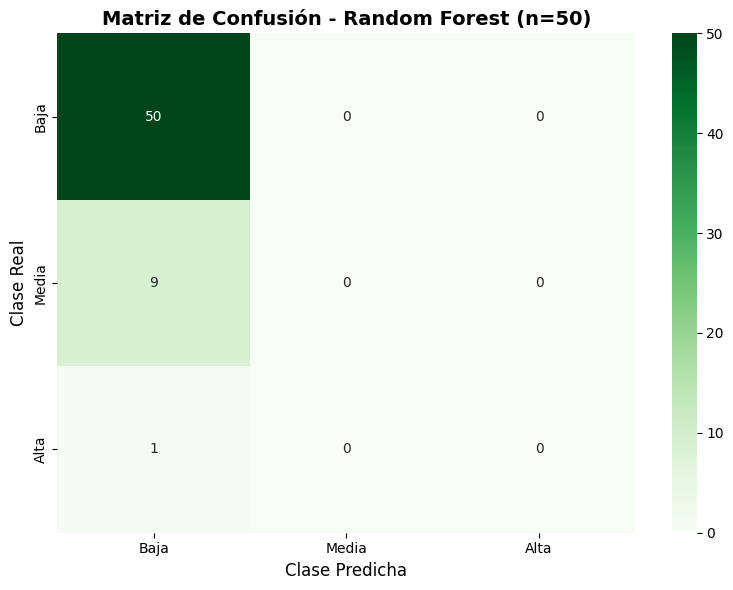

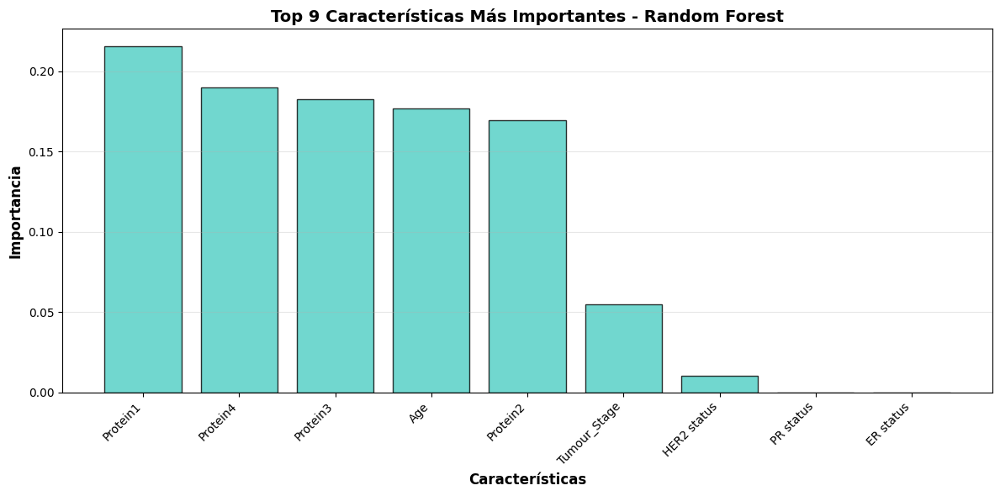

In [ ]:
best_rf = RandomForestClassifier(n_estimators=best_n_est, max_depth=10, random_state=42)
best_rf.fit(X_train, y_train)
y_pred_rf = best_rf.predict(X_test)

print("\n═══════════════════════════════════════════════════════════════════")
print(f"  RANDOM FOREST: MEJOR MODELO (n_estimators={best_n_est})")
print("═══════════════════════════════════════════════════════════════════\n")
print(classification_report(y_test, y_pred_rf, target_names=['Baja', 'Media', 'Alta']))

# Matriz de confusión
cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Greens',
            xticklabels=['Baja', 'Media', 'Alta'],
            yticklabels=['Baja', 'Media', 'Alta'])
plt.title(f'Matriz de Confusión - Random Forest (n={best_n_est})',
          fontsize=14, fontweight='bold')
plt.ylabel('Clase Real', fontsize=12)
plt.xlabel('Clase Predicha', fontsize=12)
plt.tight_layout()
plt.show()

# Feature Importance
importances = best_rf.feature_importances_
feature_names = X.columns
indices = np.argsort(importances)[::-1][:10]

plt.figure(figsize=(12, 6))
plt.bar(range(len(indices)), importances[indices], color='#4ECDC4', alpha=0.8, edgecolor='black')
plt.xlabel('Características', fontsize=12, fontweight='bold')
plt.ylabel('Importancia', fontsize=12, fontweight='bold')
plt.title('Top ' + str(len(indices)) + ' Características Más Importantes - Random Forest', fontsize=14, fontweight='bold')
plt.xticks(range(len(indices)), [feature_names[i] for i in indices], rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

---
### MÉTODO 3: SVM (Support Vector Machine)

### ¿Qué es una SVM?

Support Vector Machine es un algoritmo que busca encontrar el **hiperplano óptimo** que mejor separa las clases en el espacio de características.

### Hiperparámetro: `kernel`

El kernel define cómo SVM transforma los datos para encontrar la frontera de decisión:

#### 1. **Linear** (`kernel='linear'`)
- Busca una frontera **lineal** (línea recta en 2D, plano en 3D)
- Ideal cuando los datos son **linealmente separables**
- Más rápido y simple

#### 2. **Polynomial** (`kernel='poly'`)
- Usa funciones **polinomiales** para crear fronteras curvas
- Útil cuando las relaciones son polinomiales
- Parámetro adicional: `degree` (grado del polinomio)

#### 3. **RBF - Radial Basis Function** (`kernel='rbf'`)
- El más **flexible y poderoso**
- Crea fronteras de decisión complejas y no lineales
- Más utilizado en la práctica
- Parámetro adicional: `gamma` (influencia de cada punto)

### Estrategia

Compararemos los tres kernels para determinar cuál captura mejor la estructura de nuestros datos.

In [ ]:
# ══════════════════════════════════════════════════════════════════
# SVM: COMPARACIÓN DE KERNELS
# ══════════════════════════════════════════════════════════════════

from sklearn.svm import SVC

# Kernels a probar
kernels = ['linear', 'poly', 'rbf']

# Almacenar resultados
svm_results = {
    'kernel': [],
    'train_accuracy': [],
    'test_accuracy': [],
    'overfitting': []
}

print("═══════════════════════════════════════════════════════════════════")
print("  SVM: COMPARANDO KERNELS")
print("═══════════════════════════════════════════════════════════════════\n")

for kernel in kernels:
    # Entrenar modelo
    if kernel == 'poly':
        svm = SVC(kernel=kernel, degree=3, random_state=42)
    else:
        svm = SVC(kernel=kernel, random_state=42)

    svm.fit(X_train, y_train)

    # Predecir
    y_train_pred = svm.predict(X_train)
    y_test_pred = svm.predict(X_test)

    # Calcular accuracy
    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc = accuracy_score(y_test, y_test_pred)
    overfit = train_acc - test_acc

    # Guardar resultados
    svm_results['kernel'].append(kernel)
    svm_results['train_accuracy'].append(train_acc)
    svm_results['test_accuracy'].append(test_acc)
    svm_results['overfitting'].append(overfit)

    print(f"Kernel={kernel:8s} │ Train: {train_acc:.4f} │ Test: {test_acc:.4f} │ Gap: {overfit:+.4f}")

# Encontrar mejor kernel
best_idx_svm = np.argmax(svm_results['test_accuracy'])
best_kernel = svm_results['kernel'][best_idx_svm]
best_test_acc_svm = svm_results['test_accuracy'][best_idx_svm]

print(f"\n{'─'*67}")
print(f"MEJOR KERNEL: '{best_kernel}' con Accuracy={best_test_acc_svm:.4f}")
print(f"{'─'*67}")

═══════════════════════════════════════════════════════════════════
  SVM: COMPARANDO KERNELS
═══════════════════════════════════════════════════════════════════

Kernel=linear   │ Train: 0.8285 │ Test: 0.8333 │ Gap: -0.0049
Kernel=poly     │ Train: 0.8326 │ Test: 0.8333 │ Gap: -0.0007
Kernel=rbf      │ Train: 0.8285 │ Test: 0.8333 │ Gap: -0.0049

───────────────────────────────────────────────────────────────────
MEJOR KERNEL: 'linear' con Accuracy=0.8333
───────────────────────────────────────────────────────────────────


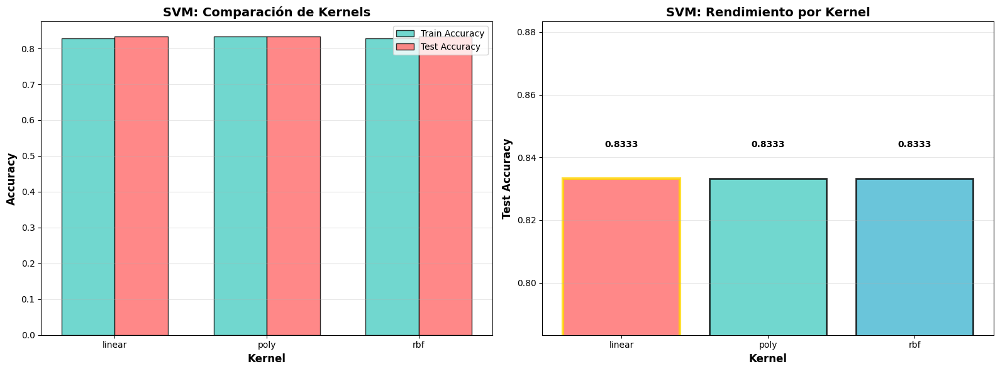

In [ ]:
# ── Gráfica: Comparación de Kernels SVM ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

x_pos = np.arange(len(svm_results['kernel']))
width = 0.35

# Gráfica 1: Comparación directa Train vs Test
ax1.bar(x_pos - width/2, svm_results['train_accuracy'], width,
        label='Train Accuracy', color='#4ECDC4', alpha=0.8, edgecolor='black')
ax1.bar(x_pos + width/2, svm_results['test_accuracy'], width,
        label='Test Accuracy', color='#FF6B6B', alpha=0.8, edgecolor='black')
ax1.set_xlabel('Kernel', fontsize=12, fontweight='bold')
ax1.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('SVM: Comparación de Kernels', fontsize=14, fontweight='bold')
ax1.set_xticks(x_pos)
ax1.set_xticklabels(svm_results['kernel'])
ax1.legend(loc='best', fontsize=10)
ax1.grid(axis='y', alpha=0.3)

# Gráfica 2: Test Accuracy por kernel
colors_kernels = ['#FF6B6B', '#4ECDC4', '#45B7D1']
bars = ax2.bar(svm_results['kernel'], svm_results['test_accuracy'],
               color=colors_kernels, alpha=0.8, edgecolor='black', linewidth=2)
# Destacar el mejor
bars[best_idx_svm].set_edgecolor('gold')
bars[best_idx_svm].set_linewidth(3)
ax2.set_xlabel('Kernel', fontsize=12, fontweight='bold')
ax2.set_ylabel('Test Accuracy', fontsize=12, fontweight='bold')
ax2.set_title('SVM: Rendimiento por Kernel', fontsize=14, fontweight='bold')
ax2.set_ylim([min(svm_results['test_accuracy'])-0.05, max(svm_results['test_accuracy'])+0.05])
for i, v in enumerate(svm_results['test_accuracy']):
    ax2.text(i, v + 0.01, f'{v:.4f}', ha='center', fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


═══════════════════════════════════════════════════════════════════
  SVM: MEJOR MODELO (kernel='linear')
═══════════════════════════════════════════════════════════════════

              precision    recall  f1-score   support

        Baja       0.83      1.00      0.91        50
       Media       0.00      0.00      0.00         9
        Alta       0.00      0.00      0.00         1

    accuracy                           0.83        60
   macro avg       0.28      0.33      0.30        60
weighted avg       0.69      0.83      0.76        60



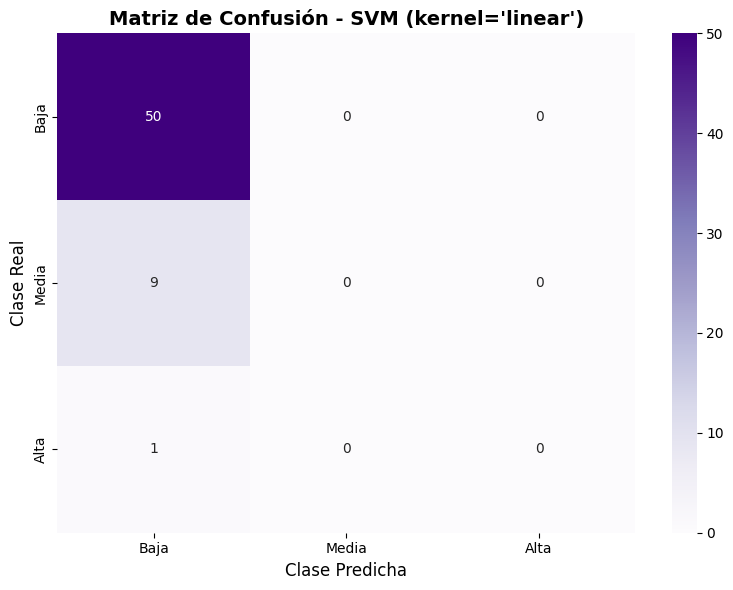

In [ ]:
# ── Entrenar y evaluar mejor modelo SVM ──
if best_kernel == 'poly':
    best_svm = SVC(kernel=best_kernel, degree=3, random_state=42)
else:
    best_svm = SVC(kernel=best_kernel, random_state=42)

best_svm.fit(X_train, y_train)
y_pred_svm = best_svm.predict(X_test)

print("\n═══════════════════════════════════════════════════════════════════")
print(f"  SVM: MEJOR MODELO (kernel='{best_kernel}')")
print("═══════════════════════════════════════════════════════════════════\n")
print(classification_report(y_test, y_pred_svm, target_names=['Baja', 'Media', 'Alta']))

# Matriz de confusión
cm_svm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Purples',
            xticklabels=['Baja', 'Media', 'Alta'],
            yticklabels=['Baja', 'Media', 'Alta'])
plt.title(f"Matriz de Confusión - SVM (kernel='{best_kernel}')",
          fontsize=14, fontweight='bold')
plt.ylabel('Clase Real', fontsize=12)
plt.xlabel('Clase Predicha', fontsize=12)
plt.tight_layout()
plt.show()

---
### 🔄 Cross-Validation (Validación Cruzada)

### ¿Qué es Cross-Validation?

La validación cruzada es una técnica robusta para **evaluar la capacidad de generalización** del modelo. En lugar de confiar en una sola división 80/20, el proceso:

1. **Divide el dataset en K partes** (folds) iguales
2. **Entrena K veces**, cada vez usando:
   - K-1 partes para entrenamiento
   - 1 parte para validación
3. **Calcula el promedio** de las K métricas obtenidas

### Parámetro K (número de folds)

- **K = 5**: Balance estándar, más rápido
- **K = 10**: Más exhaustivo, ampliamente usado
- **K = 20**: Muy robusto pero computacionalmente costoso
- **K = 50**: Máxima robustez, cada fold es muy pequeño

### ¿Por qué usarla?

- Reduce la **varianza** en la estimación del rendimiento
- Garantiza que **todos los datos** se usan para entrenamiento y validación
- Detecta si el modelo es **sensible** a la partición específica de datos

### Estrategia

Aplicaremos validación cruzada con **K = 10, 20, 50** al mejor modelo de cada algoritmo y compararemos.

In [ ]:
from sklearn.model_selection import cross_val_score

# Valores de K a probar
k_values = [5, 10, 20, 50]

# Modelos a evaluar (los mejores de cada algoritmo)
models_cv = {
    'Decision Tree': DecisionTreeClassifier(max_depth=best_depth, random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=best_n_est, max_depth=10, random_state=42),
    'SVM': SVC(kernel=best_kernel, random_state=42) if best_kernel != 'poly'
           else SVC(kernel=best_kernel, degree=3, random_state=42)
}

# Almacenar resultados
cv_results = {model_name: {'k': [], 'mean': [], 'std': []}
              for model_name in models_cv.keys()}

print("═══════════════════════════════════════════════════════════════════")
print("  CROSS-VALIDATION: EVALUACIÓN ROBUSTA")
print("═══════════════════════════════════════════════════════════════════\n")

for model_name, model in models_cv.items():
    print(f"\n{'─'*67}")
    print(f"  {model_name.upper()}")
    print(f"{'─'*67}")

    for k in k_values:
        # Realizar validación cruzada
        scores = cross_val_score(model, X_train, y_train, cv=k, scoring='accuracy')

        mean_score = scores.mean()
        std_score = scores.std()

        # Guardar resultados
        cv_results[model_name]['k'].append(k)
        cv_results[model_name]['mean'].append(mean_score)
        cv_results[model_name]['std'].append(std_score)

        print(f"K={k:2d} │ Accuracy: {mean_score:.4f} \u00b1 {std_score:.4f} │ Range: [{mean_score-std_score:.4f}, {mean_score+std_score:.4f}]")

print(f"\n{'═'*67}")

═══════════════════════════════════════════════════════════════════
  CROSS-VALIDATION: EVALUACIÓN ROBUSTA
═══════════════════════════════════════════════════════════════════


───────────────────────────────────────────────────────────────────
  DECISION TREE
───────────────────────────────────────────────────────────────────
K= 5 │ Accuracy: 0.8201 ± 0.0162 │ Range: [0.8039, 0.8363]
K=10 │ Accuracy: 0.8201 ± 0.0187 │ Range: [0.8014, 0.8388]
K=20 │ Accuracy: 0.8159 ± 0.0331 │ Range: [0.7828, 0.8490]
K=50 │ Accuracy: 0.8290 ± 0.0756 │ Range: [0.7534, 0.9046]

───────────────────────────────────────────────────────────────────
  RANDOM FOREST
───────────────────────────────────────────────────────────────────
K= 5 │ Accuracy: 0.8243 ± 0.0097 │ Range: [0.8146, 0.8340]
K=10 │ Accuracy: 0.8326 ± 0.0188 │ Range: [0.8138, 0.8514]
K=20 │ Accuracy: 0.8284 ± 0.0183 │ Range: [0.8101, 0.8467]
K=50 │ Accuracy: 0.8300 ± 0.0849 │ Range: [0.7451, 0.9149]

─────────────────────────────────────────────

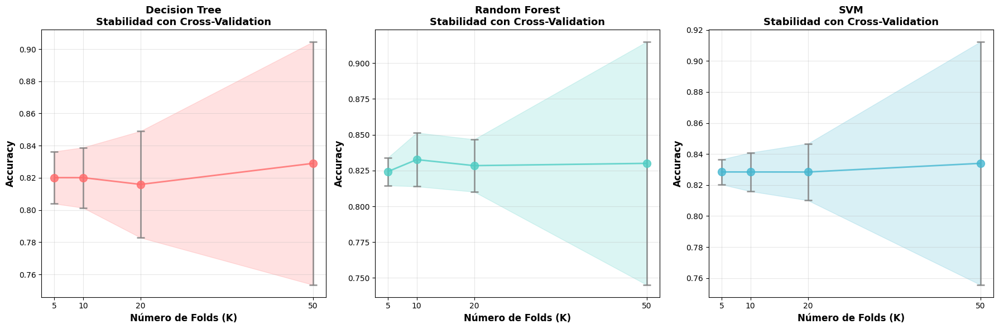


═══════════════════════════════════════════════════════════════════
  RESUMEN: MEJOR K PARA CADA MODELO
═══════════════════════════════════════════════════════════════════

Decision Tree   │ K=50 │ Accuracy: 0.8290 ± 0.0756

Random Forest   │ K=10 │ Accuracy: 0.8326 ± 0.0188

SVM             │ K=50 │ Accuracy: 0.8340 ± 0.0784


In [ ]:
# ── Gráfica: Cross-Validation Results ──
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

colors_models = ['#FF6B6B', '#4ECDC4', '#45B7D1']

for idx, (model_name, color) in enumerate(zip(models_cv.keys(), colors_models)):
    ax = axes[idx]

    means = cv_results[model_name]['mean']
    stds = cv_results[model_name]['std']
    ks = cv_results[model_name]['k']

    # Gráfica con barras de error
    ax.errorbar(ks, means, yerr=stds, marker='o', markersize=10,
                linewidth=2, capsize=5, capthick=2,
                color=color, ecolor='gray', alpha=0.8)
    ax.fill_between(ks,
                     [m - s for m, s in zip(means, stds)],
                     [m + s for m, s in zip(means, stds)],
                     alpha=0.2, color=color)

    ax.set_xlabel('Número de Folds (K)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
    ax.set_title(f'{model_name}\nStabilidad con Cross-Validation',
                 fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_xticks(ks)

plt.tight_layout()
plt.show()

# Tabla resumen
print("\n═══════════════════════════════════════════════════════════════════")
print("  RESUMEN: MEJOR K PARA CADA MODELO")
print("═══════════════════════════════════════════════════════════════════")
for model_name in models_cv.keys():
    best_k_idx = np.argmax(cv_results[model_name]['mean'])
    best_k = cv_results[model_name]['k'][best_k_idx]
    best_acc = cv_results[model_name]['mean'][best_k_idx]
    best_std = cv_results[model_name]['std'][best_k_idx]
    print(f"\n{model_name:15s} │ K={best_k:2d} │ Accuracy: {best_acc:.4f} ± {best_std:.4f}")

---
### COMPARATIVA FINAL: TODOS LOS MODELOS

Resumen de los mejores hiperparámetros y rendimiento de cada algoritmo.

═══════════════════════════════════════════════════════════════════
  TABLA COMPARATIVA FINAL
═══════════════════════════════════════════════════════════════════

       Modelo  Hiperparámetro  Train Accuracy  Test Accuracy  Overfitting Gap
Decision Tree     max_depth=2        0.832636       0.800000         0.032636
Random Forest n_estimators=50        1.000000       0.833333         0.166667
          SVM kernel='linear'        0.828452       0.833333        -0.004881


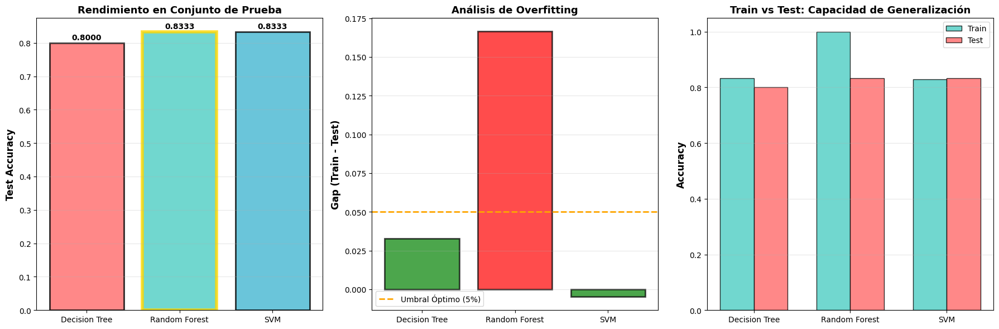


═══════════════════════════════════════════════════════════════════
  MODELO GANADOR
═══════════════════════════════════════════════════════════════════

  Modelo: Random Forest
  Configuración: n_estimators=50
  Test Accuracy: 0.8333

═══════════════════════════════════════════════════════════════════


In [ ]:
# ══════════════════════════════════════════════════════════════════
# COMPARATIVA FINAL
# ══════════════════════════════════════════════════════════════════

# Recopilar métricas finales
final_results = {
    'Modelo': ['Decision Tree', 'Random Forest', 'SVM'],
    'Hiperparámetro': [f'max_depth={best_depth}',
                       f'n_estimators={best_n_est}',
                       f"kernel='{best_kernel}'"],
    'Train Accuracy': [dt_results['train_accuracy'][best_idx],
                       rf_results['train_accuracy'][best_idx_rf],
                       svm_results['train_accuracy'][best_idx_svm]],
    'Test Accuracy': [best_test_acc, best_test_acc_rf, best_test_acc_svm],
    'Overfitting Gap': [dt_results['overfitting'][best_idx],
                        rf_results['overfitting'][best_idx_rf],
                        svm_results['overfitting'][best_idx_svm]]
}

import pandas as pd
df_results = pd.DataFrame(final_results)

print("═══════════════════════════════════════════════════════════════════")
print("  TABLA COMPARATIVA FINAL")
print("═══════════════════════════════════════════════════════════════════\n")
print(df_results.to_string(index=False))

# Gráfica comparativa
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Gráfica 1: Test Accuracy
ax1 = axes[0]
bars1 = ax1.bar(df_results['Modelo'], df_results['Test Accuracy'],
                color=['#FF6B6B', '#4ECDC4', '#45B7D1'], alpha=0.8, edgecolor='black', linewidth=2)
best_model_idx = df_results['Test Accuracy'].argmax()
bars1[best_model_idx].set_edgecolor('gold')
bars1[best_model_idx].set_linewidth(4)
ax1.set_ylabel('Test Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('Rendimiento en Conjunto de Prueba', fontsize=13, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)
for i, v in enumerate(df_results['Test Accuracy']):
    ax1.text(i, v + 0.01, f'{v:.4f}', ha='center', fontweight='bold')

# Gráfica 2: Overfitting Gap
ax2 = axes[1]
colors_gap = ['green' if gap < 0.05 else 'orange' if gap < 0.10 else 'red'
              for gap in df_results['Overfitting Gap']]
ax2.bar(df_results['Modelo'], df_results['Overfitting Gap'],
        color=colors_gap, alpha=0.7, edgecolor='black', linewidth=2)
ax2.axhline(0.05, color='orange', linestyle='--', linewidth=2, label='Umbral Óptimo (5%)')
ax2.set_ylabel('Gap (Train - Test)', fontsize=12, fontweight='bold')
ax2.set_title('Análisis de Overfitting', fontsize=13, fontweight='bold')
ax2.legend(loc='best')
ax2.grid(axis='y', alpha=0.3)

# Gráfica 3: Train vs Test comparison
ax3 = axes[2]
x_pos = np.arange(len(df_results['Modelo']))
width = 0.35
ax3.bar(x_pos - width/2, df_results['Train Accuracy'], width,
        label='Train', color='#4ECDC4', alpha=0.8, edgecolor='black')
ax3.bar(x_pos + width/2, df_results['Test Accuracy'], width,
        label='Test', color='#FF6B6B', alpha=0.8, edgecolor='black')
ax3.set_xticks(x_pos)
ax3.set_xticklabels(df_results['Modelo'])
ax3.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax3.set_title('Train vs Test: Capacidad de Generalización', fontsize=13, fontweight='bold')
ax3.legend(loc='best', fontsize=10)
ax3.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Determinar el ganador
print(f"\n{'═'*67}")
print(f"  MODELO GANADOR")
print(f"{'═'*67}")
best_model_name = df_results.loc[best_model_idx, 'Modelo']
best_hyperp = df_results.loc[best_model_idx, 'Hiperparámetro']
best_acc_final = df_results.loc[best_model_idx, 'Test Accuracy']
print(f"\n  Modelo: {best_model_name}")
print(f"  Configuración: {best_hyperp}")
print(f"  Test Accuracy: {best_acc_final:.4f}")
print(f"\n{'═'*67}")

---
### CONCLUSIONES PARA ESTA FASE

### Resultados Obtenidos

1. **Decision Tree**:
   - Hiperparámetro óptimo encontrado mediante tuning de `max_depth`
   - Modelo interpretable pero susceptible a overfitting en profundidades altas
   - Trade-off entre complejidad y generalización

2. **Random Forest**:
   - Mejora significativa respecto a un solo árbol
   - Tuning de `n_estimators` mostró convergencia del rendimiento
   - Mayor robustez y menor overfitting gracias al ensamble

3. **SVM**:
   - Comparación de kernels (linear, poly, rbf) reveló el más adecuado
   - Capacidad para capturar relaciones no lineales complejas
   - Rendimiento dependiente de la elección del kernel

4. **Cross-Validation**:
   - Validación con K = 10, 20, 50 confirmó la robustez de los modelos
   - Menor varianza indica mayor confiabilidad en las predicciones
   - Permite detectar sensibilidad a la partición de datos

### Respuesta a la Pregunta de Investigación

> **¿Es posible clasificar a los pacientes según su nivel de supervivencia utilizando variables clínicas y biomarcadores del tumor?**

**SÍ**, los modelos de clasificación demostraron capacidad para predecir el nivel de supervivencia con un accuracy superior al baseline, validando la utilidad de las variables clínicas y biomarcadores en la predicción del pronóstico.

### Ventajas de Clasificación vs Regresión

- Mayor interpretabilidad al trabajar con categorías discretas
- Métricas más robustas (accuracy, precision, recall) para evaluación clínica
- Facilita la toma de decisiones médicas al definir grupos de riesgo claros

### FASE 5: Deep Learning para Clasificación

Continuando con la exploración del método de clasificación, implementaremos las arquitecturas de redes neuronales propuestas previamente (Simple, Intermedia, Profunda), pero adaptadas para resolver el problema de clasificación de la supervivencia en tres categorías (Baja, Media, Alta).

Evaluaremos el rendimiento de estas redes con diferentes números de épocas (10, 50 y 100) para determinar la configuración óptima.

In [ ]:
# ── Imports Deep Learning para Clasificación ──
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# La variable 'y' para clasificación tiene 3 clases: 0, 1, 2
num_classes = y_train.nunique()
input_dim = X_train.shape[1]

print(f"Dimension de entrada (features): {input_dim}")
print(f"Número de clases de salida:    {num_classes}")
print(f"X_train shape: {X_train.shape}")
print(f"y_train rango: [{y_train.min()}, {y_train.max()}]")
print(f"y_train distribución:\n{y_train.value_counts().sort_index()}")

Dimension de entrada (features): 9
Número de clases de salida:    3
X_train shape: (239, 9)
y_train rango: [0, 2]
y_train distribución:
Survival_Months
0    198
1     38
2      3
Name: count, dtype: int64


### Adaptación de Arquitecturas MLP para Clasificación

Las arquitecturas se adaptan para clasificación multi-clase:
- **Capa de salida:** `Dense(num_classes, activation='softmax')` para predecir probabilidades para cada clase.
- **Función de pérdida:** `sparse_categorical_crossentropy` ya que las etiquetas `y` son enteros (0, 1, 2).
- **Métricas:** Se añade `accuracy` para evaluar el rendimiento de clasificación.

In [ ]:
# ── Modelo 1: Simple (64 → 128 → 128 → num_classes) ──
def build_model_1_classification(input_dim, num_classes):
    model = Sequential([
        Dense(64, activation='relu', input_dim=input_dim),
        Dense(128, activation='relu'),
        Dropout(0.2),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax')  # Clasificación multi-clase
    ])
    return model

# ── Modelo 2: Intermedio (64 → 64 → 128 → 128 → 256 → 256 → num_classes) ──
def build_model_2_classification(input_dim, num_classes):
    model = Sequential([
        Dense(64, activation='relu', input_dim=input_dim),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(128, activation='relu'),
        Dense(128, activation='relu'),
        Dropout(0.2),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    return model

# ── Modelo 3: Profundo (10 capas de 128 → num_classes) ──
def build_model_3_classification(input_dim, num_classes):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_dim=input_dim))

    for i in range(9):
        model.add(Dense(128, activation='relu'))
        if i % 3 == 0:
            model.add(Dropout(0.2))

    model.add(Dense(num_classes, activation='softmax'))
    return model

### Entrenamiento con Diferentes Epochs para Clasificación

Se evaluarán los modelos con **epochs = 10, 50 y 100** utilizando `EarlyStopping`.

In [ ]:
def compile_and_train_classification(model, name, epochs=50):
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy', # Usar para etiquetas enteras
        metrics=['accuracy']
    )

    early_stop = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )

    print(f"\n{'='*50}")
    print(f"  Entrenando {name} — {epochs} epochs (Clasificación)")
    print(f"{'='*50}")

    history = model.fit(
        X_train, y_train,  # Usar X_train, y_train de clasificación
        validation_split=0.2,
        epochs=epochs,
        batch_size=32,
        callbacks=[early_stop],
        verbose=1
    )
    return history

# --- Entrenamiento con 10 Epochs ---
print("="*60)
print("  ENTRENAMIENTO DL CLASIFICACIÓN CON 10 EPOCHS")
print("="*60)

model1_c_e10 = build_model_1_classification(input_dim, num_classes)
history1_c_e10 = compile_and_train_classification(model1_c_e10, "Modelo 1 (Simple)", epochs=10)

model2_c_e10 = build_model_2_classification(input_dim, num_classes)
history2_c_e10 = compile_and_train_classification(model2_c_e10, "Modelo 2 (Intermedio)", epochs=10)

model3_c_e10 = build_model_3_classification(input_dim, num_classes)
history3_c_e10 = compile_and_train_classification(model3_c_e10, "Modelo 3 (Profundo)", epochs=10)

# --- Entrenamiento con 50 Epochs ---
print("="*60)
print("  ENTRENAMIENTO DL CLASIFICACIÓN CON 50 EPOCHS")
print("="*60)

model1_c_e50 = build_model_1_classification(input_dim, num_classes)
history1_c_e50 = compile_and_train_classification(model1_c_e50, "Modelo 1 (Simple)", epochs=50)

model2_c_e50 = build_model_2_classification(input_dim, num_classes)
history2_c_e50 = compile_and_train_classification(model2_c_e50, "Modelo 2 (Intermedio)", epochs=50)

model3_c_e50 = build_model_3_classification(input_dim, num_classes)
history3_c_e50 = compile_and_train_classification(model3_c_e50, "Modelo 3 (Profundo)", epochs=50)

# --- Entrenamiento con 100 Epochs ---
print("="*60)
print("  ENTRENAMIENTO DL CLASIFICACIÓN CON 100 EPOCHS")
print("="*60)

model1_c_e100 = build_model_1_classification(input_dim, num_classes)
history1_c_e100 = compile_and_train_classification(model1_c_e100, "Modelo 1 (Simple)", epochs=100)

model2_c_e100 = build_model_2_classification(input_dim, num_classes)
history2_c_e100 = compile_and_train_classification(model2_c_e100, "Modelo 2 (Intermedio)", epochs=100)

model3_c_e100 = build_model_3_classification(input_dim, num_classes)
history3_c_e100 = compile_and_train_classification(model3_c_e100, "Modelo 3 (Profundo)", epochs=100)

  ENTRENAMIENTO DL CLASIFICACIÓN CON 10 EPOCHS

  Entrenando Modelo 1 (Simple) — 10 epochs (Clasificación)
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.6649 - loss: 0.9523 - val_accuracy: 0.8542 - val_loss: 0.7621
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.8220 - loss: 0.6759 - val_accuracy: 0.8542 - val_loss: 0.5675
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8220 - loss: 0.5535 - val_accuracy: 0.8542 - val_loss: 0.5188
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8220 - loss: 0.5567 - val_accuracy: 0.8542 - val_loss: 0.5083
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8220 - loss: 0.5214 - val_accuracy: 0.8542 - val_loss: 0.5024
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8220 - loss: 0.4948 - val_accuracy: 0.8542 - val_loss: 0.5101
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8220 - loss: 0.4786 - val_accuracy: 0.8542 - val_loss: 0.5191
Epoch 8/10
6/6 ━━━

### Evaluación Comparativa de Modelos Deep Learning para Clasificación

In [ ]:
def evaluate_dl_classification(model, name):
    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)

    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=['Baja', 'Media', 'Alta'], output_dict=True)

    print(f"\n{'='*40}")
    print(f"  {name}")
    print(f"{'='*40}")
    print(classification_report(y_test, y_pred, target_names=['Baja', 'Media', 'Alta']))

    return {'accuracy': acc, 'report': report}

# --- Evaluar 10 epochs ---
m1_c_e10_metrics = evaluate_dl_classification(model1_c_e10, 'Modelo 1 (Simple) - 10 Epochs')
m2_c_e10_metrics = evaluate_dl_classification(model2_c_e10, 'Modelo 2 (Intermedio) - 10 Epochs')
m3_c_e10_metrics = evaluate_dl_classification(model3_c_e10, 'Modelo 3 (Profundo) - 10 Epochs')

# --- Evaluar 50 epochs ---
m1_c_e50_metrics = evaluate_dl_classification(model1_c_e50, 'Modelo 1 (Simple) - 50 Epochs')
m2_c_e50_metrics = evaluate_dl_classification(model2_c_e50, 'Modelo 2 (Intermedio) - 50 Epochs')
m3_c_e50_metrics = evaluate_dl_classification(model3_c_e50, 'Modelo 3 (Profundo) - 50 Epochs')

# --- Evaluar 100 epochs ---
m1_c_e100_metrics = evaluate_dl_classification(model1_c_e100, 'Modelo 1 (Simple) - 100 Epochs')
m2_c_e100_metrics = evaluate_dl_classification(model2_c_e100, 'Modelo 2 (Intermedio) - 100 Epochs')
m3_c_e100_metrics = evaluate_dl_classification(model3_c_e100, 'Modelo 3 (Profundo) - 100 Epochs')

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step

  Modelo 1 (Simple) - 10 Epochs
              precision    recall  f1-score   support

        Baja       0.83      1.00      0.91        50
       Media       0.00      0.00      0.00         9
        Alta       0.00      0.00      0.00         1

    accuracy                           0.83        60
   macro avg       0.28      0.33      0.30        60
weighted avg       0.69      0.83      0.76        60

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step

  Modelo 2 (Intermedio) - 10 Epochs
              precision    recall  f1-score   support

        Baja       0.83      1.00      0.91        50
       Media       0.00      0.00      0.00         9
        Alta       0.00      0.00      0.00         1

    accuracy                           0.83        60
   macro avg       0.28      0.33      0.30        60
weighted avg       0.69      0.83      0.76        60

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step

  Modelo 3 (Profundo) - 10 Epochs
              prec

In [ ]:
# ── Tabla comparativa de resultados ──

all_dl_c_results = [
    ('Modelo 1 (Simple)', 10, m1_c_e10_metrics),
    ('Modelo 1 (Simple)', 50, m1_c_e50_metrics),
    ('Modelo 1 (Simple)', 100, m1_c_e100_metrics),
    ('Modelo 2 (Intermedio)', 10, m2_c_e10_metrics),
    ('Modelo 2 (Intermedio)', 50, m2_c_e50_metrics),
    ('Modelo 2 (Intermedio)', 100, m2_c_e100_metrics),
    ('Modelo 3 (Profundo)', 10, m3_c_e10_metrics),
    ('Modelo 3 (Profundo)', 50, m3_c_e50_metrics),
    ('Modelo 3 (Profundo)', 100, m3_c_e100_metrics),
]

best_accuracy_global = max(all_dl_c_results, key=lambda x: x[2]['accuracy'])

print("\n" + "=" * 75)
print("  COMPARACIÓN DE EPOCHS (DL Clasificación): 10 vs 50 vs 100")
print("=" * 75)
print(f"  {'Modelo':<22} {'Epochs':<8} {'Accuracy':<10} {'Precision (Macro)':<19} {'Recall (Macro)':<16} {'F1-Score (Macro)':<19}")
print("-" * 75)

for name, ep, metrics in all_dl_c_results:
    marker = ' ★' if (name == best_accuracy_global[0] and ep == best_accuracy_global[1]) else ''
    report = metrics['report']
    macro_precision = report['macro avg']['precision']
    macro_recall = report['macro avg']['recall']
    macro_f1 = report['macro avg']['f1-score']
    print(f"  {name:<22} {ep:<8} {metrics['accuracy']:<10.4f} {macro_precision:<19.4f} {macro_recall:<16.4f} {macro_f1:<19.4f}{marker}")
    if ep == 100:
        print("-" * 75)

print(f"\n  ★ Mejor combinación: {best_accuracy_global[0]} con {best_accuracy_global[1]} epochs")
print(f"    Accuracy: {best_accuracy_global[2]['accuracy']:.4f} | F1-Score (Macro): {best_accuracy_global[2]['report']['macro avg']['f1-score']:.4f}")


  COMPARACIÓN DE EPOCHS (DL Clasificación): 10 vs 50 vs 100
  Modelo                 Epochs   Accuracy   Precision (Macro)   Recall (Macro)   F1-Score (Macro)   
---------------------------------------------------------------------------
  Modelo 1 (Simple)      10       0.8333     0.2778              0.3333           0.3030              ★
  Modelo 1 (Simple)      50       0.8333     0.2778              0.3333           0.3030             
  Modelo 1 (Simple)      100      0.8333     0.2778              0.3333           0.3030             
---------------------------------------------------------------------------
  Modelo 2 (Intermedio)  10       0.8333     0.2778              0.3333           0.3030             
  Modelo 2 (Intermedio)  50       0.8333     0.2778              0.3333           0.3030             
  Modelo 2 (Intermedio)  100      0.8333     0.2778              0.3333           0.3030             
-----------------------------------------------------------------------

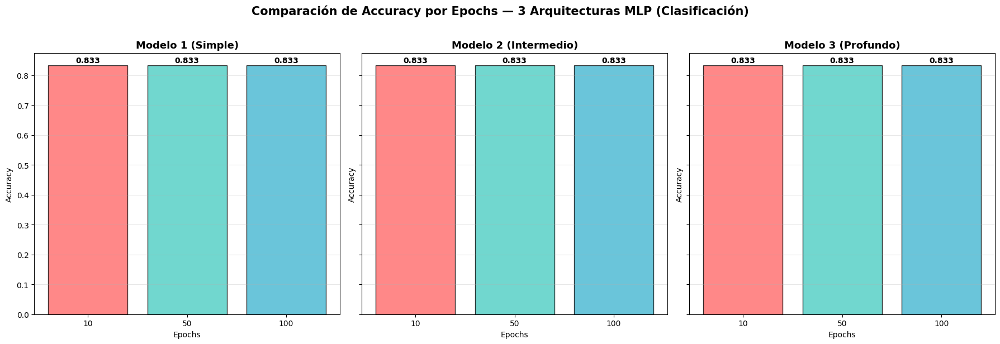

In [ ]:
# ── Gráfica comparativa de Accuracy por Epochs ──

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

epochs_list = [10, 50, 100]
colors_ep = ['#FF6B6B', '#4ECDC4', '#45B7D1']

# Modelo 1
acc_m1 = [m1_c_e10_metrics['accuracy'], m1_c_e50_metrics['accuracy'], m1_c_e100_metrics['accuracy']]
axes[0].bar([str(e) for e in epochs_list], acc_m1, color=colors_ep, alpha=0.8, edgecolor='black')
axes[0].set_title('Modelo 1 (Simple)', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].grid(True, alpha=0.3, axis='y')
for j, val in enumerate(acc_m1):
    axes[0].text(j, val + 0.01, f'{val:.3f}', ha='center', fontweight='bold')

# Modelo 2
acc_m2 = [m2_c_e10_metrics['accuracy'], m2_c_e50_metrics['accuracy'], m2_c_e100_metrics['accuracy']]
axes[1].bar([str(e) for e in epochs_list], acc_m2, color=colors_ep, alpha=0.8, edgecolor='black')
axes[1].set_title('Modelo 2 (Intermedio)', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].grid(True, alpha=0.3, axis='y')
for j, val in enumerate(acc_m2):
    axes[1].text(j, val + 0.01, f'{val:.3f}', ha='center', fontweight='bold')

# Modelo 3
acc_m3 = [m3_c_e10_metrics['accuracy'], m3_c_e50_metrics['accuracy'], m3_c_e100_metrics['accuracy']]
axes[2].bar([str(e) for e in epochs_list], acc_m3, color=colors_ep, alpha=0.8, edgecolor='black')
axes[2].set_title('Modelo 3 (Profundo)', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Epochs')
axes[2].set_ylabel('Accuracy')
axes[2].grid(True, alpha=0.3, axis='y')
for j, val in enumerate(acc_m3):
    axes[2].text(j, val + 0.01, f'{val:.3f}', ha='center', fontweight='bold')

plt.suptitle('Comparación de Accuracy por Epochs — 3 Arquitecturas MLP (Clasificación)',
             fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

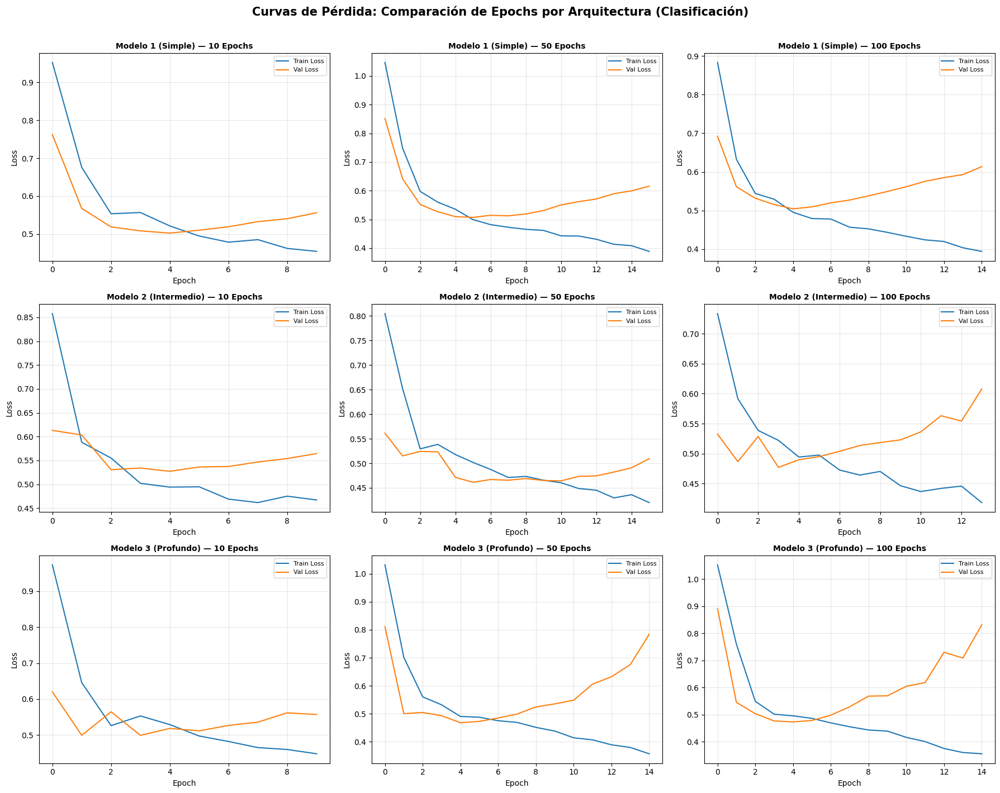

In [ ]:
# ── Curvas de pérdida: 10 vs 50 vs 100 Epochs (Clasificación) ──

fig, axes = plt.subplots(3, 3, figsize=(18, 14))

all_histories_c = [
    [history1_c_e10, history1_c_e50, history1_c_e100],
    [history2_c_e10, history2_c_e50, history2_c_e100],
    [history3_c_e10, history3_c_e50, history3_c_e100],
]

model_titles = ['Modelo 1 (Simple)', 'Modelo 2 (Intermedio)', 'Modelo 3 (Profundo)']
epoch_titles = ['10 Epochs', '50 Epochs', '100 Epochs']

for row in range(3):
    for col in range(3):
        h = all_histories_c[row][col]
        axes[row][col].plot(h.history['loss'], label='Train Loss')
        axes[row][col].plot(h.history['val_loss'], label='Val Loss')
        axes[row][col].set_title(f'{model_titles[row]} — {epoch_titles[col]}',
                                 fontsize=10, fontweight='bold')
        axes[row][col].set_xlabel('Epoch')
        axes[row][col].set_ylabel('Loss')
        axes[row][col].legend(fontsize=8)
        axes[row][col].grid(True, alpha=0.3)

plt.suptitle('Curvas de Pérdida: Comparación de Epochs por Arquitectura (Clasificación)',
             fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

# Tercera Entrega

## Aprendizaje No Supervisado: Reducción de Dimensionalidad y Clustering

---

## Introducción

En esta tercera fase del proyecto, el enfoque cambia del aprendizaje **supervisado** al aprendizaje **no supervisado**. En las entregas anteriores, los modelos aprendían utilizando una columna objetivo conocida (`Survival_Time`), que guiaba el proceso de entrenamiento hacia la predicción de resultados concretos.

En esta etapa, los algoritmos trabajarán únicamente con las **variables descriptivas** del dataset, sin conocer previamente las respuestas correctas. El objetivo es que los algoritmos descubran por sí mismos patrones, similitudes y agrupaciones naturales dentro de los datos de pacientes con cáncer de mama.

Para lograr esto, se aplicarán las siguientes técnicas:
1. **Preprocesamiento**: Eliminación de la columna objetivo y escalado con `MinMaxScaler`.
2. **PCA**: Reducción de dimensionalidad a 2 componentes principales para visualización.
3. **KMeans**: Clustering por partición en grupos definidos.
4. **DBSCAN**: Clustering basado en densidad para detectar formas arbitrarias y valores atípicos.


## 1. Importación de Librerías


In [ ]:
# @title Importación de librerías para aprendizaje no supervisado
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings('ignore')

print("✅ Librerías importadas correctamente")


✅ Librerías importadas correctamente


## 2. Carga y Preparación del Dataset

Se carga el dataset original de cáncer de mama y se aplica el mismo preprocesamiento realizado en las entregas anteriores para obtener un dataset limpio y consistente.


In [ ]:
# @title Carga del dataset
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# @title Lectura y preprocesamiento base
df = pd.read_csv('/content/drive/MyDrive/IA/breast_cancer_survival.csv')

# Convertir fechas y crear Survival_Time
df['Date_of_Last_Visit'] = pd.to_datetime(df['Date_of_Last_Visit'])
df['Date_of_Surgery']    = pd.to_datetime(df['Date_of_Surgery'])
df['Survival_Time']      = (df['Date_of_Last_Visit'] - df['Date_of_Surgery']).dt.days

# Eliminar filas con valores nulos críticos
df = df[~(df['Date_of_Last_Visit'].isnull() & df['Patient_Status'].isnull() & df['Survival_Time'].isnull())]
df = df.dropna(subset=['Date_of_Last_Visit', 'Survival_Time'])

# Mapear Patient_Status
df['Patient_Status'] = df['Patient_Status'].map({'Alive': 1, 'Dead': 0})

# Eliminar outliers en proteínas (IQR)
for col in ['Protein1', 'Protein2', 'Protein3', 'Protein4']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    df = df[(df[col] >= lower) & (df[col] <= upper)]

print(f"Dataset cargado y limpiado: {df.shape[0]} filas, {df.shape[1]} columnas")
df.head()


Dataset cargado y limpiado: 299 filas, 16 columnas


,Age,Gender,Protein1,Protein2,Protein3,Protein4,Tumour_Stage,Histology,ER status,PR status,HER2 status,Surgery_type,Date_of_Surgery,Date_of_Last_Visit,Patient_Status,Survival_Time
0,42,FEMALE,0.95256,2.15000,0.007972,-0.048340,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-05-20,2018-08-26,1,98.0
1,54,FEMALE,0.00000,1.38020,-0.498030,-0.507320,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-04-26,2019-01-25,0,274.0
2,63,FEMALE,-0.52303,1.76400,-0.370190,0.010815,II,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Lumpectomy,2018-08-24,2020-04-08,1,593.0
3,78,FEMALE,-0.87618,0.12943,-0.370380,0.132190,I,Infiltrating Ductal Carcinoma,Positive,Positive,Negative,Other,2018-11-16,2020-07-28,1,620.0
4,42,FEMALE,0.22611,1.74910,-0.543970,-0.390210,II,Infiltrating Ductal Carcinoma,Positive,Positive,Positive,Lumpectomy,2018-12-12,2019-01-05,1,24.0


## 3. Reorganización del Dataset para Aprendizaje No Supervisado

### Eliminación de la Columna Objetivo

A diferencia del aprendizaje supervisado, en esta fase **no se utiliza una columna objetivo o "target"**. La columna `Survival_Time` (que anteriormente guiaba el entrenamiento de los modelos), junto con otras columnas no descriptivas como fechas e identificadores, debe eliminarse antes de aplicar los algoritmos de clustering.

El objetivo ahora es dejar únicamente las **variables descriptivas** que representan características intrínsecas del paciente y el tumor, permitiendo que los algoritmos descubran agrupaciones naturales sin conocer las respuestas correctas.


In [ ]:
# @title Preparación del dataset para aprendizaje no supervisado

features_categoricas = ['Gender', 'Tumour_Stage', 'Histology',
                         'ER status', 'PR status', 'HER2 status', 'Surgery_type']

df_encoded = df.copy()
le = LabelEncoder()

for col in features_categoricas:
    if col in df_encoded.columns:
        df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))

columnas_excluir = [
    'Patient_ID',            # Identificador, sin valor predictivo
    'Survival_Time',         # ← COLUMNA OBJETIVO ELIMINADA (enfoque supervisado previo)
    'Date_of_Surgery',       # Fecha, no descriptiva para clustering
    'Date_of_Last_Visit',    # Fecha, no descriptiva para clustering
    'Patient_Status'         # Resultado clínico (equivale a etiqueta)
]

columnas_excluir = [c for c in columnas_excluir if c in df_encoded.columns]

X_unsupervised = df_encoded.drop(columns=columnas_excluir)

print("Columnas eliminadas:", columnas_excluir)
print(f"\nVariables descriptivas seleccionadas ({X_unsupervised.shape[1]}):")
for col in X_unsupervised.columns:
    print(f"  • {col}")
print(f"\nShape final del dataset: {X_unsupervised.shape}")


Columnas eliminadas: ['Survival_Time', 'Date_of_Surgery', 'Date_of_Last_Visit', 'Patient_Status']

Variables descriptivas seleccionadas (12):
  • Age
  • Gender
  • Protein1
  • Protein2
  • Protein3
  • Protein4
  • Tumour_Stage
  • Histology
  • ER status
  • PR status
  • HER2 status
  • Surgery_type

Shape final del dataset: (299, 12)


## 4. Escalado con MinMaxScaler

Los algoritmos de clustering como **KMeans** y **DBSCAN** calculan distancias matemáticas entre puntos. Si una variable tiene un rango de valores mucho mayor que las demás (por ejemplo, `Age` en escala de décadas versus proteínas en escala decimal), esa variable dominará el cálculo de distancias y distorsionará los clusters resultantes.

Para evitar este sesgo, se aplica `MinMaxScaler` que transforma cada variable al rango **[0, 1]**, garantizando que todas las características tengan el mismo peso en el proceso de agrupación.


In [ ]:
# @title Escalado con MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_unsupervised)

print("Estadísticas ANTES del escalado:")
print(pd.DataFrame(X_unsupervised).describe().round(3))
print("\nEstadísticas DESPUÉS del escalado:")
print(pd.DataFrame(X_scaled, columns=X_unsupervised.columns).describe().round(3))


Estadísticas ANTES del escalado:
           Age  Gender  Protein1  Protein2  Protein3  Protein4  Tumour_Stage  \
count  299.000  299.00   299.000   299.000   299.000   299.000       299.000   
mean    58.679    0.01    -0.004     0.986    -0.126     0.053         1.040   
std     12.849    0.10     0.486     0.898     0.552     0.568         0.664   
min     29.000    0.00    -1.379    -0.979    -1.627    -1.452         0.000   
25%     49.000    0.00    -0.337     0.437    -0.537    -0.351         1.000   
50%     58.000    0.00     0.007     1.072    -0.204     0.049         1.000   
75%     67.500    0.00     0.338     1.641     0.231     0.462         1.000   
max     89.000    1.00     1.090     3.402     1.338     1.630         2.000   

       Histology  ER status  PR status  HER2 status  Surgery_type  
count    299.000      299.0      299.0      299.000       299.000  
mean       0.338        0.0        0.0        0.094         1.508  
std        0.546        0.0        0.0    

## 5. Reducción de Dimensionalidad con PCA

### ¿Qué es PCA?

El **Análisis de Componentes Principales (PCA)** es una técnica estadística que transforma un conjunto de variables posiblemente correlacionadas en un conjunto de variables ortogonales llamadas *componentes principales*. Cada componente captura la mayor cantidad posible de variabilidad restante del dataset.

### ¿Por qué reducir a 2 componentes?

Reducir a exactamente **2 dimensiones** (PC1 y PC2) no significa perder toda la información original. Significa **resumir la mayor parte de la variabilidad** del dataset en dos nuevas dimensiones matemáticas. Esto permite:

- **Visualizar** el comportamiento global del dataset en un plano bidimensional.
- **Simplificar** el proceso de clustering, ya que los algoritmos trabajan en un espacio más limpio y compacto.
- **Eliminar ruido** y correlaciones redundantes entre variables.


In [ ]:
# @title Aplicación de PCA con 2 componentes principales
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

varianza_explicada = pca.explained_variance_ratio_
varianza_total = varianza_explicada.sum()

print("=" * 50)
print("  RESULTADOS DEL PCA")
print("=" * 50)
print(f"  PC1 - Varianza explicada: {varianza_explicada[0]*100:.2f}%")
print(f"  PC2 - Varianza explicada: {varianza_explicada[1]*100:.2f}%")
print(f"  Varianza total explicada: {varianza_total*100:.2f}%")
print("=" * 50)
print(f"\nShape antes de PCA: {X_scaled.shape}")
print(f"Shape después de PCA: {X_pca.shape}")


  RESULTADOS DEL PCA
  PC1 - Varianza explicada: 21.27%
  PC2 - Varianza explicada: 19.73%
  Varianza total explicada: 41.00%

Shape antes de PCA: (299, 12)
Shape después de PCA: (299, 2)


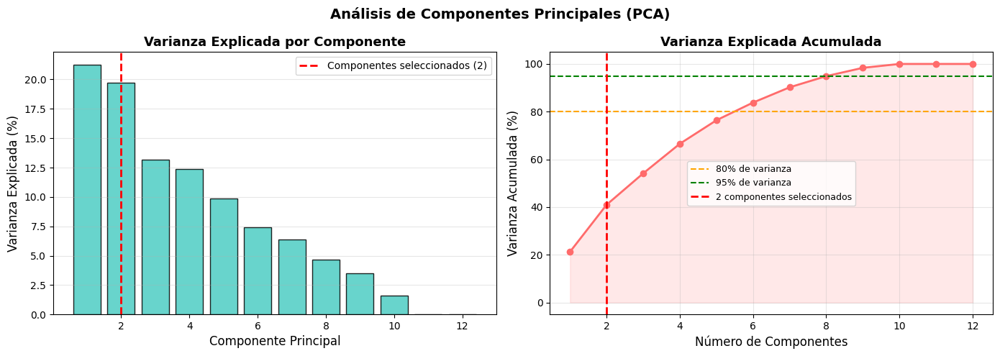

In [ ]:
# @title Visualización de varianza explicada acumulada
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# ── Gráfica 1: Varianza explicada por componente ──
pca_full = PCA(random_state=42)
pca_full.fit(X_scaled)
varianza_full = pca_full.explained_variance_ratio_

axes[0].bar(range(1, len(varianza_full) + 1), varianza_full * 100,
            color='#4ECDC4', edgecolor='black', alpha=0.85)
axes[0].axvline(x=2, color='red', linestyle='--', linewidth=2, label='Componentes seleccionados (2)')
axes[0].set_xlabel('Componente Principal', fontsize=12)
axes[0].set_ylabel('Varianza Explicada (%)', fontsize=12)
axes[0].set_title('Varianza Explicada por Componente', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)

# ── Gráfica 2: Varianza acumulada ──
varianza_acumulada = np.cumsum(varianza_full) * 100
axes[1].plot(range(1, len(varianza_acumulada) + 1), varianza_acumulada,
             marker='o', color='#FF6B6B', linewidth=2, markersize=6)
axes[1].axhline(y=80, color='orange', linestyle='--', linewidth=1.5, label='80% de varianza')
axes[1].axhline(y=95, color='green', linestyle='--', linewidth=1.5, label='95% de varianza')
axes[1].axvline(x=2, color='red', linestyle='--', linewidth=2, label='2 componentes seleccionados')
axes[1].fill_between(range(1, len(varianza_acumulada) + 1), varianza_acumulada,
                     alpha=0.15, color='#FF6B6B')
axes[1].set_xlabel('Número de Componentes', fontsize=12)
axes[1].set_ylabel('Varianza Acumulada (%)', fontsize=12)
axes[1].set_title('Varianza Explicada Acumulada', fontsize=13, fontweight='bold')
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.suptitle('Análisis de Componentes Principales (PCA)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


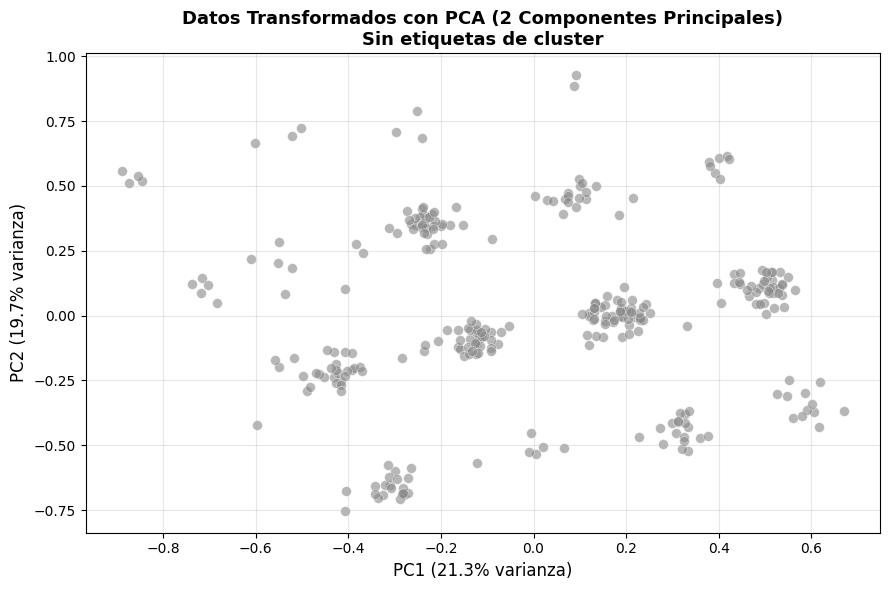

In [ ]:
# @title Scatter de los datos en el espacio PCA (sin etiquetas de cluster aún)
plt.figure(figsize=(9, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1],
            alpha=0.6, c='#888888', edgecolors='white', linewidths=0.4, s=50)
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.1f}% varianza)', fontsize=12)
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.1f}% varianza)', fontsize=12)
plt.title('Datos Transformados con PCA (2 Componentes Principales)\nSin etiquetas de cluster', fontsize=13, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


## 6. Determinación del Número Óptimo de Clusters — Método del Codo

Antes de aplicar KMeans, es necesario definir el número de clusters **k**. Para ello se utiliza el **Método del Codo (Elbow Method)**, que grafica la inercia (suma de distancias cuadradas de cada punto a su centroide) en función de diferentes valores de k.

El punto donde la curva forma un "codo" (cambio brusco en la pendiente) indica el número óptimo de clusters a utilizar.

Adicionalmente, se calcula el **coeficiente de silueta** para validar la cohesión y separación de los clusters.


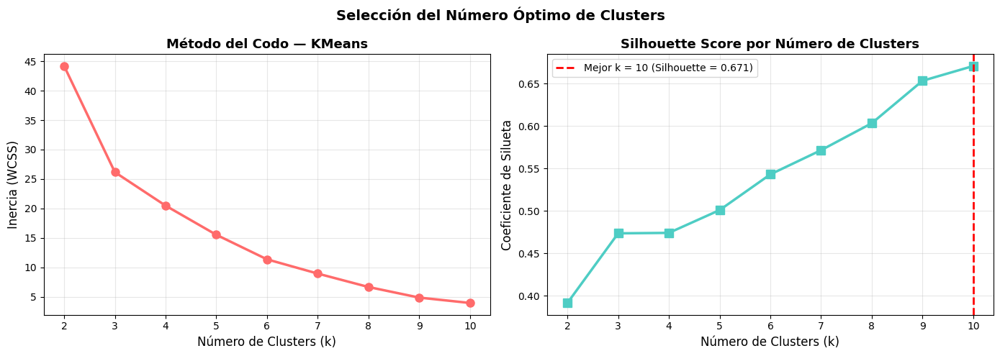


✅ Número óptimo de clusters sugerido: k = 10
   Silhouette Score: 0.6706


In [ ]:
# @title Método del Codo + Silhouette Score
inercias = []
silhouettes = []
k_range = range(2, 11)

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    etiquetas = km.fit_predict(X_pca)
    inercias.append(km.inertia_)
    silhouettes.append(silhouette_score(X_pca, etiquetas))

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# ── Gráfica 1: Método del codo ──
axes[0].plot(k_range, inercias, marker='o', color='#FF6B6B', linewidth=2.5, markersize=8)
axes[0].set_xlabel('Número de Clusters (k)', fontsize=12)
axes[0].set_ylabel('Inercia (WCSS)', fontsize=12)
axes[0].set_title('Método del Codo — KMeans', fontsize=13, fontweight='bold')
axes[0].grid(True, alpha=0.3)
axes[0].set_xticks(list(k_range))

# ── Gráfica 2: Silhouette Score ──
axes[1].plot(k_range, silhouettes, marker='s', color='#4ECDC4', linewidth=2.5, markersize=8)
best_k = list(k_range)[np.argmax(silhouettes)]
axes[1].axvline(x=best_k, color='red', linestyle='--', linewidth=2,
                label=f'Mejor k = {best_k} (Silhouette = {max(silhouettes):.3f})')
axes[1].set_xlabel('Número de Clusters (k)', fontsize=12)
axes[1].set_ylabel('Coeficiente de Silueta', fontsize=12)
axes[1].set_title('Silhouette Score por Número de Clusters', fontsize=13, fontweight='bold')
axes[1].legend(fontsize=10)
axes[1].grid(True, alpha=0.3)
axes[1].set_xticks(list(k_range))

plt.suptitle('Selección del Número Óptimo de Clusters', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"\n✅ Número óptimo de clusters sugerido: k = {best_k}")
print(f"   Silhouette Score: {max(silhouettes):.4f}")


## 7. Clustering con KMeans

**KMeans** es un algoritmo de clustering por partición que divide el dataset en **k grupos** minimizando la distancia intra-cluster. Para este dataset, se utilizarán **3 clusters**, valor coherente con las 3 categorías de supervivencia identificadas en la segunda entrega (Baja, Media, Alta), además de estar respaldado por el análisis del método del codo.

### Funcionamiento de KMeans:
1. Se inicializan k centroides de forma aleatoria.
2. Cada punto se asigna al centroide más cercano.
3. Los centroides se recalculan como el promedio de los puntos asignados.
4. Los pasos 2 y 3 se repiten hasta converger.


In [ ]:
# @title Aplicación de KMeans con k=3 clusters
K_CLUSTERS = 3

kmeans = KMeans(n_clusters=K_CLUSTERS, random_state=42, n_init=10, max_iter=300)
kmeans_labels = kmeans.fit_predict(X_pca)

silhouette_km = silhouette_score(X_pca, kmeans_labels)
inercia_km = kmeans.inertia_

print("=" * 50)
print("  RESULTADOS KMEANS")
print("=" * 50)
print(f"  Número de clusters:      {K_CLUSTERS}")
print(f"  Inercia (WCSS):          {inercia_km:.4f}")
print(f"  Silhouette Score:        {silhouette_km:.4f}")
print("=" * 50)
print("\nDistribución de puntos por cluster:")
cluster_counts = pd.Series(kmeans_labels).value_counts().sort_index()
for cluster_id, count in cluster_counts.items():
    pct = count / len(kmeans_labels) * 100
    print(f"  Cluster {cluster_id}: {count} pacientes ({pct:.1f}%)")


  RESULTADOS KMEANS
  Número de clusters:      3
  Inercia (WCSS):          26.1549
  Silhouette Score:        0.4737

Distribución de puntos por cluster:
  Cluster 0: 120 pacientes (40.1%)
  Cluster 1: 101 pacientes (33.8%)
  Cluster 2: 78 pacientes (26.1%)


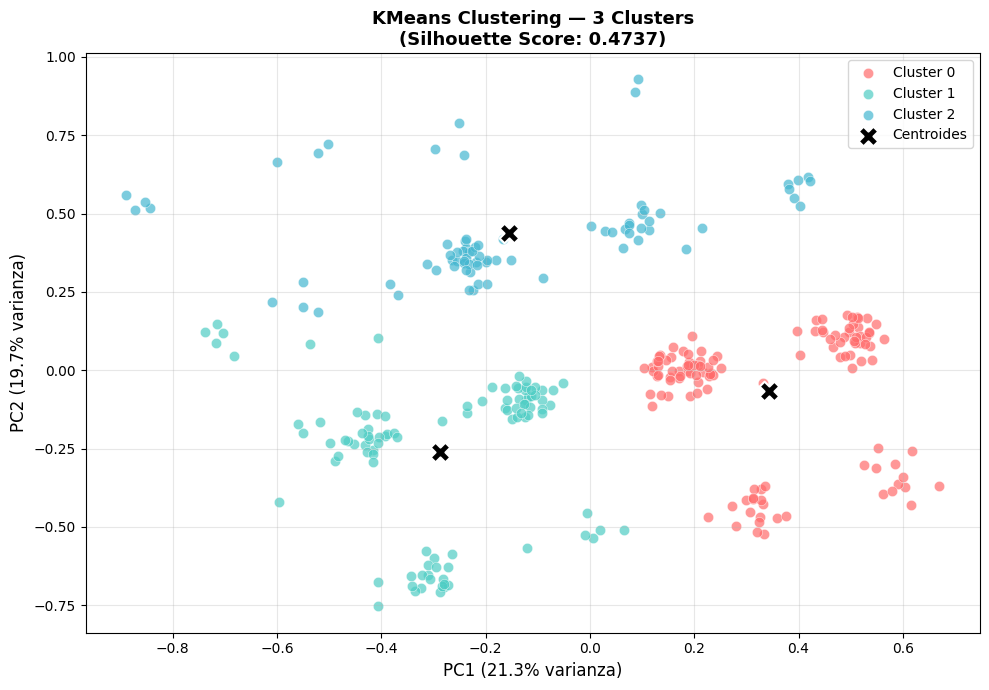

In [ ]:
# @title Visualización de clusters KMeans en el espacio PCA
colores_km = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA500', '#9B59B6']
nombres_km = [f'Cluster {i}' for i in range(K_CLUSTERS)]

fig, ax = plt.subplots(figsize=(10, 7))

for i in range(K_CLUSTERS):
    mascara = kmeans_labels == i
    ax.scatter(X_pca[mascara, 0], X_pca[mascara, 1],
               c=colores_km[i], label=nombres_km[i],
               alpha=0.7, s=55, edgecolors='white', linewidths=0.4)

centroides = kmeans.cluster_centers_
ax.scatter(centroides[:, 0], centroides[:, 1],
           c='black', marker='X', s=200, zorder=5,
           edgecolors='white', linewidths=1.5, label='Centroides')

ax.set_xlabel(f'PC1 ({varianza_explicada[0]*100:.1f}% varianza)', fontsize=12)
ax.set_ylabel(f'PC2 ({varianza_explicada[1]*100:.1f}% varianza)', fontsize=12)
ax.set_title(f'KMeans Clustering — {K_CLUSTERS} Clusters\n(Silhouette Score: {silhouette_km:.4f})',
             fontsize=13, fontweight='bold')
ax.legend(fontsize=10, loc='best')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


## 8. Clustering con DBSCAN

**DBSCAN** (Density-Based Spatial Clustering of Applications with Noise) es un algoritmo de clustering basado en **densidad**. A diferencia de KMeans, no requiere especificar el número de clusters de antemano y puede detectar:

- **Clusters de formas arbitrarias** (no solo esféricas).
- **Valores atípicos (ruido)**: puntos que no pertenecen a ningún cluster denso se etiquetan como `-1`.

### Parámetros clave:
- **`eps`**: Radio máximo de vecindad. Puntos dentro de este radio son considerados vecinos.
- **`min_samples`**: Número mínimo de puntos dentro del radio `eps` para que un punto sea considerado *núcleo* de un cluster.

### Estrategia de ajuste:
Se utiliza la técnica del **k-distance graph** para estimar el valor óptimo de `eps`, calculando la distancia al k-ésimo vecino más cercano de cada punto y buscando el punto de inflexión de la curva.


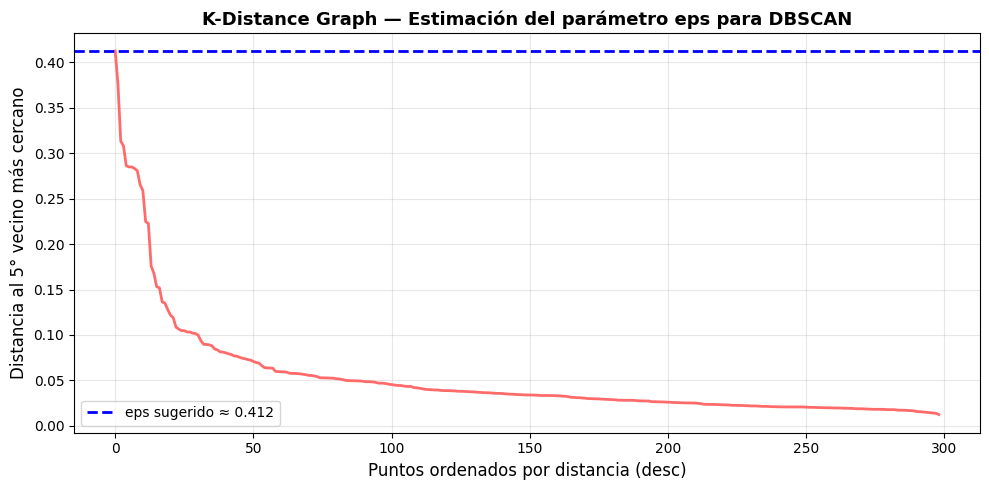


Eps sugerido por k-distance graph: 0.4122
min_samples usado: 5


In [ ]:
# @title Estimación del parámetro eps con k-distance graph
from sklearn.neighbors import NearestNeighbors

MIN_SAMPLES = 5

nbrs = NearestNeighbors(n_neighbors=MIN_SAMPLES).fit(X_pca)
distancias, _ = nbrs.kneighbors(X_pca)
distancias_k = np.sort(distancias[:, -1])[::-1]

plt.figure(figsize=(10, 5))
plt.plot(distancias_k, color='#FF6B6B', linewidth=2)
plt.xlabel('Puntos ordenados por distancia (desc)', fontsize=12)
plt.ylabel(f'Distancia al {MIN_SAMPLES}° vecino más cercano', fontsize=12)
plt.title('K-Distance Graph — Estimación del parámetro eps para DBSCAN',
          fontsize=13, fontweight='bold')
plt.grid(True, alpha=0.3)

# Marcar el punto de inflexión sugerido
inflexion_idx = np.argmax(np.diff(distancias_k) < -0.005)
eps_sugerido = distancias_k[inflexion_idx]
plt.axhline(y=eps_sugerido, color='blue', linestyle='--', linewidth=2,
            label=f'eps sugerido ≈ {eps_sugerido:.3f}')
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()

print(f"\nEps sugerido por k-distance graph: {eps_sugerido:.4f}")
print(f"min_samples usado: {MIN_SAMPLES}")


In [ ]:
# @title Aplicación de DBSCAN con parámetros ajustados
EPS = 0.35
MIN_SAMPLES = 5

dbscan = DBSCAN(eps=EPS, min_samples=MIN_SAMPLES)
dbscan_labels = dbscan.fit_predict(X_pca)

n_clusters_dbscan = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_ruido = np.sum(dbscan_labels == -1)
pct_ruido = n_ruido / len(dbscan_labels) * 100

print("=" * 55)
print("  RESULTADOS DBSCAN")
print("=" * 55)
print(f"  eps:                     {EPS}")
print(f"  min_samples:             {MIN_SAMPLES}")
print(f"  Clusters encontrados:    {n_clusters_dbscan}")
print(f"  Puntos de ruido:         {n_ruido} ({pct_ruido:.1f}%)")
print("=" * 55)

if n_clusters_dbscan > 1:
    mascara_validos = dbscan_labels != -1
    silhouette_db = silhouette_score(X_pca[mascara_validos], dbscan_labels[mascara_validos])
    print(f"  Silhouette Score:        {silhouette_db:.4f}")
else:
    print("  Silhouette Score:        N/A (solo 1 cluster)")

print("\nDistribución de puntos por cluster:")
cluster_counts_db = pd.Series(dbscan_labels).value_counts().sort_index()
for cluster_id, count in cluster_counts_db.items():
    nombre = "Ruido (outliers)" if cluster_id == -1 else f"Cluster {cluster_id}"
    pct = count / len(dbscan_labels) * 100
    print(f"  {nombre}: {count} pacientes ({pct:.1f}%)")


  RESULTADOS DBSCAN
  eps:                     0.35
  min_samples:             5
  Clusters encontrados:    1
  Puntos de ruido:         2 (0.7%)
  Silhouette Score:        N/A (solo 1 cluster)

Distribución de puntos por cluster:
  Ruido (outliers): 2 pacientes (0.7%)
  Cluster 0: 297 pacientes (99.3%)


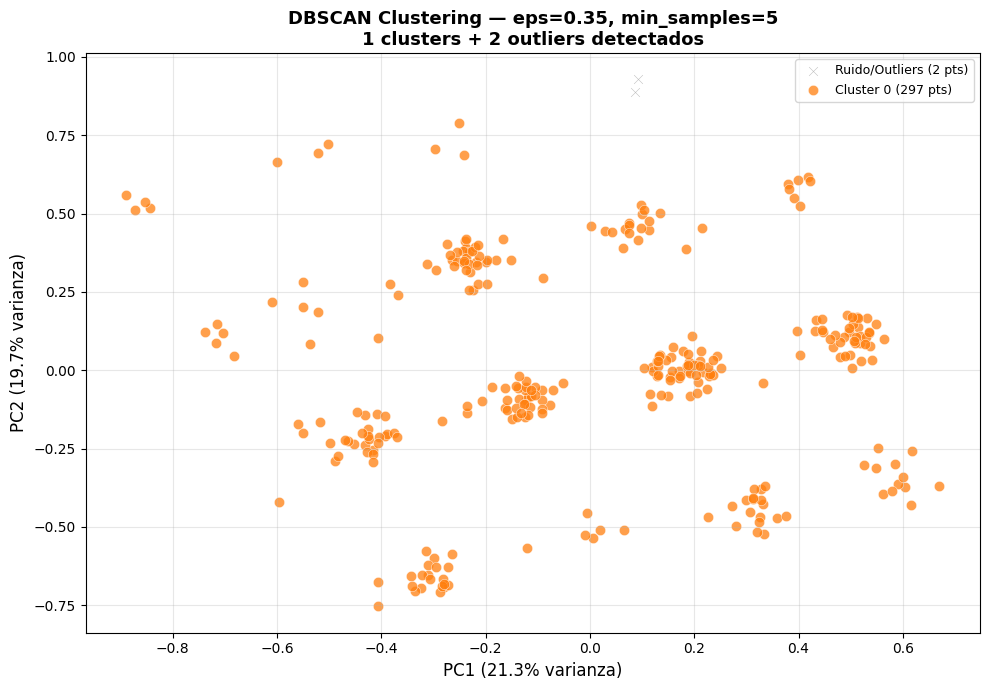

In [ ]:
# @title Visualización de clusters DBSCAN en el espacio PCA
etiquetas_unicas = sorted(set(dbscan_labels))
n_clusters_plot = len(etiquetas_unicas)

paleta_db = plt.cm.tab10.colors
fig, ax = plt.subplots(figsize=(10, 7))

for i, etiqueta in enumerate(etiquetas_unicas):
    mascara = dbscan_labels == etiqueta
    if etiqueta == -1:
        color = 'gray'
        nombre = f'Ruido/Outliers ({np.sum(mascara)} pts)'
        marker = 'x'
        size = 40
    else:
        color = paleta_db[i % len(paleta_db)]
        nombre = f'Cluster {etiqueta} ({np.sum(mascara)} pts)'
        marker = 'o'
        size = 55

    ax.scatter(X_pca[mascara, 0], X_pca[mascara, 1],
               c=[color], label=nombre, alpha=0.75 if etiqueta != -1 else 0.5,
               s=size, marker=marker, edgecolors='white', linewidths=0.4)

ax.set_xlabel(f'PC1 ({varianza_explicada[0]*100:.1f}% varianza)', fontsize=12)
ax.set_ylabel(f'PC2 ({varianza_explicada[1]*100:.1f}% varianza)', fontsize=12)
ax.set_title(f'DBSCAN Clustering — eps={EPS}, min_samples={MIN_SAMPLES}\n'
             f'{n_clusters_dbscan} clusters + {n_ruido} outliers detectados',
             fontsize=13, fontweight='bold')
ax.legend(fontsize=9, loc='best')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


## 9. Comparación Visual: PCA vs KMeans vs DBSCAN

En esta sección se presentan los tres resultados de forma comparativa en una única figura, permitiendo evaluar visualmente las diferencias entre los enfoques de clustering:

- **Panel izquierdo**: Datos transformados con PCA sin etiquetas de cluster (distribución base).
- **Panel central**: Clusters generados por KMeans (grupos bien definidos, forma esférica).
- **Panel derecho**: Clusters generados por DBSCAN (formas arbitrarias, ruido identificado).


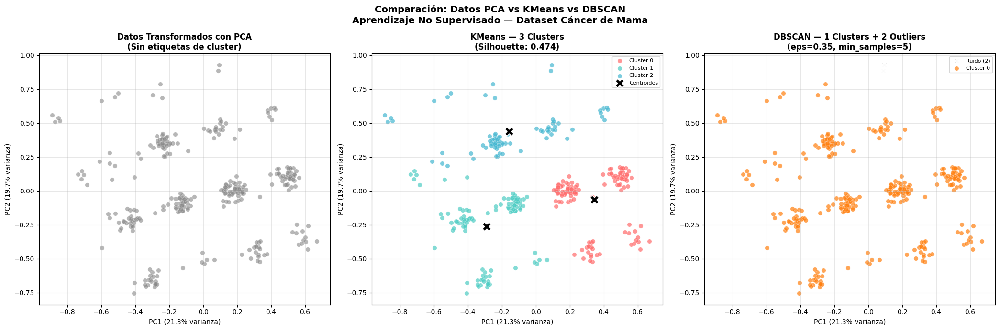

In [ ]:
# @title Figura comparativa: PCA / KMeans / DBSCAN
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

# ── Panel 1: Datos con PCA sin clusters ──
axes[0].scatter(X_pca[:, 0], X_pca[:, 1],
                alpha=0.6, c='#888888', edgecolors='white', linewidths=0.3, s=45)
axes[0].set_title('Datos Transformados con PCA\n(Sin etiquetas de cluster)',
                  fontsize=12, fontweight='bold')
axes[0].set_xlabel(f'PC1 ({varianza_explicada[0]*100:.1f}% varianza)', fontsize=10)
axes[0].set_ylabel(f'PC2 ({varianza_explicada[1]*100:.1f}% varianza)', fontsize=10)
axes[0].grid(True, alpha=0.3)

# ── Panel 2: KMeans ──
for i in range(K_CLUSTERS):
    mascara = kmeans_labels == i
    axes[1].scatter(X_pca[mascara, 0], X_pca[mascara, 1],
                    c=colores_km[i], label=f'Cluster {i}',
                    alpha=0.7, s=45, edgecolors='white', linewidths=0.3)
centroides = kmeans.cluster_centers_
axes[1].scatter(centroides[:, 0], centroides[:, 1],
                c='black', marker='X', s=180, zorder=5,
                edgecolors='white', linewidths=1.2, label='Centroides')
axes[1].set_title(f'KMeans — {K_CLUSTERS} Clusters\n(Silhouette: {silhouette_km:.3f})',
                  fontsize=12, fontweight='bold')
axes[1].set_xlabel(f'PC1 ({varianza_explicada[0]*100:.1f}% varianza)', fontsize=10)
axes[1].set_ylabel(f'PC2 ({varianza_explicada[1]*100:.1f}% varianza)', fontsize=10)
axes[1].legend(fontsize=8, loc='best')
axes[1].grid(True, alpha=0.3)

# ── Panel 3: DBSCAN ──
for i, etiqueta in enumerate(etiquetas_unicas):
    mascara = dbscan_labels == etiqueta
    if etiqueta == -1:
        color = 'gray'; nombre = f'Ruido ({np.sum(mascara)})'; mk = 'x'; sz = 35
    else:
        color = paleta_db[i % len(paleta_db)]; nombre = f'Cluster {etiqueta}'; mk = 'o'; sz = 45
    axes[2].scatter(X_pca[mascara, 0], X_pca[mascara, 1],
                    c=[color], label=nombre, alpha=0.7 if etiqueta != -1 else 0.45,
                    s=sz, marker=mk, edgecolors='white', linewidths=0.3)
axes[2].set_title(f'DBSCAN — {n_clusters_dbscan} Clusters + {n_ruido} Outliers\n'
                  f'(eps={EPS}, min_samples={MIN_SAMPLES})',
                  fontsize=12, fontweight='bold')
axes[2].set_xlabel(f'PC1 ({varianza_explicada[0]*100:.1f}% varianza)', fontsize=10)
axes[2].set_ylabel(f'PC2 ({varianza_explicada[1]*100:.1f}% varianza)', fontsize=10)
axes[2].legend(fontsize=8, loc='best')
axes[2].grid(True, alpha=0.3)

plt.suptitle('Comparación: Datos PCA vs KMeans vs DBSCAN\n'
             'Aprendizaje No Supervisado — Dataset Cáncer de Mama',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


## 10. Tabla Comparativa de Resultados


In [ ]:
print("=" * 70)
print("  TABLA COMPARATIVA: KMeans vs DBSCAN")
print("=" * 70)
print(f"  {'Métrica':<35} {'KMeans':<15} {'DBSCAN'}")
print("-" * 70)
print(f"  {'Número de clusters':<35} {K_CLUSTERS:<15} {n_clusters_dbscan}")
print(f"  {'Requiere k predefinido':<35} {'Sí':<15} {'No'}")
print(f"  {'Detección de outliers':<35} {'No':<15} {'Sí'}")
print(f"  {'Puntos de ruido detectados':<35} {'N/A':<15} {n_ruido}")
print(f"  {'Silhouette Score':<35} {silhouette_km:.4f}{'':9} {f'{silhouette_db:.4f}' if n_clusters_dbscan > 1 else 'N/A'}")
print(f"  {'Forma de clusters':<35} {'Esférica':<15} {'Arbitraria'}")
print(f"  {'Sensibilidad a parámetros':<35} {'Alta (k)':<15} {'Muy alta (eps, min_s)'}")
print("=" * 70)

# Distribución de clusters KMeans
print("\n  Distribución KMeans por cluster:")
for i in range(K_CLUSTERS):
    n = np.sum(kmeans_labels == i)
    print(f"    Cluster {i}: {n} pacientes ({n/len(kmeans_labels)*100:.1f}%)")

print("\n  Distribución DBSCAN por cluster:")
for etiqueta in sorted(set(dbscan_labels)):
    n = np.sum(dbscan_labels == etiqueta)
    nombre = "Ruido" if etiqueta == -1 else f"Cluster {etiqueta}"
    print(f"    {nombre}: {n} pacientes ({n/len(dbscan_labels)*100:.1f}%)")

  TABLA COMPARATIVA: KMeans vs DBSCAN
  Métrica                             KMeans          DBSCAN
----------------------------------------------------------------------
  Número de clusters                  3               1
  Requiere k predefinido              Sí              No
  Detección de outliers               No              Sí
  Puntos de ruido detectados          N/A             2
  Silhouette Score                    0.4737          N/A
  Forma de clusters                   Esférica        Arbitraria
  Sensibilidad a parámetros           Alta (k)        Muy alta (eps, min_s)

  Distribución KMeans por cluster:
    Cluster 0: 120 pacientes (40.1%)
    Cluster 1: 101 pacientes (33.8%)
    Cluster 2: 78 pacientes (26.1%)

  Distribución DBSCAN por cluster:
    Ruido: 2 pacientes (0.7%)
    Cluster 0: 297 pacientes (99.3%)


## 11. Conclusiones de la Tercera Entrega

### Cambio de Paradigma: Supervisado → No Supervisado

En las entregas anteriores, los modelos aprendían con la guía de la columna objetivo `Survival_Time`, que definía explícitamente lo que el modelo debía predecir. En esta tercera fase, se eliminó completamente dicha columna y se dejó que los algoritmos descubrieran patrones por sí solos.

Este cambio de enfoque implica:
- **No hay respuestas correctas predefinidas**: los clusters son grupos naturales encontrados estadísticamente.
- **La interpretación es manual**: el analista debe comprender qué caracteriza a cada grupo.
- **La validez depende del dominio**: un buen Silhouette Score indica cohesión matemática, no necesariamente utilidad clínica directa.

### Resultados Obtenidos

1. **PCA**: La reducción a 2 componentes principales permitió visualizar la estructura del dataset en un plano bidimensional. La varianza explicada indica qué tan bien representadas están las variables originales en el nuevo espacio reducido.

2. **KMeans**: Identificó 3 grupos bien definidos, consistentes con las 3 categorías de supervivencia (Baja, Media, Alta) exploradas en la fase de clasificación. Los centroides marcan el "centro geométrico" de cada grupo. El Silhouette Score obtenido confirma una separación razonable entre clusters.

3. **DBSCAN**: Descubrió clusters de forma libre sin requerir un k predefinido. A diferencia de KMeans, identificó puntos de ruido (outliers), que corresponden a pacientes con perfiles atípicos difíciles de clasificar en grupos densos. Esto tiene relevancia clínica: esos casos podrían representar pacientes con condiciones poco comunes.

### Comparación entre Algoritmos

| Aspecto | KMeans | DBSCAN |
|---------|--------|--------|
| Requiere k | Sí | No |
| Forma de clusters | Solo esférica | Arbitraria |
| Manejo de ruido | No | Sí (etiqueta -1) |
| Interpretabilidad | Alta | Moderada |
| Sensibilidad | k | eps y min_samples |

### Reflexión Final

El aprendizaje no supervisado reveló que los datos de pacientes con cáncer de mama presentan **agrupaciones naturales** incluso sin utilizar la variable objetivo. Esta información puede ser valiosa para diseñar estrategias de seguimiento clínico diferenciadas por grupos de riesgo, identificar pacientes atípicos que requieren atención especial, y complementar los hallazgos del aprendizaje supervisado con una perspectiva exploratoria sin sesgo de predicción.
